In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os

current_dir = os.getcwd()
parent_dir = os.path.dirname(current_dir)
sys.path.append(parent_dir)

from utils.spike_detection import *
from utils.preprocess_neural import *


import matplotlib.pyplot as plt
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams.update({
    "font.family": "Arial",
    "font.size": 6,
    "axes.labelsize": 6,
    "axes.titlesize": 6,
    "xtick.labelsize": 5,
    "ytick.labelsize": 5,
    "xtick.major.size": 1.75,
    "ytick.major.size": 1.75,
    "xtick.minor.size": 1.0,
    "xtick.direction": "in",
    "ytick.direction": "in",
    "ytick.minor.size": 1.0,
    "legend.fontsize": 5,
    "axes.linewidth": 0.5,
})
import matplotlib.cm as cm

import numpy.ma as ma
from scipy.ndimage import gaussian_filter
from tqdm import tqdm
import subprocess
import shutil
import pickle
import glob
from utils.GRC_helpers import *

%matplotlib widget


In [2]:
#data_folder = '../data/CKII_pAce21_PR_20250806'
#data_folder = '../data/CKII_pAce38_PX_20251126'
#data_folder = '../data/CKII_pAce45_PX_20260118'
#data_folder = '../data/CKII_pAce47_PX_20260128'
#data_folder = '../data/CKII_pAce46_PR_20260222'
data_folder = '../data/CKII_pAce50_PRL_20260317'



# turn data_folder into absolute path
data_folder = os.path.abspath(data_folder)
print(f'Loading data from: {data_folder}')

data_name = os.path.basename(data_folder)
figure_save_folder = f'../figures/{data_name}'
figure_save_folder = os.path.abspath(figure_save_folder)
print(f'Figures will be saved to: {figure_save_folder}')
if not os.path.exists(figure_save_folder):
    os.makedirs(figure_save_folder)

Loading data from: /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4/data/CKII_pAce50_PRL_20260317
Figures will be saved to: /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4/figures/CKII_pAce50_PRL_20260317


In [3]:
# load merged data 

merged_data_path_CS = os.path.join(data_folder, 'merged_aligned_data.pkl')
with open(merged_data_path_CS, 'rb') as f:
    loaded_merged_data_CS = pickle.load(f)
    traces = loaded_merged_data_CS['traces']
    spikes = loaded_merged_data_CS['spikes']
    speed = loaded_merged_data_CS['speed']
    ts_neural = loaded_merged_data_CS['ts_neural']
    x_neural = loaded_merged_data_CS['x_neural']
    y_neural = loaded_merged_data_CS['y_neural']
    hd_angles_neural = loaded_merged_data_CS['hd_angles_neural']
    weights_all = loaded_merged_data_CS['weights_all']
    mean_images = loaded_merged_data_CS['mean_images']
    frame_rate = loaded_merged_data_CS['frame_rate']
    frame_width = loaded_merged_data_CS['frame_width']
    frame_height = loaded_merged_data_CS['frame_height']
    subfolders = loaded_merged_data_CS['subfolders']
    complex_bursts_dicts = loaded_merged_data_CS['complex_bursts_dicts']
    refined_SS = loaded_merged_data_CS['refined_SS']
    all_CS_spikes = loaded_merged_data_CS['all_CS_spikes']
    all_spikes = loaded_merged_data_CS['all_spikes']
    spike_heights_interpolated = loaded_merged_data_CS['spike_heights_interpolated']
    SNR_interpolated = loaded_merged_data_CS['SNR_interpolated']    
    session_start_frames = loaded_merged_data_CS['session_start_frames']
    traces_SNR_interpolated = loaded_merged_data_CS['traces_SNR_interpolated']
    Vm_SNR_interpolated = loaded_merged_data_CS['Vm_SNR_interpolated']
    burst_metrics = loaded_merged_data_CS['burst_metrics']
    plateaus_dicts = loaded_merged_data_CS.get('plateaus_dicts', None)

print(f"Loaded data from {merged_data_path_CS}")
if plateaus_dicts is not None:
    print(f"Loaded plateaus_dicts for {len(plateaus_dicts)} cells")
else:
    print("No plateaus_dicts found in merged data")

Loaded data from /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4/data/CKII_pAce50_PRL_20260317/merged_aligned_data.pkl
Loaded plateaus_dicts for 9 cells


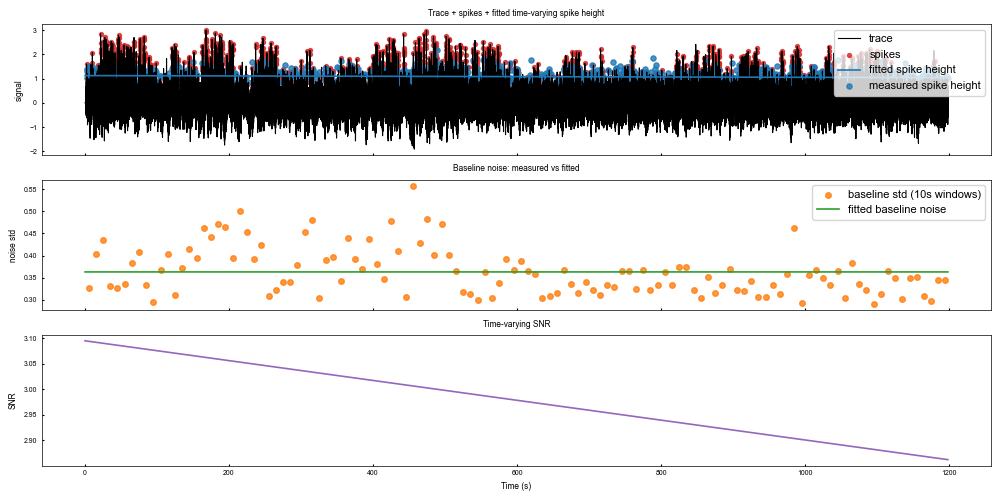

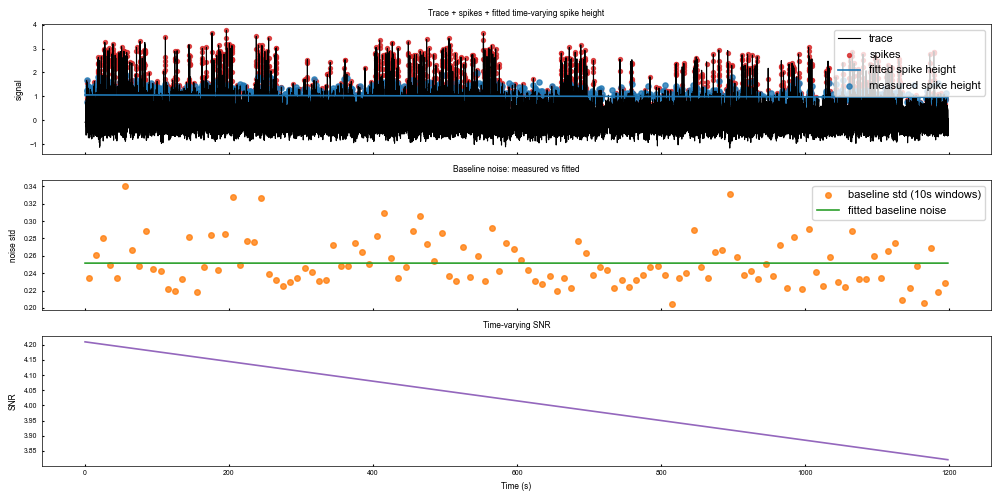

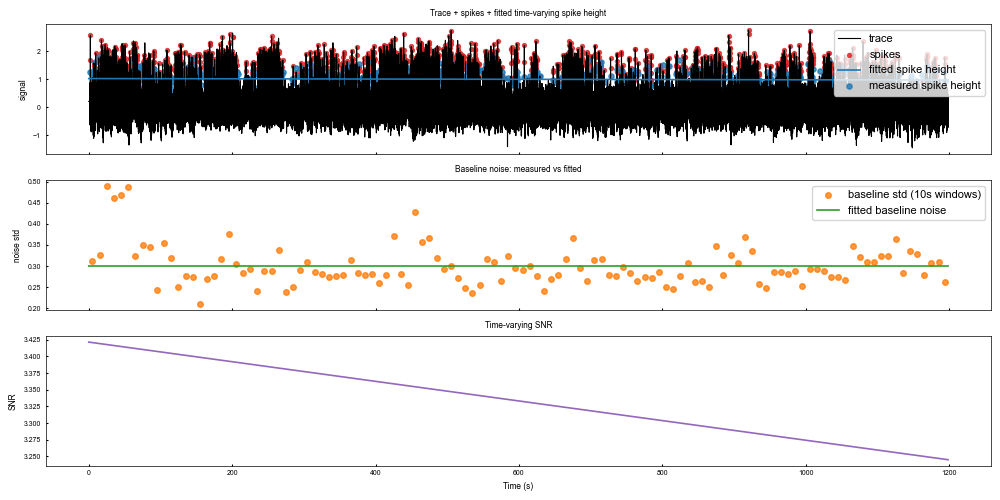

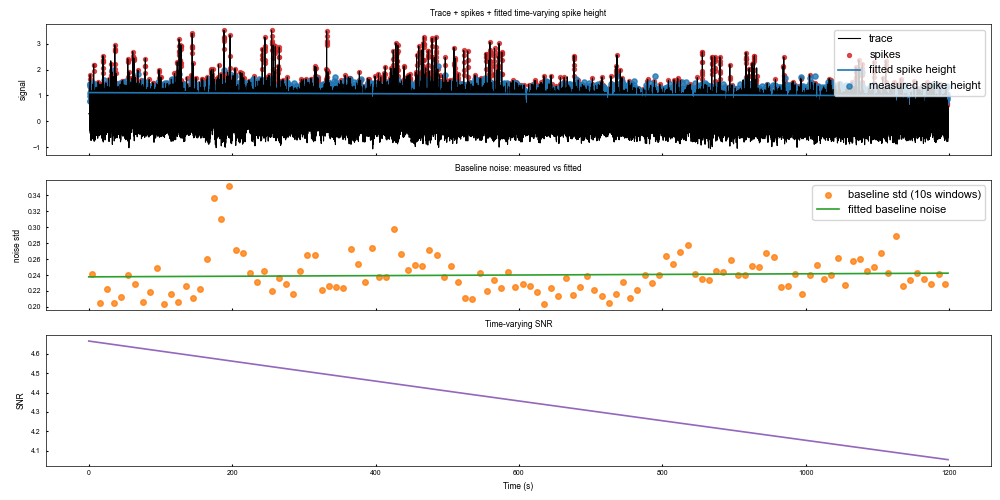

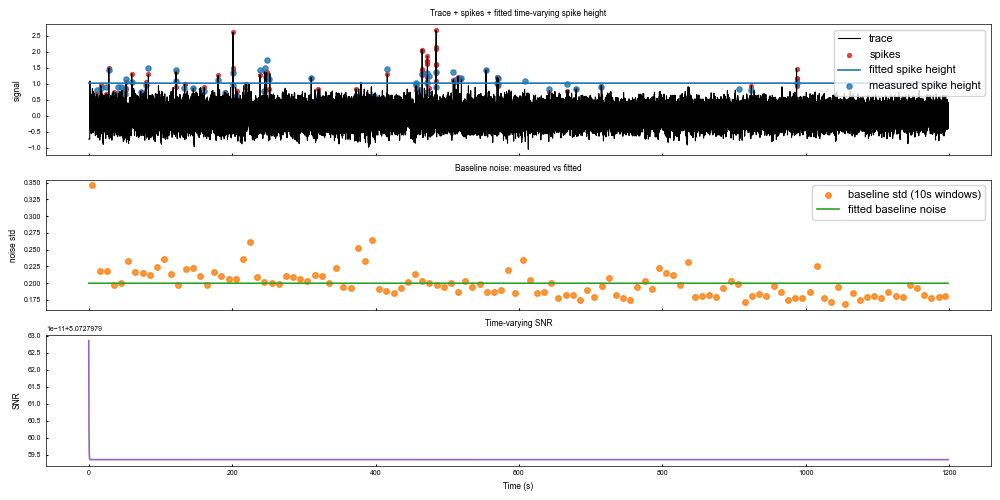

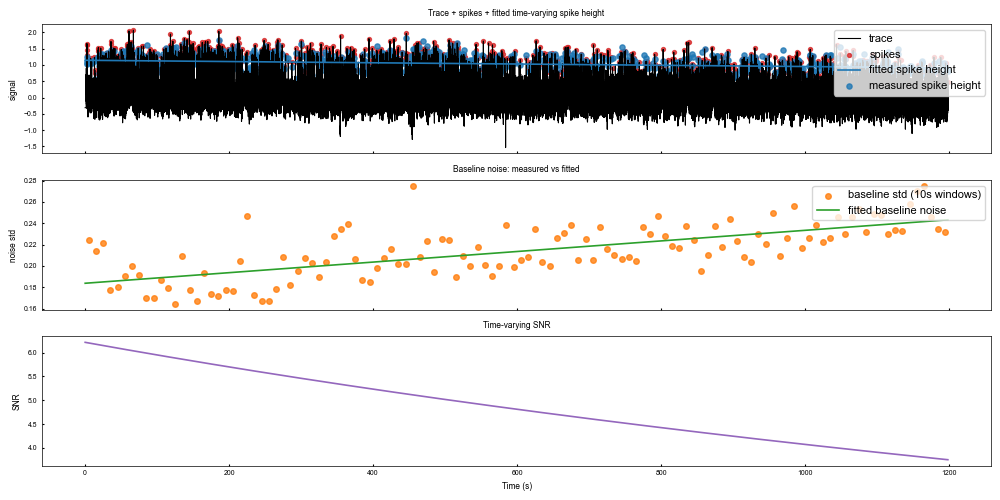

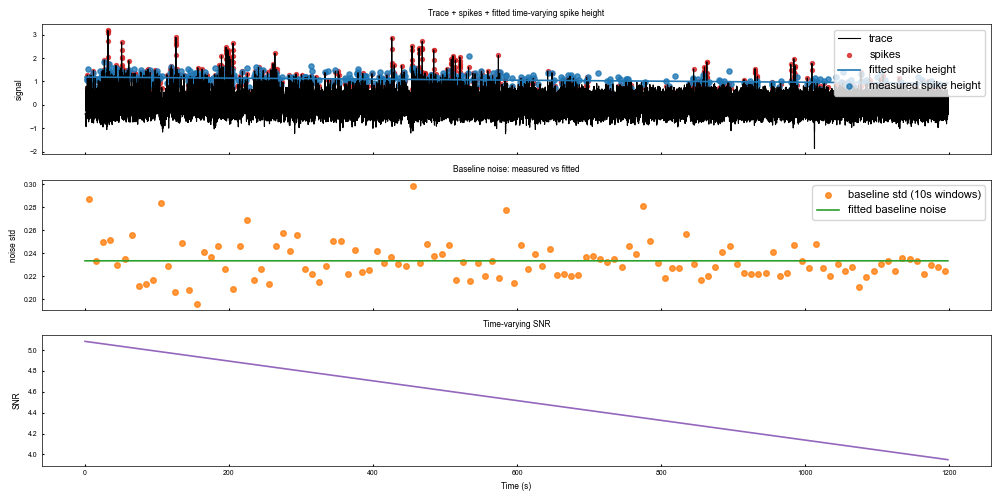

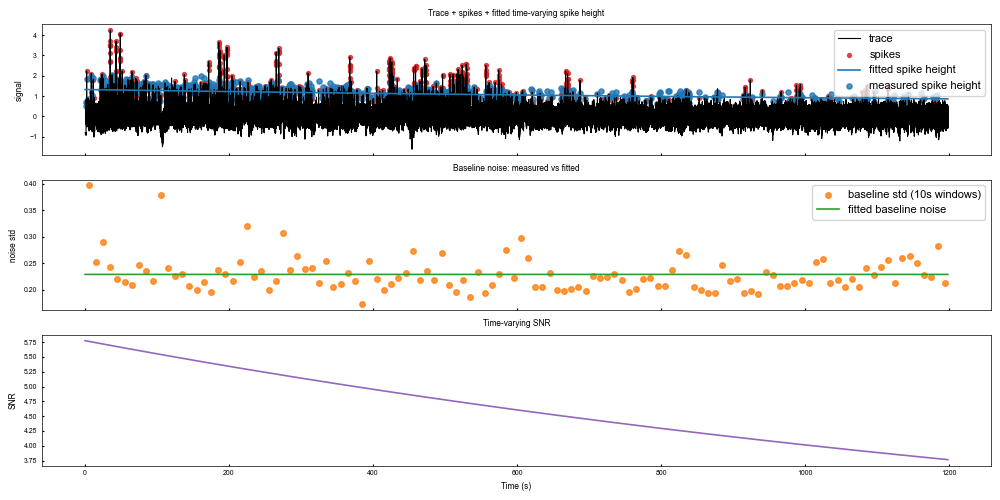

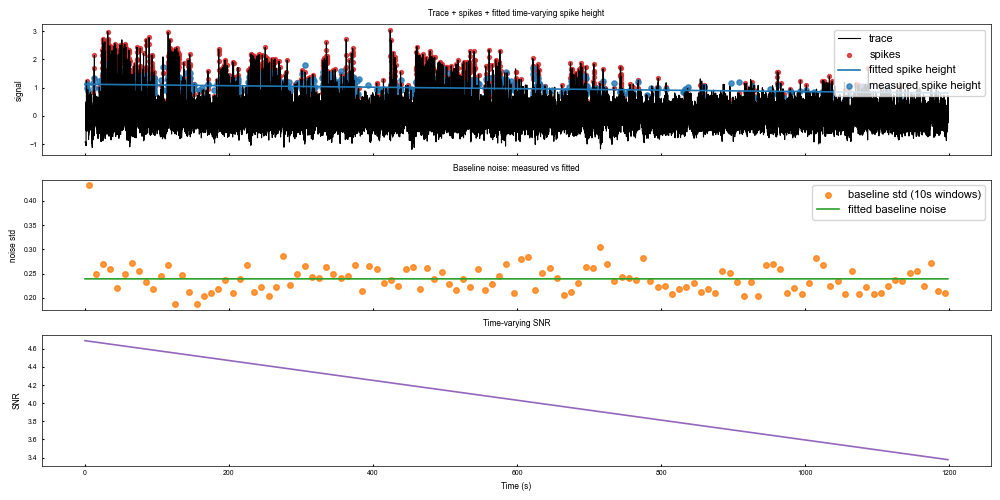

In [4]:
SNR_all = []
for idx in range(len(traces)):
    trace = traces_SNR_interpolated[idx]
    spks = all_spikes[idx]
    complex_bursts_dict = complex_bursts_dicts[idx]

    res = compute_time_varying_snr_from_trace(
        trace=trace,
        spks=spks,
        complex_burst_dict=complex_bursts_dict,
        sampling_rate_hz=frame_rate,
        isi_threshold_ms=20,
        spike_baseline_points=3,
        spike_remove_points=3,
        baseline_window_seconds=10,
        plot_single_cell=True,
    )

    snr_t = res["snr_time_varying"]
    SNR_all.append(snr_t)



In [5]:
# print how many time points are NaN in x_neural and y_neural out of total time points
num_nan_x = np.isnan(x_neural).sum()
num_nan_y = np.isnan(y_neural).sum()
print(f'Number of NaN in x_neural: {num_nan_x} out of {len(x_neural)} time points', f'{num_nan_x/len(x_neural)*100:.2f}%')

# print how many time points are NaN in hd_angles_neural out of total time points
num_nan_hd = np.isnan(hd_angles_neural).sum()
print(f'Number of NaN in hd_angles_neural: {num_nan_hd} out of {len(hd_angles_neural)} time points', f'{num_nan_hd/len(hd_angles_neural)*100:.2f}%')



Number of NaN in x_neural: 0 out of 599087 time points 0.00%
Number of NaN in hd_angles_neural: 34283 out of 599087 time points 5.72%


In [6]:
# Optional: Remove bad SNR segments
spikes = all_spikes.copy()
traces = traces_SNR_interpolated
Vms = Vm_SNR_interpolated

SNR_threshold = 3.5
bad_masks = []

# Mask for frames with no valid position data (shared across all cells)
pos_nan_mask = np.isnan(x_neural)
n_pos_bad = np.sum(pos_nan_mask)
n_total = len(x_neural)
print(f'Global: {n_pos_bad}/{n_total} frames ({100*n_pos_bad/n_total:.1f}%) have no valid position')

# Now for each cell: remove spikes and make traces and Vms NaN where its SNR_interpolated < SNR_threshold or position is NaN
for cell_idx in range(len(spikes)):
    snr_vals = np.asarray(SNR_interpolated[cell_idx])
    if snr_vals.ndim == 0:
        bad_mask = pos_nan_mask.copy()
    else:
        bad_mask = (snr_vals < SNR_threshold) | pos_nan_mask
    bad_masks.append(bad_mask)
    if not np.any(bad_mask):
        continue

    traces[cell_idx][bad_mask] = np.nan
    Vms[cell_idx][bad_mask] = np.nan

    def _filter_spikes(spk_arr, bad_mask_local):
        spk_arr = np.asarray(spk_arr, dtype=np.int64)
        if spk_arr.size == 0:
            return spk_arr
        spk_arr = spk_arr[(spk_arr >= 0) & (spk_arr < bad_mask_local.shape[0])]
        return spk_arr[~bad_mask_local[spk_arr]]

    spikes[cell_idx] = _filter_spikes(spikes[cell_idx], bad_mask)
    all_CS_spikes[cell_idx] = _filter_spikes(all_CS_spikes[cell_idx], bad_mask)
    refined_SS[cell_idx] = _filter_spikes(refined_SS[cell_idx], bad_mask)

    n_snr_bad = np.sum(snr_vals < SNR_threshold) if snr_vals.ndim > 0 else 0
    print(f'Cell {cell_idx}: removed {np.sum(bad_mask)} bad frames ({n_snr_bad} low SNR + {n_pos_bad} no position), spikes: {len(loaded_merged_data_CS["all_spikes"][cell_idx])} -> {len(spikes[cell_idx])}')

bad_masks = np.array(bad_masks)

Global: 0/599087 frames (0.0%) have no valid position


# Animal + Cage

In [7]:
# avi_matches = glob.glob(os.path.join(subfolders[0], "*.avi"))
# if not avi_matches:
#     raise FileNotFoundError(f"No .avi files found in {subfolders[0]}")
# behav_video_path = sorted(avi_matches)[0]

# fig, ax = plt.subplots(figsize=(3,3))
# behav_img = plot_annotated_behavior_frame(behav_video_path, 1200, ax)
# out_path = os.path.join(
#     figure_save_folder,
#     "behavior_frame1200_annotated.svg"
# )
# plt.rcParams["svg.fonttype"] = "none" 
# fig.savefig(out_path, dpi=300)
# print(f"Saved to {out_path}")

# plt.show()

# Speed Epochs Plotting

Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4/figures/CKII_pAce50_PRL_20260317/speed_with_epochs_speed3_quiet0.5.svg


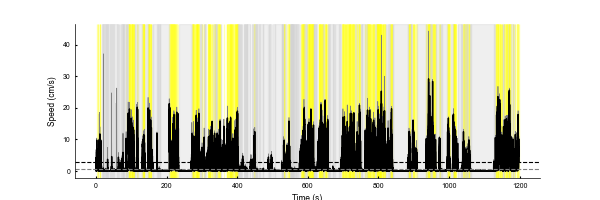

In [8]:
fig, ax = plt.subplots(figsize=(6, 2))

### Works for pAce38
# speed_threshold = 4
# min_duration_s = 0.25
# merge_gap_s = 0.2
# kernel_size = 51

### Works for pAce21 2025-08-06
speed_threshold = 3
speed_threshold_quiet = 0.5
min_duration_s = 0.25
merge_gap_s = 0.
kernel_size = 51
# Plot moving epochs (yellow) + quiet epochs (gray)
_, _, _ = plot_speed_with_moving_epochs(speed, frame_rate, speed_threshold=speed_threshold, kernel_size=kernel_size, filter_type="boxcar", ax=ax, min_duration_s=min_duration_s, merge_gap_s=merge_gap_s)
_, _, _ = plot_speed_with_quiet_epochs(speed, frame_rate, speed_threshold_quiet=speed_threshold_quiet, kernel_size=kernel_size, filter_type="boxcar", ax=ax, min_duration_s=min_duration_s, merge_gap_s=merge_gap_s, plot_lines=False)

out_path = os.path.join(
    figure_save_folder,
    f"speed_with_epochs_speed{speed_threshold}_quiet{speed_threshold_quiet}.svg",
)
plt.rcParams["svg.fonttype"] = "none"
fig.savefig(out_path, dpi=300)
print(f"Saved to {out_path}")


# Spike maps, all cells

Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4/figures/CKII_pAce50_PRL_20260317/trajectory_with_spikes_speed3.svg


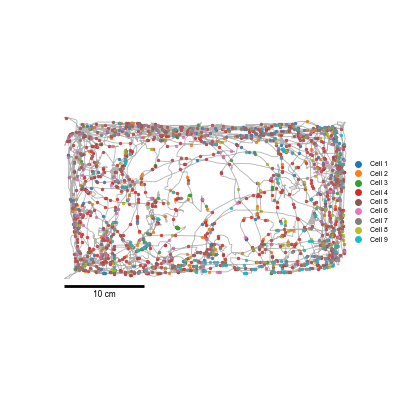

In [9]:
fig, ax = plt.subplots(figsize=(4, 4))
plot_trajectory_with_spikes(
    x_neural, y_neural, spikes, speed, frame_rate,
    ax=ax,
    kernel_size=kernel_size, filter_type="boxcar",
    speed_threshold=speed_threshold, min_duration_s=min_duration_s, merge_gap_s=merge_gap_s
)

out_path = os.path.join(
    figure_save_folder,
    f"trajectory_with_spikes_speed{speed_threshold}.svg"
)
plt.rcParams["svg.fonttype"] = "none" 
fig.savefig(out_path, dpi=300)
print(f"Saved to {out_path}")


# Spatial heatmaps for all cells

/var/folders/8g/cpkd0cfs4gn915zwbfdfgf9w0000gn/T/ipykernel_8987/1380902839.py:95: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  fig.savefig(out_path, dpi=300)


Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4/figures/CKII_pAce50_PRL_20260317/place_cell_single_moving_speed3.svg


/opt/homebrew/Caskroom/miniforge/base/envs/AdamLab/lib/python3.11/site-packages/ipympl/backend_nbagg.py:342: UserWarning: Glyph 9733 (\N{BLACK STAR}) missing from font(s) Arial.
  self.figure.savefig(buf, format='png', dpi='figure')


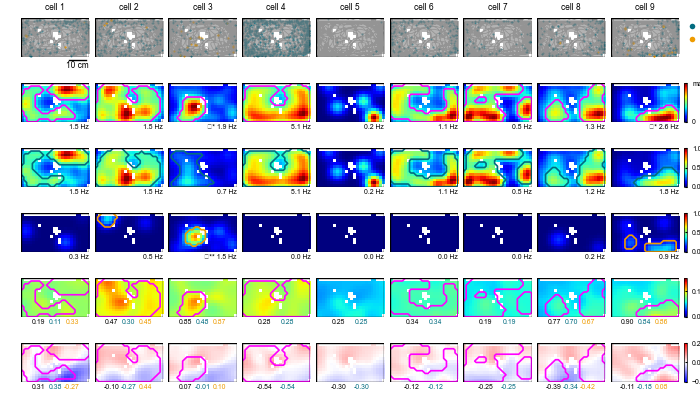

In [10]:
# Place cell definition:
# A cell is classified as a place cell if it has statistically significant spatial information (p < 0.05 via circular shuffle), 
# a valid place field (≥30% of peak rate, within size limits), 
# and sufficient peak firing rate (≥0.5 Hz).

place_field_threshold = 0.4
min_peak_rate = 0.4  # Minimum peak firing rate (Hz) for place cell classification
max_field_area_ratio = 1/2
min_field_bins = 10


theta_freqs = [4, 8]
slow_freqs = 2

# Custom cell order: specify which cells to plot and in what order
# Use original 0-indexed cell indices; set to None to use all cells in order

# [0, 2, 3, 6, 8, 1, 5, 4, 7] for pAce38

cell_order = None

if cell_order is None:
    cell_order = list(range(len(spikes)))

# Initialize PC_output_all with None for all cells, indexed by original cell index
PC_output_all = [None] * len(spikes)

num_cols = len(cell_order)
fig, axes = plt.subplots(6, num_cols, figsize=(7,4), sharex=True, sharey=True)

for col_idx, cell_idx in enumerate(cell_order):
    out = analyze_place_cell_single_moving(
        x_neural, y_neural, spikes, speed, frame_rate,
        cell_idx=cell_idx,
        axes=axes[:, col_idx],
        place_field_threshold = place_field_threshold,
        min_field_bins = min_field_bins,
        speed_threshold=speed_threshold,
        kernel_size=kernel_size,
        filter_type="boxcar",
        min_duration_s=min_duration_s, merge_gap_s=merge_gap_s,
        plot_pf_contours=True,
        max_field_area_ratio=max_field_area_ratio,
        bad_timepoints=bad_masks[cell_idx] if bad_masks is not None else None,
        num_shuffles=1000,
        random_seed=42,
        plot_sub=True,
        traces=traces,
        theta_freqs=theta_freqs,
        slow_freqs=slow_freqs,
        separate_spikes=True,
        refined_SS=refined_SS,
        all_CS_spikes=all_CS_spikes,
        complex_bursts_dicts=complex_bursts_dicts,
        save_spike_shapes=True,
        ss_shape_pre_ms=10.0,
        ss_shape_post_ms=10.0,
        cb_shape_pre_ms=20.0,
        cb_shape_post_ms=80.0,
        save_burst_metrics=True,
        burst_metrics=burst_metrics,
        include_simple_bursts_metrics=False,
        save_spike_burst_rate_metrics=True,
        min_cb_bursts_per_condition=5,
        display_cell_num=cell_idx + 1,  # Display original cell number (1-indexed)
        is_first_column=(col_idx == 0),
        is_last_column=(col_idx == num_cols - 1),
        min_occupancy_s=0.001,
        occ_smooth_sigma=2.0,
        display_PF_SS_CS=True,
        min_peak_rate=min_peak_rate,
        ss_shape_min_separation_ms=14.0,
    )
    # Store result at the original cell index, not the display order
    PC_output_all[cell_idx] = out

# Set theta Vm color range for the second to last row
for ax in axes[-2, :]:
    if ax.images:
        ax.images[0].set_clim(0, 0.15)

# Set slow Vm color range for the last row
for ax in axes[-1, :]:
    if ax.images:
        ax.images[0].set_clim(-0.2, 0.2)

plt.subplots_adjust(left=0.03, right=0.97, top=0.98, bottom=0.02, wspace=0.08, hspace=0.1)

out_path = os.path.join(
    figure_save_folder,
    f"place_cell_single_moving_speed{speed_threshold}.svg"
)
plt.rcParams["svg.fonttype"] = "none"  # keep text editable in SVG

fig.savefig(out_path, dpi=300)
print(f"Saved to {out_path}")

In [84]:
# # Head-direction vector fields (moving epochs): All / Simple / Complex
# vector_output_all, fig, axes = plot_hd_vector_fields_all_cells_moving(
#     x_neural, y_neural, hd_angles_neural, spikes, speed, frame_rate,
#     refined_SS=refined_SS,
#     all_CS_spikes=all_CS_spikes,
#     pc_output_all=PC_output_all,
#     cell_order=cell_order,
#     width_real=35.5,
#     height_real=20,
#     bin_size=3,
#     kernel_size=kernel_size,
#     filter_type="boxcar",
#     speed_threshold=speed_threshold,
#     min_duration_s=min_duration_s,
#     merge_gap_s=merge_gap_s,
#     bad_timepoints_all=bad_masks if bad_masks is not None else None,
#     min_spikes_per_bin=10,
#     min_visited_angle_bins=2,
#     pref_angle_std_threshold=0.,
#     hd_bin_size_deg=15,
#     direction_mode="head",  # "head" or "travel"
#     travel_smooth_window=5,
#     travel_min_step=0.0,
#     cmap=None,
#     add_colorbar=False,
#     show_trajectory=True,
#     use_normalized_rate=False,
#     max_arrow_std_factor=None,
#     max_arrow_length='PF_mean',  # use mean displayed rate inside PF as cap
# )

# plt.subplots_adjust(left=0.03, right=0.97, top=0.96, bottom=0.03, wspace=0.08, hspace=0.05)

# out_path = os.path.join(
#     figure_save_folder,
#     f"hd_vector_fields_speed{speed_threshold}.svg"
# )
# plt.rcParams["svg.fonttype"] = "none"
# fig.savefig(out_path, dpi=300)
# print(f"Saved to {out_path}")


In [85]:
# # Head-direction vector fields (moving epochs): All / Simple / Complex
# vector_output_all, fig, axes = plot_hd_vector_fields_all_cells_moving(
#     x_neural, y_neural, hd_angles_neural, spikes, speed, frame_rate,
#     refined_SS=refined_SS,
#     all_CS_spikes=all_CS_spikes,
#     pc_output_all=PC_output_all,
#     cell_order=cell_order,
#     width_real=35.5,
#     height_real=20,
#     bin_size=3,
#     kernel_size=kernel_size,
#     filter_type="boxcar",
#     speed_threshold=speed_threshold,
#     min_duration_s=min_duration_s,
#     merge_gap_s=merge_gap_s,
#     bad_timepoints_all=bad_masks if bad_masks is not None else None,
#     min_spikes_per_bin=10,
#     min_visited_angle_bins=2,
#     pref_angle_std_threshold=0.,
#     hd_bin_size_deg=15,
#     direction_mode="travel",  # "head" or "travel"
#     travel_smooth_window=5,
#     travel_min_step=0.0,
#     cmap=None,
#     add_colorbar=False,
#     show_trajectory=True,
#     use_normalized_rate=False,
#     max_arrow_std_factor=None,
#     max_arrow_length='PF_mean',  # use mean displayed rate inside PF as cap
# )

# plt.subplots_adjust(left=0.03, right=0.97, top=0.96, bottom=0.03, wspace=0.08, hspace=0.05)

# out_path = os.path.join(
#     figure_save_folder,
#     f"travel_vector_fields_speed{speed_threshold}.svg"
# )
# plt.rcParams["svg.fonttype"] = "none"
# fig.savefig(out_path, dpi=300)
# print(f"Saved to {out_path}")


# Bin by bin directionality analysis

In [ ]:
# Bin-by-bin directionality analysis (one figure per cell)
# Left: 3 vector maps (All / SS / CS)
# Right: per-spatial-bin tiny polar tuning + occupancy panels

# -------------------------
# User-tunable parameters
# -------------------------
cell_idx_plot = 0                 # set one cell to preview

# Match your current direction/vector settings
direction_mode = "head"          # "head" or "travel"
vector_bin_size = 4
hd_bin_size_deg = 30

# Thresholds
min_spikes_per_bin = 10
min_visited_angle_bins = 2
min_visited_angle_separation_deg = 45  # require visited bins to span at least this angle
min_occ_frames_per_angle = 100      # occupancy floor per angle bin (frames)
hd_count_smooth_sigma = 0.0       # smooth counts/time before division
min_pref_vector_strength = 0.0     # 0-1, occupancy-corrected tuning vector strength cutoff
preferred_angle_mode = "peak_cluster_mean"  # "peak", "circular_mean", "peak_cluster_mean"
pref_angle_std_threshold = 0.0

# Display/capping
use_normalized_rate = False
max_arrow_length = "pf_peak"     # numeric / "pf_peak" / "pf_mean" / None
max_arrow_std_factor = None
polar_smooth_sigma = 1
tuning_curve_color = "red"
mini_pref_arrow_length_mode = "vector_strength"  # "fixed", "vector_strength", "selectivity"
mini_pref_arrow_length_min = 0.15
mini_pref_arrow_length_max = 0.95

# Layout
right_panel_width_mode = "auto"
figsize_base = (6.5, 5.0)
pf_bg_alpha = 0.05
occupancy_style = "fan"  # "line", "fan", "fan+line"
tuning_style = "fan"     # "line", "fan", "fan+line"
show_trajectory = True

# -------------------------
# Single-cell preview
# -------------------------
bad_tp_single = None
if 'bad_masks' in globals() and bad_masks is not None and cell_idx_plot < len(bad_masks):
    bad_tp_single = bad_masks[cell_idx_plot]

fig, axes_main, axes_polar, bin_dir_result = plot_hd_vector_fields_single_cell_moving_with_bin_polar(
    x_neural, y_neural, hd_angles_neural, spikes, speed, frame_rate,
    cell_idx=cell_idx_plot,
    refined_SS=refined_SS,
    all_CS_spikes=all_CS_spikes,
    pc_output_all=PC_output_all,
    width_real=36,
    height_real=20,
    bin_size=vector_bin_size,
    kernel_size=kernel_size,
    filter_type="boxcar",
    speed_threshold=speed_threshold,
    min_duration_s=min_duration_s,
    merge_gap_s=merge_gap_s,
    bad_timepoints=bad_tp_single,
    min_spikes_per_bin=min_spikes_per_bin,
    min_visited_angle_bins=min_visited_angle_bins,
    min_visited_angle_separation_deg=min_visited_angle_separation_deg,
    min_occ_frames_per_angle=min_occ_frames_per_angle,
    hd_count_smooth_sigma=hd_count_smooth_sigma,
    min_pref_vector_strength=min_pref_vector_strength,
    preferred_angle_mode=preferred_angle_mode,
    pref_angle_std_threshold=pref_angle_std_threshold,
    hd_bin_size_deg=hd_bin_size_deg,
    direction_mode=direction_mode,
    travel_smooth_window=5,
    travel_min_step=0.0,
    show_trajectory=show_trajectory,
    use_normalized_rate=use_normalized_rate,
    max_arrow_length=max_arrow_length,
    max_arrow_std_factor=max_arrow_std_factor,
    polar_smooth_sigma=polar_smooth_sigma,
    pf_bg_alpha=pf_bg_alpha,
    tuning_curve_color=tuning_curve_color,
    mini_pref_arrow_length_mode=mini_pref_arrow_length_mode,
    mini_pref_arrow_length_min=mini_pref_arrow_length_min,
    mini_pref_arrow_length_max=mini_pref_arrow_length_max,
    occupancy_style=occupancy_style,
    tuning_style=tuning_style,
    right_panel_width_mode=right_panel_width_mode,
    figsize_base=figsize_base,
    save_path=None,
    return_data=True,
)

out_preview = os.path.join(
    figure_save_folder,
    f"bin_by_bin_directionality_{direction_mode}_cell{cell_idx_plot+1}.svg"
)
plt.rcParams["svg.fonttype"] = "none"
fig.savefig(out_preview, dpi=300, bbox_inches="tight")
print(f"Saved preview to {out_preview}")



In [ ]:
# Match your current direction/vector settings
direction_mode = "head"          # "head" or "travel"
vector_bin_size = 4
hd_bin_size_deg = 30

# Thresholds
min_spikes_per_bin = 10
min_visited_angle_bins = 2
min_visited_angle_separation_deg = 45  # require visited bins to span at least this angle
min_occ_frames_per_angle = 100      # occupancy floor per angle bin (frames)
hd_count_smooth_sigma = 0.0       # smooth counts/time before division
min_pref_vector_strength = 0.0     # 0-1, occupancy-corrected tuning vector strength cutoff
preferred_angle_mode = "peak_cluster_mean"  # "peak", "circular_mean", "peak_cluster_mean"
pref_angle_std_threshold = 0.0

# Display/capping
use_normalized_rate = False
max_arrow_length = "pf_peak"     # numeric / "pf_peak" / "pf_mean" / None
max_arrow_std_factor = None
polar_smooth_sigma = 1
tuning_curve_color = "red"
mini_pref_arrow_length_mode = "vector_strength"  # "fixed", "vector_strength", "selectivity"
mini_pref_arrow_length_min = 0.15
mini_pref_arrow_length_max = 0.95

# Layout
right_panel_width_mode = "auto"
figsize_base = (6.5, 5.0)
pf_bg_alpha = 0.05
occupancy_style = "fan"  # "line", "fan", "fan+line"
tuning_style = "fan"     # "line", "fan", "fan+line"
show_trajectory = True

# -------------------------
# Single-cell preview
# -------------------------


run_all_cells = True             # set True to save one figure per cell
if run_all_cells:
    out_dir = os.path.join(figure_save_folder, f"bin_by_bin_directionality_{direction_mode}")
    outputs = plot_hd_vector_fields_all_cells_moving_with_bin_polar(
        x_neural, y_neural, hd_angles_neural, spikes, speed, frame_rate,
        refined_SS=refined_SS,
        all_CS_spikes=all_CS_spikes,
        pc_output_all=PC_output_all,
        cell_order=cell_order,
        width_real=35.5,
        height_real=20,
        bin_size=vector_bin_size,
        kernel_size=kernel_size,
        filter_type="boxcar",
        speed_threshold=speed_threshold,
        min_duration_s=min_duration_s,
        merge_gap_s=merge_gap_s,
        bad_timepoints_all=bad_masks if bad_masks is not None else None,
        min_spikes_per_bin=min_spikes_per_bin,
        min_visited_angle_bins=min_visited_angle_bins,
        min_visited_angle_separation_deg=min_visited_angle_separation_deg,
        min_occ_frames_per_angle=min_occ_frames_per_angle,
        hd_count_smooth_sigma=hd_count_smooth_sigma,
        min_pref_vector_strength=min_pref_vector_strength,
        preferred_angle_mode=preferred_angle_mode,
        pref_angle_std_threshold=pref_angle_std_threshold,
        hd_bin_size_deg=hd_bin_size_deg,
        direction_mode=direction_mode,
        travel_smooth_window=5,
        travel_min_step=0.0,
        show_trajectory=show_trajectory,
        use_normalized_rate=use_normalized_rate,
        max_arrow_length=max_arrow_length,
        max_arrow_std_factor=max_arrow_std_factor,
        polar_smooth_sigma=polar_smooth_sigma,
        pf_bg_alpha=pf_bg_alpha,
        tuning_curve_color=tuning_curve_color,
        mini_pref_arrow_length_mode=mini_pref_arrow_length_mode,
        mini_pref_arrow_length_min=mini_pref_arrow_length_min,
        mini_pref_arrow_length_max=mini_pref_arrow_length_max,
        occupancy_style=occupancy_style,
        tuning_style=tuning_style,
        right_panel_width_mode=right_panel_width_mode,
        figsize_base=figsize_base,
        save_dir=out_dir,
        save_prefix=f"bin_by_bin_{direction_mode}",
        save_ext="svg",
        close_figures=True,
        return_data=False,
    )
    print(f"Saved {len(outputs)} cell figures to {out_dir}")

Saved 9 cell figures to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce38_PX_20251126/bin_by_bin_directionality_head


# Theta Vm

In [51]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy import stats


# theta_run_in = []
# theta_run_out = []
# theta_rest_in = []
# theta_rest_out = []

# for i in range(len(spikes)):
#     # out_sub = get_subthreshold_activity(
#     #     traces, all_spikes, all_CS_spikes, refined_SS, complex_bursts_dicts,
#     #     spike_heights_interpolated, ts_neural, frame_rate,
#     #     idx=i, mask_duration=1000
#     # )

#     out_theta = compute_theta_amp_by_pf(
#         x_neural, y_neural, speed, frame_rate,
#         spikes, trace=Vms[i],
#         cell_idx=i,
#         analysis = PC_output_all[i],
#         speed_threshold=speed_threshold,
#         kernel_size=kernel_size, filter_type="boxcar",
#         min_duration_s=min_duration_s, merge_gap_s=merge_gap_s,
#         theta_freqs=(4,8),
#         bad_timepoints=bad_masks[i] if bad_masks is not None else None,
#     )

#     if not out_theta["is_place_cell"]:
#         continue

#     ta = out_theta["theta_amp"]
#     theta_run_in.append(ta["run_in"])
#     theta_run_out.append(ta["run_out"])
#     theta_rest_in.append(ta["rest_in"])
#     theta_rest_out.append(ta["rest_out"])

# theta_run_in = np.array(theta_run_in, dtype=float)
# theta_run_out = np.array(theta_run_out, dtype=float)
# theta_rest_in = np.array(theta_rest_in, dtype=float)
# theta_rest_out = np.array(theta_rest_out, dtype=float)


# print('Included place cells:', len(theta_run_in))
# output_dir = data_folder
# os.makedirs(output_dir, exist_ok=True)


# out_path = os.path.join(
#     output_dir,
#     f"theta_amp_speed{speed_threshold}.npz"
# )
# np.savez(
#     out_path,
#     theta_run_in=theta_run_in,
#     theta_run_out=theta_run_out,
#     theta_rest_in=theta_rest_in,
#     theta_rest_out=theta_rest_out,
# )
# print(f"Saved to {out_path}")



In [52]:
# from scipy import stats
# import numpy as np

# def _paired_test(vals_in, vals_out):
#     vals_in = np.asarray(vals_in, dtype=float)
#     vals_out = np.asarray(vals_out, dtype=float)
#     n_pairs = min(len(vals_in), len(vals_out))
#     if n_pairs == 0:
#         return np.nan, np.nan, 'n/a', 0, np.nan
#     paired_in = vals_in[:n_pairs]
#     paired_out = vals_out[:n_pairs]
#     valid = np.isfinite(paired_in) & np.isfinite(paired_out)
#     n_valid = int(np.sum(valid))
#     if n_valid < 3:
#         return np.nan, np.nan, 'n/a', n_valid, np.nan
#     diffs = paired_in[valid] - paired_out[valid]
#     try:
#         shapiro_p = stats.shapiro(diffs).pvalue
#     except ValueError:
#         shapiro_p = np.nan
#     if np.isfinite(shapiro_p) and shapiro_p >= 0.05:
#         result = stats.ttest_rel(paired_in[valid], paired_out[valid], nan_policy='omit')
#         return result.pvalue, result.statistic, 'paired t-test', n_valid, shapiro_p
#     try:
#         result = stats.wilcoxon(paired_in[valid], paired_out[valid])
#         return result.pvalue, result.statistic, 'wilcoxon', n_valid, shapiro_p
#     except ValueError:
#         return np.nan, np.nan, 'wilcoxon', n_valid, shapiro_p

# def _sig_label(p_val):
#     if not np.isfinite(p_val):
#         return ''
#     if p_val < 0.001:
#         return '***'
#     if p_val < 0.01:
#         return '**'
#     if p_val < 0.05:
#         return '*'
#     return 'n.s.'

# panel_w = 1.0
# panel_h = 1.5
# xlim = (0.5, 2.5)

# def _global_ylim(arrays, pad_frac=0.08):
#     vals = []
#     for arr in arrays:
#         arr = np.asarray(arr, dtype=float)
#         if arr.size == 0:
#             continue
#         finite = arr[np.isfinite(arr)]
#         if finite.size > 0:
#             vals.append(finite)
#     if not vals:
#         return None
#     merged = np.concatenate(vals)
#     y_min = np.nanmin(merged)
#     y_max = np.nanmax(merged)
#     y_span = y_max - y_min if y_max != y_min else 1.0
#     pad = pad_frac * y_span
#     return y_min - pad, y_max + pad

# theta_ylim = _global_ylim([
#     theta_run_in,
#     theta_run_out,
#     theta_rest_in,
#     theta_rest_out,
# ])

# state_specs = [
#     ('run', 'Locomotion', np.asarray(theta_run_in, dtype=float), np.asarray(theta_run_out, dtype=float)),
#     ('rest', 'Quiet', np.asarray(theta_rest_in, dtype=float), np.asarray(theta_rest_out, dtype=float)),
# ]

# for state_key, state_label, vals_in, vals_out in state_specs:
#     fig, ax = plt.subplots(1, 1, figsize=(panel_w, panel_h), sharex=True, sharey=True)
#     plot_data = []
#     for vals in [vals_in, vals_out]:
#         finite = vals[np.isfinite(vals)]
#         if finite.size == 0:
#             finite = np.array([np.nan])
#         plot_data.append(finite)

#     parts = ax.violinplot(plot_data, positions=[1, 2], showmedians=True, showextrema=False)
#     for body in parts['bodies']:
#         body.set_alpha(0.3)
#     if len(parts['bodies']) >= 2:
#         parts['bodies'][0].set_facecolor('magenta')
#         parts['bodies'][1].set_facecolor('gray')
#         parts['bodies'][0].set_edgecolor('none')
#         parts['bodies'][1].set_edgecolor('none')

#     n_pairs = min(len(vals_in), len(vals_out))
#     for i in range(n_pairs):
#         if np.isfinite(vals_in[i]) and np.isfinite(vals_out[i]):
#             ax.plot(
#                 [1, 2],
#                 [vals_in[i], vals_out[i]],
#                 color='black',
#                 alpha=0.3,
#                 linewidth=0.6,
#             )

#     rng = np.random.default_rng(0)
#     for idx, vals in enumerate([vals_in, vals_out], start=1):
#         finite_mask = np.isfinite(vals)
#         if not np.any(finite_mask):
#             continue
#         jitter = (rng.random(np.sum(finite_mask)) - 0.5) * 0.12
#         xs = idx + jitter
#         ax.scatter(
#             xs,
#             vals[finite_mask],
#             s=8,
#             color='black',
#             alpha=0.6,
#             linewidths=0,
#         )

#     p_val, test_stat, test_name, n_valid, shapiro_p = _paired_test(vals_in, vals_out)
#     sig_label = _sig_label(p_val)
#     if np.isfinite(p_val):
#         print(
#             f"{state_label} theta amp ({test_name}): n={n_valid}, "
#             f"stat={test_stat:.3g}, p={p_val:.3g}, shapiro_p={shapiro_p:.3g}"
#         )
#     else:
#         print(f"{state_label} theta amp: n={n_valid} (insufficient valid pairs)")
#     if sig_label:
#         y_vals = np.concatenate([vals_in[np.isfinite(vals_in)], vals_out[np.isfinite(vals_out)]])
#         if y_vals.size > 0:
#             y_max = np.nanmax(y_vals)
#             y_min = np.nanmin(y_vals)
#             y_span = y_max - y_min if y_max != y_min else 1.0
#             y_off = 0.08 * y_span
#             y_star = y_max + y_off
#             if theta_ylim is not None:
#                 y0, y1 = theta_ylim
#                 y_span_global = y1 - y0 if y1 != y0 else 1.0
#                 y_star = min(y_star, y1 - 0.05 * y_span_global)
#             ax.text(
#                 1.5,
#                 y_star,
#                 sig_label,
#                 ha='center',
#                 va='bottom',
#                 fontsize=6,
#                 fontname='Arial',
#             )

#     ax.set_xticks([1, 2])
#     ax.set_xticklabels(
#         ['In PF', 'Out PF'],
#         fontsize=5,
#         fontname='Arial',
#     )
#     ax.set_ylabel(r'$\theta$ amp.', fontsize=6, fontname='Arial')
#     ax.tick_params(labelsize=5)
#     ax.set_xlim(*xlim)
#     # if theta_ylim is not None:
#     #     ax.set_ylim(*theta_ylim)
#     for label in list(ax.get_yticklabels()):
#         label.set_fontname('Arial')
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)

#     # fig.suptitle(
#     #     f"$\theta$ amplitude - {state_label}",
#     #     fontsize=6,
#     #     fontname='Arial',
#     # )
#     plt.tight_layout(rect=[0, 0, 1, 0.9])
#     theta_violin_out_path = os.path.join(
#         figure_save_folder,
#         f"ThetaAmp_in_out_PF_{state_key}.svg",
#     )
#     fig.savefig(theta_violin_out_path, dpi=300)
#     print(f"Saved to {theta_violin_out_path}")
#     plt.show()



Included cells: 9
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/data/CKII_pAce46_PR_20260222/theta_amp_state_speed3.npz
State theta amp (paired t-test): n=9, stat=0.344, p=0.739, shapiro_p=0.614
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/ThetaAmp_state.svg


/var/folders/8g/cpkd0cfs4gn915zwbfdfgf9w0000gn/T/ipykernel_4873/355659054.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=(1.2, 1.5), sharex=True, sharey=True)


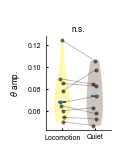

In [53]:
# Theta amplitude by behavioral state (INs, no place field)
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats


theta_run = []
theta_rest = []

for i in range(len(spikes)):
    # out_sub = get_subthreshold_activity(
    #     traces, all_spikes, all_CS_spikes, refined_SS, complex_bursts_dicts,
    #     spike_heights_interpolated, ts_neural, frame_rate,
    #     idx=i, mask_duration=1000
    # )

    out_theta = compute_theta_amp_by_state(
        speed,
        frame_rate,
        trace=Vms[i],
        cell_idx=i,
        kernel_size=kernel_size,
        filter_type='boxcar',
        speed_threshold=speed_threshold,
        min_duration_s=min_duration_s,
        merge_gap_s=merge_gap_s,
        theta_freqs=(4, 8),
        bad_timepoints=bad_masks[i] if bad_masks is not None else None,
    )

    ta = out_theta['theta_amp']
    theta_run.append(ta['run'])
    theta_rest.append(ta['rest'])

theta_run = np.array(theta_run, dtype=float)
theta_rest = np.array(theta_rest, dtype=float)

print('Included cells:', len(theta_run))

out_path = os.path.join(
    data_folder,
    f'theta_amp_state_speed{speed_threshold}.npz'
)
np.savez(
    out_path,
    theta_run=theta_run,
    theta_rest=theta_rest,
)
print(f'Saved to {out_path}')

def _paired_test(vals_a, vals_b):
    vals_a = np.asarray(vals_a, dtype=float)
    vals_b = np.asarray(vals_b, dtype=float)
    n_pairs = min(len(vals_a), len(vals_b))
    if n_pairs == 0:
        return np.nan, np.nan, 'n/a', 0, np.nan
    paired_a = vals_a[:n_pairs]
    paired_b = vals_b[:n_pairs]
    valid = np.isfinite(paired_a) & np.isfinite(paired_b)
    n_valid = int(np.sum(valid))
    if n_valid < 3:
        return np.nan, np.nan, 'n/a', n_valid, np.nan
    diffs = paired_a[valid] - paired_b[valid]
    try:
        shapiro_p = stats.shapiro(diffs).pvalue
    except ValueError:
        shapiro_p = np.nan
    if np.isfinite(shapiro_p) and shapiro_p >= 0.05:
        result = stats.ttest_rel(paired_a[valid], paired_b[valid], nan_policy='omit')
        return result.pvalue, result.statistic, 'paired t-test', n_valid, shapiro_p
    try:
        result = stats.wilcoxon(paired_a[valid], paired_b[valid])
        return result.pvalue, result.statistic, 'wilcoxon', n_valid, shapiro_p
    except ValueError:
        return np.nan, np.nan, 'wilcoxon', n_valid, shapiro_p

def _sig_label(p_val):
    if not np.isfinite(p_val):
        return ''
    if p_val < 0.001:
        return '***'
    if p_val < 0.01:
        return '**'
    if p_val < 0.05:
        return '*'
    return 'n.s.'

fig, ax = plt.subplots(1, 1, figsize=(1.2, 1.5), sharex=True, sharey=True)
plot_data = []
for vals in [theta_run, theta_rest]:
    finite = vals[np.isfinite(vals)]
    if finite.size == 0:
        finite = np.array([np.nan])
    plot_data.append(finite)

run_color = "#f9e800ff"
rest_color = "#563c25"


parts = ax.violinplot(plot_data, positions=[1, 2], showmedians=True, showextrema=False)
for body in parts['bodies']:
    body.set_alpha(0.3)
if len(parts['bodies']) >= 2:
    parts['bodies'][0].set_facecolor(run_color)
    parts['bodies'][1].set_facecolor(rest_color)
    parts['bodies'][0].set_edgecolor('none')
    parts['bodies'][1].set_edgecolor('none')

n_pairs = min(len(theta_run), len(theta_rest))
for i in range(n_pairs):
    if np.isfinite(theta_run[i]) and np.isfinite(theta_rest[i]):
        ax.plot([1, 2], [theta_run[i], theta_rest[i]], color='black', alpha=0.3, linewidth=0.6)

rng = np.random.default_rng(0)
for idx, vals in enumerate([theta_run, theta_rest], start=1):
    finite_mask = np.isfinite(vals)
    if not np.any(finite_mask):
        continue
    jitter = (rng.random(np.sum(finite_mask)) - 0.5) * 0.12
    xs = idx + jitter
    ax.scatter(xs, vals[finite_mask], s=8, color='black', alpha=0.6, linewidths=0)

p_val, test_stat, test_name, n_valid, shapiro_p = _paired_test(theta_run, theta_rest)
sig_label = _sig_label(p_val)
if np.isfinite(p_val):
    print(
        f'State theta amp ({test_name}): n={n_valid}, stat={test_stat:.3g}, p={p_val:.3g}, shapiro_p={shapiro_p:.3g}'
    )
else:
    print(f'State theta amp: n={n_valid} (insufficient valid pairs)')

if sig_label:
    y_vals = np.concatenate([theta_run[np.isfinite(theta_run)], theta_rest[np.isfinite(theta_rest)]])
    if y_vals.size > 0:
        y_max = np.nanmax(y_vals)
        y_min = np.nanmin(y_vals)
        y_span = y_max - y_min if y_max != y_min else 1.0
        y_star = y_max + 0.08 * y_span
        ax.text(1.5, y_star, sig_label, ha='center', va='bottom', fontsize=6, fontname='Arial')

ax.set_xticks([1, 2])
ax.set_xticklabels(['Locomotion', 'Quiet'], fontsize=5, fontname='Arial')
ax.set_ylabel(r'$\theta$ amp.', fontsize=6, fontname='Arial')
ax.tick_params(labelsize=5)
ax.set_xlim(0.5, 2.5)
for label in list(ax.get_yticklabels()):
    label.set_fontname('Arial')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

#fig.suptitle('$\theta$ amplitude - state', fontsize=6, fontname='Arial')
plt.tight_layout(rect=[0, 0, 1, 0.9])
theta_violin_out_path = os.path.join(figure_save_folder, 'ThetaAmp_state.svg')
fig.savefig(theta_violin_out_path, dpi=300)
print(f'Saved to {theta_violin_out_path}')
plt.show()


# PSD

In [54]:
# # PSD by behavioral state (moving vs resting) with fixed-length chunks

# max_freq = 100

# run_color = "#f9e800ff"
# rest_color = "#563c25"

# psd_run_list = []
# psd_rest_list = []
# freqs = None

# figure_save_folder_psd = os.path.join(figure_save_folder, 'PSD_by_state_all_cells')
# if not os.path.exists(figure_save_folder_psd):
#     os.makedirs(figure_save_folder_psd)

# for cell_idx in range(len(Vms)):

#     out_psd = compute_psd_by_state(
#         speed,
#         frame_rate,
#         trace=Vms[i],
#         cell_idx=i,
#         bad_timepoints=(bad_masks[i] if bad_masks is not None else None),
#         kernel_size=kernel_size,
#         filter_type='boxcar',
#         speed_threshold=speed_threshold,
#         min_duration_s=min_duration_s,
#         merge_gap_s=merge_gap_s,
#         chunk_s=4.0,
#         nperseg_s=2.0,
#         noverlap_frac=0.5,
#     )

#     if out_psd['freqs'] is None or out_psd['psd_run'] is None or out_psd['psd_rest'] is None:
#         continue

#     if freqs is None:
#         freqs = out_psd['freqs']
#     freq_mask = (freqs > 0) & (freqs <= max_freq)
#     freqs_plot = freqs[freq_mask]

#     psd_run = out_psd['psd_run'][freq_mask]
#     psd_rest = out_psd['psd_rest'][freq_mask]

#     psd_run_list.append(psd_run)
#     psd_rest_list.append(psd_rest)

#     # Per-cell PSD plot
#     fig, ax = plt.subplots(1, 1, figsize=(2, 2))
#     ax.plot(freqs_plot, psd_run, color=run_color, linewidth=0.8, label='Locomotion')
#     ax.plot(freqs_plot, psd_rest, color=rest_color, linewidth=0.8, label='Quiet')
#     ax.set_xscale('log', base=2)
#     ax.set_xlim(1, max_freq)
#     ticks = [1, 2, 4, 8, 16, 32, 64, 100]
#     ticks = [t for t in ticks if t <= max_freq]
#     ax.set_xticks(ticks)
#     ax.set_xticklabels([str(t) for t in ticks])
#     ax.set_xlabel('Frequency (Hz)')
#     ax.set_ylabel('PSD')
#     ax.legend(frameon=False, fontsize=6)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     plt.tight_layout()
#     out_path = os.path.join(figure_save_folder_psd, f'PSD_state_cell{i}.svg')
#     fig.savefig(out_path, dpi=300)
#     #plt.close(fig)

# if psd_run_list and psd_rest_list:
#     freqs_plot = freqs[(freqs > 0) & (freqs <= max_freq)]
#     psd_run_mean = np.nanmean(np.array(psd_run_list), axis=0)
#     psd_run_sem = np.nanstd(np.array(psd_run_list), axis=0) / np.sqrt(len(psd_run_list))
#     psd_rest_mean = np.nanmean(np.array(psd_rest_list), axis=0)
#     # Save pooled PSD arrays for cross-FOV pooling
#     npz_out = os.path.join(data_folder, f'psd_state_speed{speed_threshold}.npz')
#     np.savez(
#         npz_out,
#         freqs=freqs_plot,
#         psd_run=psd_run_mean,
#         psd_rest=psd_rest_mean,
#         psd_run_cells=np.array(psd_run_list),
#         psd_rest_cells=np.array(psd_rest_list),
#     )
#     print(f'Saved to {npz_out}')
#     psd_rest_sem = np.nanstd(np.array(psd_rest_list), axis=0) / np.sqrt(len(psd_rest_list))

#     fig, ax = plt.subplots(1, 1, figsize=(2, 2))
#     ax.plot(freqs_plot, psd_run_mean, color=run_color, linewidth=1.4, label='Locomotion')
#     psd_run_sem = np.nanstd(np.array(psd_run_list), axis=0) / np.sqrt(len(psd_run_list))
#     ax.plot(freqs_plot, psd_rest_mean, color=rest_color, linewidth=1.4, label='Quiet')
#     psd_rest_sem = np.nanstd(np.array(psd_rest_list), axis=0) / np.sqrt(len(psd_rest_list))
#     ax.fill_between(
#         freqs_plot,
#         psd_run_mean - psd_run_sem,
#         psd_run_mean + psd_run_sem,
#         color=run_color,
#         alpha=0.2,
#         linewidth=0,
#     )
#     ax.fill_between(
#         freqs_plot,
#         psd_rest_mean - psd_rest_sem,
#         psd_rest_mean + psd_rest_sem,
#         color=rest_color,
#         alpha=0.2,
#         linewidth=0,
#     )
#     ax.set_xscale('log', base=2)
#     ax.set_xlim(1, max_freq)
#     ticks = [1, 2, 4, 8, 16, 32, 64, 100]
#     ticks = [t for t in ticks if t <= max_freq]
#     ax.set_xticks(ticks)
#     ax.set_xticklabels([str(t) for t in ticks])
#     ax.set_xlabel('Frequency (Hz)')
#     ax.set_ylabel('PSD')
#     ax.legend(frameon=False, fontsize=6)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     plt.tight_layout()
#     out_path = os.path.join(figure_save_folder, 'PSD_state_avg.svg')
#     fig.savefig(out_path, dpi=300)
#     print(f'Saved to {out_path}')
# else:
#     print('No valid PSD data to plot.')


# Spectrogram and PSDs

/var/folders/8g/cpkd0cfs4gn915zwbfdfgf9w0000gn/T/ipykernel_4873/2387108100.py:153: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/data/CKII_pAce46_PR_20260222/psd_spectrogram_state_speed3.npz
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/PSD_state_avg_fixedChunks.svg


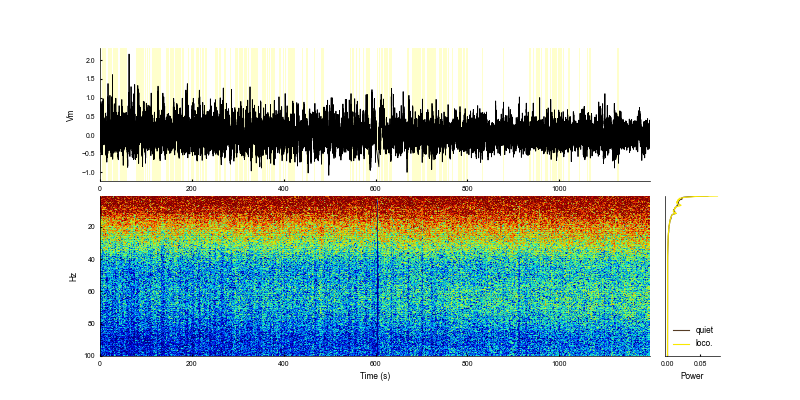

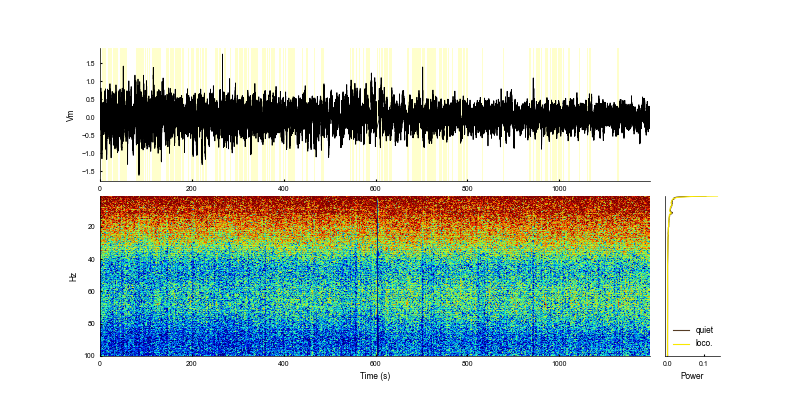

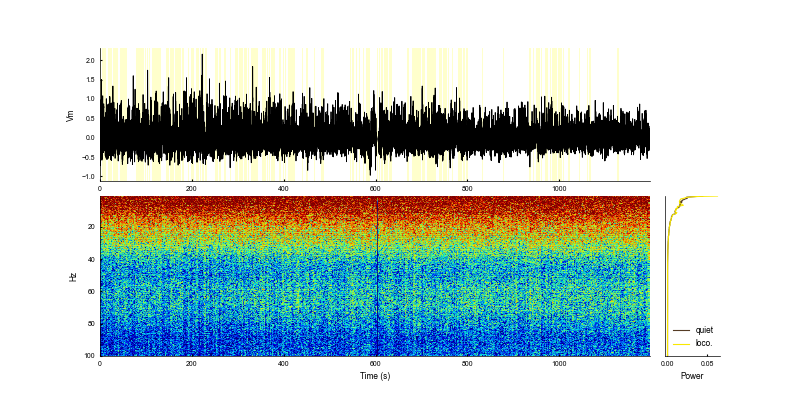

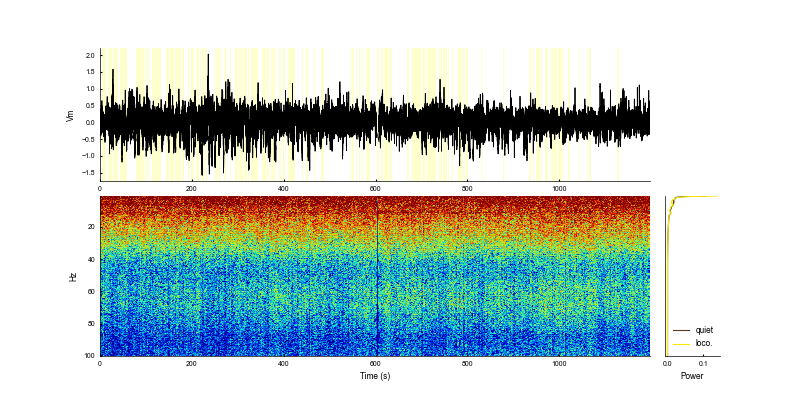

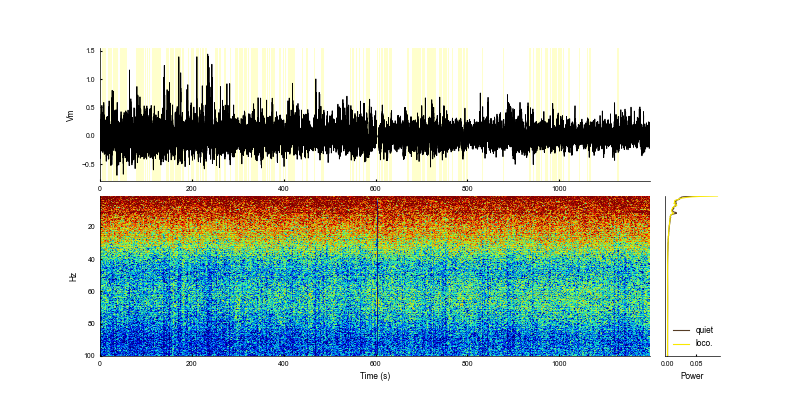

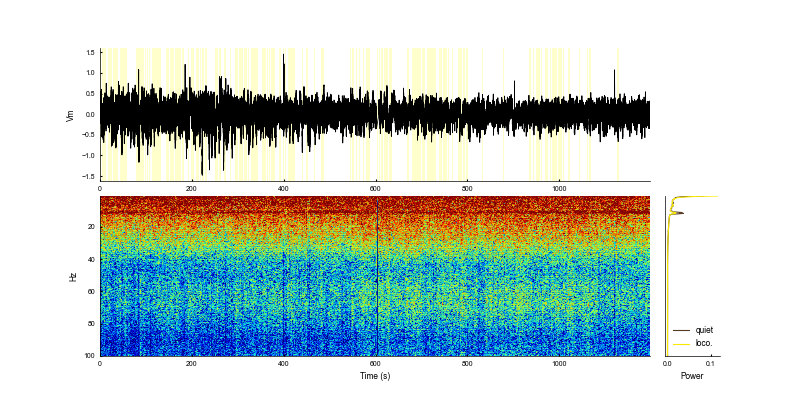

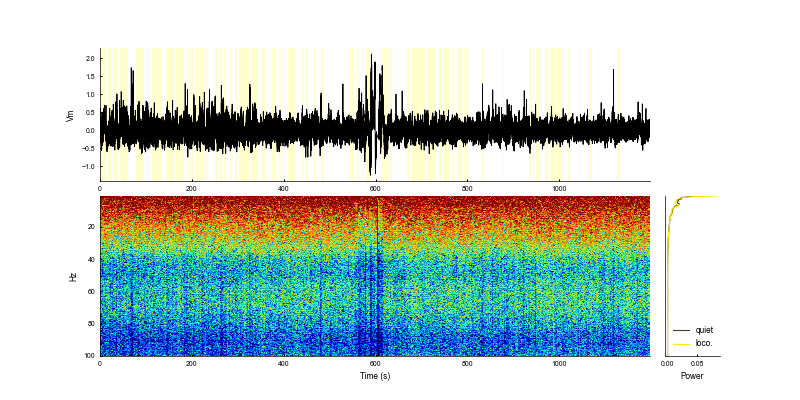

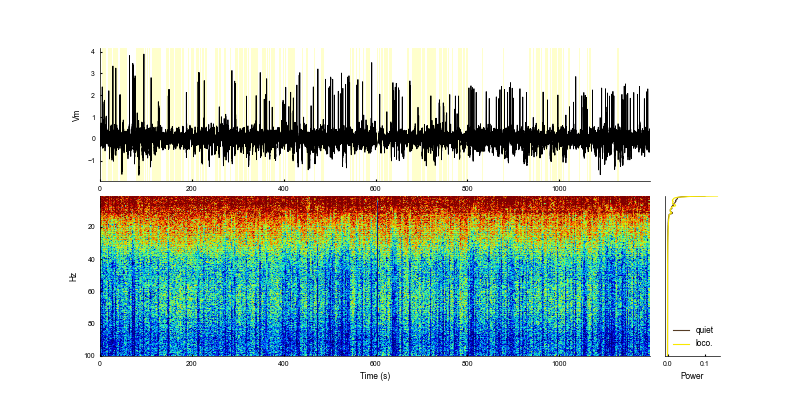

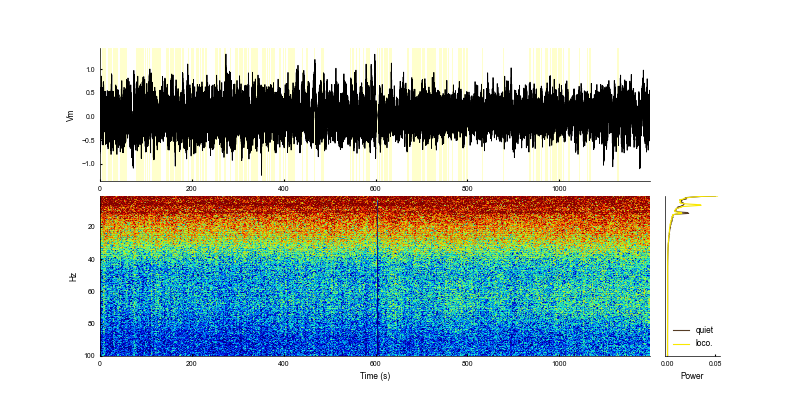

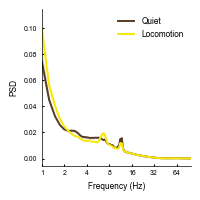

In [ ]:
# from utils.GRC_helpers import _compute_moving_epochs, _compute_quiet_epochs
# import matplotlib.ticker as mticker

# speed_threshold_quiet = 0.5

# # moving/quiet epochs (same params as earlier cells)
# # Optional: make quiet more constrained than just 'not moving'
# try:
#     speed_threshold_quiet
# except NameError:
#     speed_threshold_quiet = None

# speed_arr = np.asarray(speed, dtype=float)
# speed_for_epochs = speed_arr.copy()
# speed_for_epochs[speed_for_epochs > 50] = np.nan

# _, moving_epochs, moving_idx = _compute_moving_epochs(
#     speed_for_epochs,
#     frame_rate,
#     kernel_size=kernel_size,
#     filter_type="boxcar",
#     speed_threshold=speed_threshold,
#     min_duration_s=min_duration_s,
#     merge_gap_s=merge_gap_s,
# )

# moving_mask = np.zeros(len(speed_arr), dtype=bool)
# if len(moving_idx) > 0:
#     moving_mask[moving_idx] = True

# finite_speed = np.isfinite(speed_for_epochs)
# moving_mask &= finite_speed
# if speed_threshold_quiet is None:
#     quiet_mask = (~moving_mask) & finite_speed
# else:
#     _, quiet_epochs, quiet_idx = _compute_quiet_epochs(
#         speed_for_epochs,
#         frame_rate,
#         kernel_size=kernel_size,
#         filter_type="boxcar",
#         speed_threshold_quiet=speed_threshold_quiet,
#         min_duration_s=min_duration_s,
#         merge_gap_s=merge_gap_s,
#     )
#     quiet_mask = np.zeros(len(speed_arr), dtype=bool)
#     if len(quiet_idx) > 0:
#         quiet_mask[quiet_idx] = True
#     quiet_mask &= finite_speed

# psd_move_all = []
# psd_quiet_all = []
# freqs_ref = None

# disp_fmin, disp_fmax = 1, 100

# for cell_idx in range(len(Vms)):
#     trace = np.asarray(Vms[cell_idx], dtype=float)
#     t = np.arange(trace.size) / frame_rate
#     # Skip cells with all NaN traces
#     if np.all(np.isnan(trace)):
#         print(f"Skipping cell {cell_idx}: all NaN")
#         continue

#     # spectrogram
#     spec = compute_vm_spectrogram(Vms, cell_idx=cell_idx, frame_rate=frame_rate)

#     # restrict to display band
#     disp_mask = (spec["freqs"] >= disp_fmin) & (spec["freqs"] <= disp_fmax)
#     disp_freqs = spec["freqs"][disp_mask]
#     disp_power = spec["power"][disp_mask, :]
#     # normalize each time bin by total power in this band
#     band_total = np.nansum(disp_power, axis=0, keepdims=True)
#     band_total[band_total == 0] = 1.0
#     disp_power = disp_power / band_total

#     power_db = 10 * np.log10(disp_power + 1e-12)
#     vmin, vmax = np.percentile(power_db, [5, 95])

#     # map spectrogram time bins to moving/quiet
#     time_idx = np.round(spec["times"] * frame_rate).astype(int)
#     time_idx = np.clip(time_idx, 0, len(moving_mask) - 1)
#     moving_t = moving_mask[time_idx]
#     quiet_t = quiet_mask[time_idx]

#     mean_power_move = (
#         np.nanmean(disp_power[:, moving_t], axis=1) if np.any(moving_t)
#         else np.full(disp_freqs.shape, np.nan)
#     )
#     mean_power_quiet = (
#         np.nanmean(disp_power[:, quiet_t], axis=1) if np.any(quiet_t)
#         else np.full(disp_freqs.shape, np.nan)
#     )

#     if freqs_ref is None:
#         freqs_ref = disp_freqs

#     #normalize to total power
#     mean_power_move /= np.nansum(mean_power_move)
#     mean_power_quiet /= np.nansum(mean_power_quiet)

#     psd_move_all.append(mean_power_move)
#     psd_quiet_all.append(mean_power_quiet)


#     fig, axes = plt.subplots(
#         2, 2, figsize=(8, 4),
#         gridspec_kw={"width_ratios": [10, 1], "height_ratios": [1, 1.2],
#                     "wspace": 0.05, "hspace": 0.1}
#     )

#     ax_vm = axes[0, 0]
#     ax_empty = axes[0, 1]
#     ax_sp = axes[1, 0]
#     ax_psd = axes[1, 1]

#     ax_sp.sharex(ax_vm)
#     ax_psd.sharey(ax_sp)

#     ax_vm.plot(t, trace, color="black", linewidth=0.6)
#     ax_vm.set_ylabel("Vm")

#     # shade moving epochs on Vm
#     for start, end in moving_epochs:
#         ax_vm.axvspan(start / frame_rate, end / frame_rate, color="yellow", alpha=0.2, lw=0)

#     mesh = ax_sp.pcolormesh(
#         spec["times"], disp_freqs, power_db,
#         shading="gouraud", cmap="jet", vmin=vmin, vmax=vmax
#     )
#     ax_sp.set_ylabel("Hz")
#     ax_sp.set_xlabel("Time (s)")
#     ax_sp.set_ylim(disp_fmin, disp_fmax)
#     ax_sp.set_xlim(t[0], t[-1])


#     # PSDs: moving vs quiet (linear power)
#     ax_psd.plot(mean_power_quiet, disp_freqs, color=rest_color, linewidth=0.8, label="quiet")
#     ax_psd.plot(mean_power_move, disp_freqs, color=run_color, linewidth=0.8, label="loco.")
    
#     ax_psd.set_xlabel("Power")
#     ax_psd.tick_params(left=False, labelleft=False)
#     ax_psd.legend(frameon=False, fontsize=6)
#     ax_psd.invert_yaxis()

#     ax_psd.tick_params(left=False, labelleft=False)

#     ax_empty.axis("off")

#     for ax in [ax_vm, ax_sp, ax_psd]:
#         ax.spines["top"].set_visible(False)
#         ax.spines["right"].set_visible(False)

#     plt.tight_layout()


# max_freq = disp_fmax

# if psd_move_all and psd_quiet_all:
#     psd_move_all = np.vstack(psd_move_all)
#     psd_quiet_all = np.vstack(psd_quiet_all)

#     # Save pooled PSD arrays for cross-FOV pooling
#     npz_out = os.path.join(data_folder, f'psd_spectrogram_state_speed{speed_threshold}.npz')
#     np.savez(
#         npz_out,
#         freqs=freqs_ref,
#         psd_move_cells=psd_move_all,
#         psd_quiet_cells=psd_quiet_all,
#     )
#     print(f'Saved to {npz_out}')

#     freqs_plot = freqs_ref
#     freq_mask = (freqs_plot > 0) & (freqs_plot <= max_freq)
#     freqs_plot = freqs_plot[freq_mask]

#     psd_move_mean = np.nanmean(psd_move_all, axis=0)[freq_mask]
#     psd_move_sem = np.nanstd(psd_move_all, axis=0) / np.sqrt(psd_move_all.shape[0])
#     psd_move_sem = psd_move_sem[freq_mask]

#     psd_quiet_mean = np.nanmean(psd_quiet_all, axis=0)[freq_mask]
#     psd_quiet_sem = np.nanstd(psd_quiet_all, axis=0) / np.sqrt(psd_quiet_all.shape[0])
#     psd_quiet_sem = psd_quiet_sem[freq_mask]

#     fig, ax = plt.subplots(1, 1, figsize=(2, 2))
#     ax.plot(freqs_plot, psd_quiet_mean, color=rest_color, linewidth=1.4, label='Quiet')

#     ax.fill_between(
#         freqs_plot,
#         psd_quiet_mean - psd_quiet_sem,
#         psd_quiet_mean + psd_quiet_sem,
#         color=rest_color,
#         alpha=0.2,
#         linewidth=0,
#     )

#     ax.plot(freqs_plot, psd_move_mean, color=run_color, linewidth=1.4, label='Locomotion')
    
#     ax.fill_between(
#         freqs_plot,
#         psd_move_mean - psd_move_sem,
#         psd_move_mean + psd_move_sem,
#         color=run_color,
#         alpha=0.2,
#         linewidth=0,
#     )

#     ax.set_xscale('log', base=2)
#     ax.set_xlim(disp_fmin, max_freq)
#     ticks = [1, 2, 4, 8, 16, 32, 64]
#     ticks = [t for t in ticks if t <= max_freq]
#     ax.set_xticks(ticks)
#     ax.set_xticklabels([str(t) for t in ticks])
#     ax.set_xlabel('Frequency (Hz)')
#     ax.set_ylabel('PSD')
#     ax.legend(frameon=False, fontsize=6)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     plt.tight_layout()
#     # save figure
#     out_path = os.path.join(figure_save_folder, 'PSD_state_avg_fixedChunks.svg')
#     fig.savefig(out_path, dpi=300)
#     print(f'Saved to {out_path}')
# else:
#     print('No valid PSD data to plot.')

# Regress bandpassed Vm against SS and CS firing rates

Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/PSD_by_burst_type_all_cells/PSD_state_burstType_cell0.svg
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/PSD_by_burst_type_all_cells/PSD_state_burstType_cell1.svg
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/PSD_by_burst_type_all_cells/PSD_state_burstType_cell2.svg
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/PSD_by_burst_type_all_cells/PSD_state_burstType_cell3.svg
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/PSD_by_burst_type_all_cells/PSD_state_burstType_cell4.svg
Saved to /Users/qixi

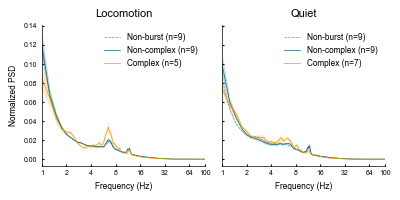

In [ ]:
# # PSD analysis: Complex vs Non-Complex Bursts, separated by behavioral state (Moving vs Quiet)
# import matplotlib.ticker as mticker
# from utils.GRC_helpers import _compute_moving_epochs, _compute_quiet_epochs

# # Toggle to also plot non-burst PSD
# plot_non_burst = True
# non_burst_color = '#888888'  # gray for non-burst periods

# # Normalize PSD by total power (True/False)
# normalize_by_total_power = True

# complex_color = '#EE9B00'  # red for complex bursts
# simple_color = '#026C80'   # blue for non-complex bursts
# figure_save_folder_burst_psd = os.path.join(figure_save_folder, 'PSD_by_burst_type_all_cells')
# if not os.path.exists(figure_save_folder_burst_psd):
#     os.makedirs(figure_save_folder_burst_psd)

# # Minimum number of bursts required per condition
# min_bursts_threshold = 10
# linewidth = 0.5

# # Exclude a padding window around each burst when defining "non-burst" epochs
# # (set to 0 to disable)
# burst_exclusion_pad_ms = 50
# burst_exclusion_pad_frames = max(0, int(np.round((burst_exclusion_pad_ms / 1000.0) * frame_rate)))

# # Compute moving/quiet epochs (same params as earlier cells)
# # Optional: make quiet more constrained than just 'not moving'
# try:
#     speed_threshold_quiet
# except NameError:
#     speed_threshold_quiet = None

# speed_arr = np.asarray(speed, dtype=float)
# speed_for_epochs = speed_arr.copy()
# speed_for_epochs[speed_for_epochs > 50] = np.nan

# _, moving_epochs, moving_idx = _compute_moving_epochs(
#     speed_for_epochs,
#     frame_rate,
#     kernel_size=kernel_size,
#     filter_type="boxcar",
#     speed_threshold=speed_threshold,
#     min_duration_s=min_duration_s,
#     merge_gap_s=merge_gap_s,
# )

# moving_mask = np.zeros(len(speed_arr), dtype=bool)
# if len(moving_idx) > 0:
#     moving_mask[moving_idx] = True

# finite_speed = np.isfinite(speed_for_epochs)
# moving_mask &= finite_speed
# if speed_threshold_quiet is None:
#     quiet_mask = (~moving_mask) & finite_speed
# else:
#     _, quiet_epochs, quiet_idx = _compute_quiet_epochs(
#         speed_for_epochs,
#         frame_rate,
#         kernel_size=kernel_size,
#         filter_type="boxcar",
#         speed_threshold_quiet=speed_threshold_quiet,
#         min_duration_s=min_duration_s,
#         merge_gap_s=merge_gap_s,
#     )
#     quiet_mask = np.zeros(len(speed_arr), dtype=bool)
#     if len(quiet_idx) > 0:
#         quiet_mask[quiet_idx] = True
#     quiet_mask &= finite_speed

# # Storage for grand averages: dict with keys (state, burst_type)
# # state: 'moving' or 'quiet', burst_type: 'complex', 'simple', or 'non_burst'
# psd_grand = {
#     ('moving', 'complex'): [],
#     ('moving', 'simple'): [],
#     ('quiet', 'complex'): [],
#     ('quiet', 'simple'): [],
#     ('moving', 'non_burst'): [],
#     ('quiet', 'non_burst'): [],
# }
# freqs_ref = None

# # Track cell indices for each PSD entry (for filtering in pooled analysis)
# cell_indices = {
#     'psd_moving_complex': [],
#     'psd_moving_simple': [],
#     'psd_quiet_complex': [],
#     'psd_quiet_simple': [],
#     'psd_moving_nonburst': [],
#     'psd_quiet_nonburst': [],
# }
# max_freq = 100

# for cell_idx in range(len(Vms)):
#     trace = np.asarray(Vms[cell_idx], dtype=float)
#     n_frames = len(trace)
#     # Skip cells with all NaN traces
#     if np.all(np.isnan(trace)):
#         print(f"Skipping cell {cell_idx}: all NaN")
#         continue
#     # Get burst metrics for this cell
#     cell_bursts = burst_metrics[cell_idx]
    
#     # Categorize bursts by state and type
#     # Count bursts in each condition and create masks
#     burst_masks = {
#         ('moving', 'complex'): np.zeros(n_frames, dtype=bool),
#         ('moving', 'simple'): np.zeros(n_frames, dtype=bool),
#         ('quiet', 'complex'): np.zeros(n_frames, dtype=bool),
#         ('quiet', 'simple'): np.zeros(n_frames, dtype=bool),
#     }
#     burst_counts = {k: 0 for k in burst_masks.keys()}
    
#     # Track all burst frames
#     any_burst_mask = np.zeros(n_frames, dtype=bool)
    
#     for burst in cell_bursts:
#         start = int(burst['start'])
#         end = int(burst['end'])
#         start = max(0, start)
#         end = min(n_frames, end)
        
#         # Determine if burst is during moving or quiet
#         burst_frames = np.arange(start, end)
#         if len(burst_frames) == 0:
#             continue
#         moving_frac = np.mean(moving_mask[burst_frames])
#         state = 'moving' if moving_frac >= 0.5 else 'quiet'
#         burst_type = 'complex' if burst['is_complex'] else 'simple'
        
#         burst_masks[(state, burst_type)][start:end] = True
#         burst_counts[(state, burst_type)] += 1
#         start_pad = max(0, start - burst_exclusion_pad_frames)
#         end_pad = min(n_frames, end + burst_exclusion_pad_frames)
#         any_burst_mask[start_pad:end_pad] = True
    
#     # Create non-burst masks for each state
#     non_burst_masks = {
#         ('moving', 'non_burst'): moving_mask & (~any_burst_mask),
#         ('quiet', 'non_burst'): quiet_mask & (~any_burst_mask),
#     }
    
#     # Compute spectrogram
#     spec = compute_vm_spectrogram(Vms, cell_idx=cell_idx, frame_rate=frame_rate)
    
#     if freqs_ref is None:
#         freqs_ref = spec["freqs"]
    
#     # Map spectrogram time bins to frame indices
#     time_idx = np.round(spec["times"] * frame_rate).astype(int)
#     time_idx = np.clip(time_idx, 0, n_frames - 1)
    
#     # Compute PSD for each burst condition
#     psd_cell = {}
#     for key in burst_masks.keys():
#         mask_t = burst_masks[key][time_idx]
#         n_bursts = burst_counts[key]
        
#         if n_bursts >= min_bursts_threshold and np.any(mask_t):
#             mean_power = np.nanmean(spec["power"][:, mask_t], axis=1)
#             if normalize_by_total_power:
#                 total_power = np.nansum(mean_power)
#                 if total_power > 0:
#                     mean_power = mean_power / total_power
#             psd_cell[key] = mean_power
#             psd_grand[key].append(mean_power)
#             # Track cell index for this PSD entry
#             npz_key = 'psd_' + key[0] + '_' + ('nonburst' if key[1] == 'non_burst' else key[1])
#             cell_indices[npz_key].append(cell_idx)
#         else:
#             psd_cell[key] = None
    
#     # Compute PSD for non-burst periods
#     for key in non_burst_masks.keys():
#         mask_t = non_burst_masks[key][time_idx]
#         if np.any(mask_t):
#             mean_power = np.nanmean(spec["power"][:, mask_t], axis=1)
#             if normalize_by_total_power:
#                 total_power = np.nansum(mean_power)
#                 if total_power > 0:
#                     mean_power = mean_power / total_power
#             psd_cell[key] = mean_power
#             psd_grand[key].append(mean_power)
#             # Track cell index for this PSD entry
#             npz_key = 'psd_' + key[0] + '_' + ('nonburst' if key[1] == 'non_burst' else key[1])
#             cell_indices[npz_key].append(cell_idx)
#         else:
#             psd_cell[key] = None
    
#     # Plot per-cell: 2 subplots side by side (Moving | Quiet)
#     fig, axes = plt.subplots(1, 2, figsize=(4, 2), sharey=True)
    
#     freqs_plot = spec["freqs"]
#     freq_mask_plot = (freqs_plot > 0) & (freqs_plot <= max_freq)
    
#     for ax, state, title in zip(axes, ['moving', 'quiet'], ['Locomotion', 'Quiet']):
#         psd_simple = psd_cell[(state, 'simple')]
#         psd_complex = psd_cell[(state, 'complex')]
#         psd_nonburst = psd_cell.get((state, 'non_burst'), None)
        
#         has_data = False
        
#         # Plot non-burst first (background)
#         if plot_non_burst and psd_nonburst is not None:
#             ax.plot(freqs_plot[freq_mask_plot], psd_nonburst[freq_mask_plot], 
#                     color=non_burst_color, linewidth=linewidth, linestyle='--', label='Non-burst')
#             has_data = True
        
#         if psd_simple is not None:
#             ax.plot(freqs_plot[freq_mask_plot], psd_simple[freq_mask_plot], 
#                     color=simple_color, linewidth=linewidth, label=f'Non-complex (n={burst_counts[(state, "simple")]})')
#             has_data = True
#         if psd_complex is not None:
#             ax.plot(freqs_plot[freq_mask_plot], psd_complex[freq_mask_plot], 
#                     color=complex_color, linewidth=linewidth, label=f'Complex (n={burst_counts[(state, "complex")]})')
#             has_data = True
        
#         ax.set_xscale('log', base=2)
#         ax.set_xlim(1, max_freq)
#         ticks = [1, 2, 4, 8, 16, 32, 64, 100]
#         ticks = [t for t in ticks if t <= max_freq]
#         ax.set_xticks(ticks)
#         ax.set_xticklabels([str(t) for t in ticks])
#         ax.set_xlabel('Frequency (Hz)')
#         ax.set_title(title, fontsize=9)
#         ax.spines['top'].set_visible(False)
#         ax.spines['right'].set_visible(False)
#         if has_data:
#             ax.legend(frameon=False, fontsize=5, loc='upper right')
#         if not has_data:
#             ax.text(0.5, 0.5, '<5 bursts', ha='center', va='center', 
#                     transform=ax.transAxes, fontsize=8, color='gray')
    
#     ylabel = 'Normalized PSD' if normalize_by_total_power else 'PSD'
#     axes[0].set_ylabel(ylabel)
#     fig.suptitle(f'Cell {cell_idx}', fontsize=10)
#     plt.tight_layout()
#     out_path = os.path.join(figure_save_folder_burst_psd, f'PSD_state_burstType_cell{cell_idx}.svg')
#     fig.savefig(out_path, dpi=300)
#     print(f'Saved to {out_path}')
#     plt.close(fig)

# # Grand average across all cells
# fig, axes = plt.subplots(1, 2, figsize=(4, 2), sharey=True)

# freqs_plot_full = freqs_ref
# freq_mask = (freqs_plot_full > 0) & (freqs_plot_full <= max_freq)
# freqs_plot = freqs_plot_full[freq_mask]

# for ax, state, title in zip(axes, ['moving', 'quiet'], ['Locomotion', 'Quiet']):
#     # Plot non-burst first (background)
#     if plot_non_burst:
#         psd_list = psd_grand[(state, 'non_burst')]
#         if len(psd_list) >= 1:
#             psd_arr = np.vstack(psd_list)
#             psd_mean = np.nanmean(psd_arr, axis=0)[freq_mask]
#             psd_sem = np.nanstd(psd_arr, axis=0) / np.sqrt(psd_arr.shape[0])
#             psd_sem = psd_sem[freq_mask]
            
#             ax.plot(freqs_plot, psd_mean, color=non_burst_color, linewidth=linewidth, 
#                     linestyle='--', label=f'Non-burst (n={len(psd_list)})')
#             ax.fill_between(
#                 freqs_plot,
#                 psd_mean - psd_sem,
#                 psd_mean + psd_sem,
#                 color=non_burst_color,
#                 alpha=0.15,
#                 linewidth=0,
#             )
    
#     for burst_type, color, label in [('simple', simple_color, 'Non-complex'), 
#                                       ('complex', complex_color, 'Complex')]:
#         psd_list = psd_grand[(state, burst_type)]
#         if len(psd_list) >= 1:
#             psd_arr = np.vstack(psd_list)
#             psd_mean = np.nanmean(psd_arr, axis=0)[freq_mask]
#             psd_sem = np.nanstd(psd_arr, axis=0) / np.sqrt(psd_arr.shape[0])
#             psd_sem = psd_sem[freq_mask]
            
#             ax.plot(freqs_plot, psd_mean, color=color, linewidth=linewidth, 
#                     label=f'{label} (n={len(psd_list)})')
#             ax.fill_between(
#                 freqs_plot,
#                 psd_mean - psd_sem,
#                 psd_mean + psd_sem,
#                 color=color,
#                 alpha=0.2,
#                 linewidth=0,
#             )
    
#     ax.set_xscale('log', base=2)
#     ax.set_xlim(1, max_freq)
#     ticks = [1, 2, 4, 8, 16, 32, 64, 100]
#     ticks = [t for t in ticks if t <= max_freq]
#     ax.set_xticks(ticks)
#     ax.set_xticklabels([str(t) for t in ticks])
#     ax.set_xlabel('Frequency (Hz)')
#     ax.set_title(title, fontsize=8)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.legend(frameon=False, fontsize=6, loc='upper right')

# ylabel = 'Normalized PSD' if normalize_by_total_power else 'PSD'
# axes[0].set_ylabel(ylabel)
# #fig.suptitle('Grand Average: PSD by State & Burst Type', fontsize=11)
# plt.tight_layout()

# # Save PSD data for cross-FOV pooling
# npz_out = os.path.join(data_folder, f'psd_burstType_state_speed{speed_threshold}.npz')
# np.savez(
#     npz_out,
#     freqs=freqs_ref,
#     normalize_by_total_power=normalize_by_total_power,
#     psd_moving_complex=np.vstack(psd_grand[('moving', 'complex')]) if psd_grand[('moving', 'complex')] else np.array([]),
#     psd_moving_simple=np.vstack(psd_grand[('moving', 'simple')]) if psd_grand[('moving', 'simple')] else np.array([]),
#     psd_quiet_complex=np.vstack(psd_grand[('quiet', 'complex')]) if psd_grand[('quiet', 'complex')] else np.array([]),
#     psd_quiet_simple=np.vstack(psd_grand[('quiet', 'simple')]) if psd_grand[('quiet', 'simple')] else np.array([]),
#     psd_moving_nonburst=np.vstack(psd_grand[('moving', 'non_burst')]) if psd_grand[('moving', 'non_burst')] else np.array([]),
#     psd_quiet_nonburst=np.vstack(psd_grand[('quiet', 'non_burst')]) if psd_grand[('quiet', 'non_burst')] else np.array([]),
#     cell_indices=cell_indices,
# )
# print(f'Saved PSD data to {npz_out}')

# # Save figure
# out_path = os.path.join(figure_save_folder, 'PSD_state_burstType_avg.svg')
# fig.savefig(out_path, dpi=300)
# print(f'Saved to {out_path}')
# plt.show()

# Trial by Trial theta and slow Vm plotting during PF traversal

In [57]:
# theta_freqs = (4, 8)
# slow_freqs = 2
# min_duration_ms = 500
# min_distance_cm = 5
# clear_traversal = True
# session_indices = [0,1]
# show_rest_patches = False
# pf_center_window_sec = 4
# show_plots = False
# min_traversals = 10


# pf_centered_list = []
# time_rel = np.arange(
#     -int(round(pf_center_window_sec * frame_rate)),
#     int(round(pf_center_window_sec * frame_rate)) + 1,
# ) / frame_rate

# for cell_idx, analysis in enumerate(PC_output_all):
#     if not analysis.get('is_place_cell', False):
#         continue


#     ### Old version when traces are not normalized by spike heights
#     # sub_out = get_subthreshold_activity(
#     #     traces, all_spikes, all_CS_spikes, refined_SS, complex_bursts_dicts,
#     #     spike_heights_interpolated, ts_neural, frame_rate,
#     #     idx=cell_idx, mask_duration=1000,
#     #     theta_freqs=theta_freqs, slow_freqs=slow_freqs
#     # )
#     # trace = sub_out['trace']
#     # theta_vm = sub_out['theta_Vm']
#     # slow_vm = sub_out['slow_Vm']
#     #slow_vm = slow_vm - np.nanmedian(slow_vm)

#     trace = traces[cell_idx]
#     trace = interpolate_nan_segment(trace)
#     theta_vm = bandpass_filter(trace, theta_freqs[0], theta_freqs[1], frame_rate, order=5)
#     slow_vm = lowpass_filter(trace, slow_freqs, frame_rate, order=5)

#     traversal_epochs, place_field_mask, rate_map, pf_bins, traversal_types = find_place_field_traversals(
#         x_neural, y_neural, spikes, speed, frame_rate, cell_idx,
#         analysis=analysis,
#         speed_threshold=speed_threshold,
#         min_duration_ms=min_duration_ms,
#         place_field_threshold=place_field_threshold,
#         min_distance_cm=min_distance_cm,
#         clear_traversal=clear_traversal,
#         return_traversal_types=True,
#     )
#     if len(traversal_epochs) < min_traversals:
#         continue

#     pf_peak_xy = None
#     if place_field_mask is not None and np.any(place_field_mask):
#         masked_rate = np.where(place_field_mask, rate_map, np.nan)
#         if np.any(np.isfinite(masked_rate)):
#             x_centers = (pf_bins[0][:-1] + pf_bins[0][1:]) / 2
#             y_centers = (pf_bins[1][:-1] + pf_bins[1][1:]) / 2
#             peak_idx = np.nanargmax(masked_rate)
#             peak_row, peak_col = np.unravel_index(peak_idx, masked_rate.shape)
#             pf_peak_xy = (x_centers[peak_row], y_centers[peak_col])

#     fig, axes, valid_epochs, theta_mean, slow_mean, rate_mean, ss_rate_mean, cs_rate_mean, ss_pct_mean, cs_pct_mean = plot_place_field_traversal_trials_with_cb_example(
#         trace, theta_vm, slow_vm, speed, x_neural, y_neural,
#         traversal_epochs, place_field_mask, pf_bins, frame_rate,
#         complex_bursts_dicts=complex_bursts_dicts,
#         cell_idx=cell_idx,
#         traversal_types=traversal_types,
#         padding_sec=pf_center_window_sec,
#         zscore_traces=False,
#         theta_freqs=theta_freqs,
#         slow_freqs=slow_freqs,
#         session_start_frames=session_start_frames,
#         session_indices=session_indices,
#         color_by_session=True,
#         show_rest_patches=show_rest_patches,
#         refined_SS=refined_SS,
#         all_CS_spikes=all_CS_spikes,
#         all_spikes=all_spikes,
#         firing_rate_bin_ms=100,
#         firing_rate_smooth_ms=50,
#         show_firing_rate=False,
#         simple_spike_color='#026C80',
#         complex_spike_color='#EE9B00',
#         pf_peak_xy=pf_peak_xy,
#         pf_center_window_sec=pf_center_window_sec,
#         plot_pf_centered_average=True,
#         return_pf_centered=True,
#         return_spike_rate_means=True,
#         show=show_plots,
#         bad_timepoints=bad_masks[cell_idx] if bad_masks is not None else None,
#     )
    
#     if theta_mean is not None and slow_mean is not None and len(valid_epochs) > min_traversals:
#         pf_centered_list.append({
#             'cell_idx': cell_idx,
#             'theta_mean': theta_mean,
#             'slow_mean': slow_mean,
#             'rate_mean': rate_mean,
#             'ss_rate_mean': ss_rate_mean,
#             'cs_rate_mean': cs_rate_mean,
#             'ss_pct_mean': ss_pct_mean,
#             'cs_pct_mean': cs_pct_mean,
#         })
#     if fig is not None:
#         figure_save_folder_trial_by_trial = os.path.join(figure_save_folder, 'PF_traversal_trials_all_cells')
#         os.makedirs(figure_save_folder_trial_by_trial, exist_ok=True)
#         out_path = os.path.join(figure_save_folder_trial_by_trial, f'Cell{cell_idx+1}_PF_traversal.svg')
#         plt.rcParams['svg.fonttype'] = 'none'
#         plt.close(fig)
#         fig.savefig(out_path, dpi=300)
#         print(f'Saved to {out_path}')
#     if fig is not None and not show_plots:
#         plt.close(fig)



# save_path = os.path.join(data_folder, f'pf_centered_theta_slow.pkl')
# with open(save_path, 'wb') as f:
#     pickle.dump({
#         'time_rel': time_rel,
#         'pf_centered': pf_centered_list,
#         'theta_freqs': theta_freqs,
#         'slow_freqs': slow_freqs,
#     }, f)

# print(f'Saved PF-centered averages to {save_path}')



In [58]:
# example_idx = 2  # 0-based index (default: 3rd entry)
# plot_example = True
# smooth_example = True
# smooth_window = 250

# from matplotlib.ticker import FuncFormatter

# def _fmt_two_decimals(x, _):
#     return f"{x:.2f}".rstrip("0").rstrip(".")

# def _smooth_boxcar(trace, win=5):
#     arr = np.asarray(trace, dtype=float)
#     if win <= 1:
#         return arr
#     kernel = np.ones(win, dtype=float)
#     valid = np.isfinite(arr).astype(float)
#     arr_filled = np.where(np.isfinite(arr), arr, 0.0)
#     smoothed = np.convolve(arr_filled, kernel, mode="same")
#     counts = np.convolve(valid, kernel, mode="same")
#     with np.errstate(invalid="ignore", divide="ignore"):
#         smoothed = np.where(counts > 0, smoothed / counts, np.nan)
#     return smoothed

# if plot_example and len(pf_centered_list) > 0:
#     idx = min(example_idx, len(pf_centered_list) - 1)
#     entry = pf_centered_list[idx]
#     theta = entry.get('theta_mean')
#     slow = entry.get('slow_mean')
#     rate = entry.get('rate_mean')
#     ss_rate = entry.get('ss_rate_mean')
#     cs_rate = entry.get('cs_rate_mean')
#     ss_pct = entry.get('ss_pct_mean')
#     cs_pct = entry.get('cs_pct_mean')

#     if rate is not None and len(rate) == len(time_rel):
#         rate = np.asarray(rate, dtype=float)
#     else:
#         rate = None

#     if ss_rate is not None and len(ss_rate) == len(time_rel):
#         ss_rate = np.asarray(ss_rate, dtype=float)
#     else:
#         ss_rate = None

#     if cs_rate is not None and len(cs_rate) == len(time_rel):
#         cs_rate = np.asarray(cs_rate, dtype=float)
#     else:
#         cs_rate = None

#     if ss_pct is not None and len(ss_pct) == len(time_rel):
#         ss_pct = np.asarray(ss_pct, dtype=float)
#     else:
#         ss_pct = None

#     if cs_pct is not None and len(cs_pct) == len(time_rel):
#         cs_pct = np.asarray(cs_pct, dtype=float)
#     else:
#         cs_pct = None

#     if ss_pct is None or cs_pct is None:
#         if ss_rate is not None and cs_rate is not None:
#             denom = ss_rate + cs_rate
#             valid = np.isfinite(denom) & (denom > 0)
#             ss_pct = np.where(valid, 100.0 * ss_rate / denom, np.nan)
#             cs_pct = np.where(valid, 100.0 * cs_rate / denom, np.nan)
#         else:
#             ss_pct = None
#             cs_pct = None

#     if smooth_example:
#         if theta is not None and len(theta) == len(time_rel):
#             theta = _smooth_boxcar(theta, smooth_window)
#         if slow is not None and len(slow) == len(time_rel):
#             slow = _smooth_boxcar(slow, smooth_window)
#         if rate is not None and len(rate) == len(time_rel):
#             rate = _smooth_boxcar(rate, smooth_window)
#         if ss_rate is not None and len(ss_rate) == len(time_rel):
#             ss_rate = _smooth_boxcar(ss_rate, smooth_window)
#         if cs_rate is not None and len(cs_rate) == len(time_rel):
#             cs_rate = _smooth_boxcar(cs_rate, smooth_window)
#         if ss_pct is not None and len(ss_pct) == len(time_rel):
#             ss_pct = _smooth_boxcar(ss_pct, smooth_window)
#         if cs_pct is not None and len(cs_pct) == len(time_rel):
#             cs_pct = _smooth_boxcar(cs_pct, smooth_window)

#     fig, axes = plt.subplots(5, 1, figsize=(2, 3.6), sharex=True)

#     if rate is not None and len(rate) == len(time_rel):
#         axes[0].plot(time_rel, rate, color='#555555', linewidth=1.0)
#         axes[0].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[0].set_ylabel('FR (Hz)', fontsize=6, fontname='Arial')
#     else:
#         axes[0].text(
#             0.5, 0.5, 'No FR data', transform=axes[0].transAxes,
#             ha='center', va='center', fontsize=6, fontname='Arial'
#         )
#         axes[0].set_ylabel('FR (Hz)', fontsize=6, fontname='Arial')

#     if (ss_rate is not None and len(ss_rate) == len(time_rel)) or (cs_rate is not None and len(cs_rate) == len(time_rel)):
#         if ss_rate is not None:
#             axes[1].plot(time_rel, ss_rate, color='#026C80', linewidth=1.0)
#         if cs_rate is not None:
#             axes[1].plot(time_rel, cs_rate, color='#EE9B00', linewidth=1.0)
#         axes[1].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[1].set_ylabel('SS/CS FR\n(Hz)', fontsize=6, fontname='Arial')
#     else:
#         axes[1].text(
#             0.5, 0.5, 'No SS/CS FR data', transform=axes[1].transAxes,
#             ha='center', va='center', fontsize=6, fontname='Arial'
#         )
#         axes[1].set_ylabel('SS/CS FR\n(Hz)', fontsize=6, fontname='Arial')

#     if (ss_pct is not None and len(ss_pct) == len(time_rel)) or (cs_pct is not None and len(cs_pct) == len(time_rel)):
#         if ss_pct is not None:
#             axes[2].plot(time_rel, ss_pct, color='#026C80', linewidth=1.0)
#         if cs_pct is not None:
#             axes[2].plot(time_rel, cs_pct, color='#EE9B00', linewidth=1.0)
#         axes[2].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[2].set_ylabel('SS/CS %', fontsize=6, fontname='Arial')
#     else:
#         axes[2].text(
#             0.5, 0.5, 'No SS/CS % data', transform=axes[2].transAxes,
#             ha='center', va='center', fontsize=6, fontname='Arial'
#         )
#         axes[2].set_ylabel('SS/CS %', fontsize=6, fontname='Arial')

#     if theta is not None and len(theta) == len(time_rel):
#         axes[3].plot(time_rel, theta, color='blue', linewidth=1.0)
#         axes[3].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[3].set_ylabel('$\theta$ amp.\n(spk. height)', fontsize=6, fontname='Arial')
#     else:
#         axes[3].text(
#             0.5, 0.5, 'No theta data', transform=axes[3].transAxes,
#             ha='center', va='center', fontsize=6, fontname='Arial'
#         )
#         axes[3].set_ylabel('$\theta$ amp.\n(spk. height)', fontsize=6, fontname='Arial')

#     if slow is not None and len(slow) == len(time_rel):
#         axes[4].plot(time_rel, slow, color='red', linewidth=1.0)
#         axes[4].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[4].set_ylabel('Slow Vm\n(spk. height)', fontsize=6, fontname='Arial')
#     else:
#         axes[4].text(
#             0.5, 0.5, 'No slow data', transform=axes[4].transAxes,
#             ha='center', va='center', fontsize=6, fontname='Arial'
#         )
#         axes[4].set_ylabel('Slow Vm\n(spk. height)', fontsize=6, fontname='Arial')

#     axes[4].set_xlabel('Time from PF peak (s)', fontsize=6, fontname='Arial')
#     for ax in axes:
#         ax.spines['top'].set_visible(False)
#         ax.spines['right'].set_visible(False)
#         ax.tick_params(labelsize=5)
#         ax.yaxis.set_major_formatter(FuncFormatter(_fmt_two_decimals))
#         for label in list(ax.get_xticklabels()) + list(ax.get_yticklabels()):
#             label.set_fontname('Arial')

#     axes[2].set_ylim(0, 100)
#     axes[3].set_ylim(-0.03, 0.07)
#     axes[4].set_ylim(-0.025, 0.06)

#     plt.tight_layout(rect=[0, 0, 1, 0.95])

#     example_out_path = os.path.join(
#         figure_save_folder,
#         f'pf_centered_example_cell{idx + 1}.svg',
#     )
#     fig.savefig(example_out_path, dpi=300)
#     print(f"Saved example plot to {example_out_path}")
#     print(f"Plotted example cell index {idx} (cell_idx={entry.get('cell_idx')})")

#     plt.show()
# else:
#     print('No PF-centered averages available for example plot.')


In [59]:
# if len(pf_centered_list) > 0:
#     theta_stack = [
#         entry['theta_mean']
#         for entry in pf_centered_list
#         if entry.get('theta_mean') is not None and len(entry['theta_mean']) == len(time_rel)
#     ]
#     slow_stack = [
#         entry['slow_mean']
#         for entry in pf_centered_list
#         if entry.get('slow_mean') is not None and len(entry['slow_mean']) == len(time_rel)
#     ]
#     rate_stack = []
#     ss_cs_pairs = []
#     zero_idx = len(time_rel) // 2
#     for entry in pf_centered_list:
#         rate = entry.get('rate_mean')
#         if rate is not None and len(rate) == len(time_rel):
#             rate = np.asarray(rate, dtype=float)
#             rate_stack.append(rate)
#         else:
#             rate = None
#         ss_rate = entry.get('ss_rate_mean')
#         cs_rate = entry.get('cs_rate_mean')
#         if ss_rate is None or cs_rate is None or rate is None:
#             continue
#         if len(ss_rate) != len(time_rel) or len(cs_rate) != len(time_rel):
#             continue
#         ss_rate = np.asarray(ss_rate, dtype=float)
#         cs_rate = np.asarray(cs_rate, dtype=float)
#         if not np.any(np.isfinite(cs_rate)) or np.nanmax(cs_rate) <= 0:
#             continue
#         ss_cs_pairs.append((ss_rate, cs_rate, rate))

#     plot_individual = True
#     smooth_individual = True

#     def _smooth_boxcar(trace, win=5):
#         arr = np.asarray(trace, dtype=float)
#         if win <= 1:
#             return arr
#         kernel = np.ones(win, dtype=float)
#         valid = np.isfinite(arr).astype(float)
#         arr_filled = np.where(np.isfinite(arr), arr, 0.0)
#         smoothed = np.convolve(arr_filled, kernel, mode="same")
#         counts = np.convolve(valid, kernel, mode="same")
#         with np.errstate(invalid="ignore", divide="ignore"):
#             smoothed = np.where(counts > 0, smoothed / counts, np.nan)
#         return smoothed

#     def _prep_stack(stack):
#         if not smooth_individual:
#             return stack
#         return [_smooth_boxcar(trace, smooth_window) for trace in stack]

#     def _prep_pair_stack(pair_stack):
#         if not smooth_individual:
#             return pair_stack
#         smoothed = []
#         for ss_rate, cs_rate, total_rate in pair_stack:
#             smoothed.append((
#                 _smooth_boxcar(ss_rate, smooth_window),
#                 _smooth_boxcar(cs_rate, smooth_window),
#                 _smooth_boxcar(total_rate, smooth_window),
#             ))
#         return smoothed

#     def _normalize_rate(trace):
#         if trace is None or len(trace) != len(time_rel):
#             return None
#         trace = np.asarray(trace, dtype=float)
#         if not np.any(np.isfinite(trace)):
#             return None
#         norm_val = trace[zero_idx]
#         if not np.isfinite(norm_val) or norm_val == 0:
#             peak = np.nanmax(trace)
#             if not np.isfinite(peak) or peak == 0:
#                 return None
#             norm_val = peak
#         return trace / norm_val

#     theta_stack_use = _prep_stack(theta_stack)
#     slow_stack_use = _prep_stack(slow_stack)
#     rate_stack_use = [_normalize_rate(rate) for rate in _prep_stack(rate_stack)]
#     rate_stack_use = [rate for rate in rate_stack_use if rate is not None]

#     ss_norm_stack_use = []
#     cs_norm_stack_use = []
#     ss_percent_stack = []
#     cs_percent_stack = []
#     for ss_rate, cs_rate, total_rate in _prep_pair_stack(ss_cs_pairs):
#         denom_total = total_rate[zero_idx]
#         if np.isfinite(denom_total) and denom_total > 0:
#             ss_norm = ss_rate / denom_total
#             cs_norm = cs_rate / denom_total
#             if np.any(np.isfinite(ss_norm)):
#                 ss_norm_stack_use.append(ss_norm)
#                 cs_norm_stack_use.append(cs_norm)
#         denom = ss_rate + cs_rate
#         valid = np.isfinite(denom) & (denom > 0)
#         ss_pct = np.where(valid, 100.0 * ss_rate / denom, np.nan)
#         cs_pct = np.where(valid, 100.0 * cs_rate / denom, np.nan)
#         if np.any(np.isfinite(ss_pct)):
#             ss_percent_stack.append(ss_pct)
#             cs_percent_stack.append(cs_pct)

#     def mean_sem(stack):
#         if not stack:
#             return None, None
#         arr = np.vstack(stack)
#         mean = np.nanmean(arr, axis=0)
#         count = np.sum(np.isfinite(arr), axis=0)
#         std = np.nanstd(arr, axis=0, ddof=0)
#         sem = np.where(count > 0, std / np.sqrt(count), np.nan)
#         return mean, sem

#     from matplotlib.ticker import FuncFormatter

#     def _fmt_two_decimals(x, _):
#         return f"{x:.2f}".rstrip("0").rstrip(".")

#     theta_grand, theta_sem = mean_sem(theta_stack_use)
#     slow_grand, slow_sem = mean_sem(slow_stack_use)
#     rate_grand, rate_sem = mean_sem(rate_stack_use)
#     ss_norm_grand, ss_norm_sem = mean_sem(ss_norm_stack_use)
#     cs_norm_grand, cs_norm_sem = mean_sem(cs_norm_stack_use)
#     ss_pct_grand, ss_pct_sem = mean_sem(ss_percent_stack)
#     cs_pct_grand, cs_pct_sem = mean_sem(cs_percent_stack)

#     fig, axes = plt.subplots(5, 1, figsize=(2, 3.6), sharex=True)
#     if rate_grand is not None:
#         if plot_individual:
#             for rate in rate_stack_use:
#                 axes[0].plot(time_rel, rate, color='#555555', linewidth=0.5, alpha=0.2)
#         axes[0].plot(time_rel, rate_grand, color='#555555', linewidth=1.0)
#         if rate_sem is not None:
#             axes[0].fill_between(
#                 time_rel,
#                 rate_grand - rate_sem,
#                 rate_grand + rate_sem,
#                 color='#555555',
#                 alpha=0.2,
#                 linewidth=0,
#             )
#         axes[0].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[0].set_ylabel('Normalized FR', fontsize=6, fontname='Arial')
#     else:
#         axes[0].text(0.5, 0.5, 'No FR data', transform=axes[0].transAxes,
#                     ha='center', va='center', fontsize=6, fontname='Arial')
#         axes[0].set_ylabel('Normalized FR', fontsize=6, fontname='Arial')

#     if ss_norm_grand is not None or cs_norm_grand is not None:
#         if plot_individual:
#             for ss_norm in ss_norm_stack_use:
#                 axes[1].plot(time_rel, ss_norm, color='#026C80', linewidth=0.5, alpha=0.2)
#             for cs_norm in cs_norm_stack_use:
#                 axes[1].plot(time_rel, cs_norm, color='#EE9B00', linewidth=0.5, alpha=0.2)
#         if ss_norm_grand is not None:
#             axes[1].plot(time_rel, ss_norm_grand, color='#026C80', linewidth=1.0)
#             if ss_norm_sem is not None:
#                 axes[1].fill_between(
#                     time_rel,
#                     ss_norm_grand - ss_norm_sem,
#                     ss_norm_grand + ss_norm_sem,
#                     color='#026C80',
#                     alpha=0.2,
#                     linewidth=0,
#                 )
#         if cs_norm_grand is not None:
#             axes[1].plot(time_rel, cs_norm_grand, color='#EE9B00', linewidth=1.0)
#             if cs_norm_sem is not None:
#                 axes[1].fill_between(
#                     time_rel,
#                     cs_norm_grand - cs_norm_sem,
#                     cs_norm_grand + cs_norm_sem,
#                     color='#EE9B00',
#                     alpha=0.2,
#                     linewidth=0,
#                 )
#         axes[1].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[1].set_ylabel('% in SS/CS', fontsize=6, fontname='Arial')
#     else:
#         axes[1].text(0.5, 0.5, 'No SS/CS FR data', transform=axes[1].transAxes,
#                     ha='center', va='center', fontsize=6, fontname='Arial')
#         axes[1].set_ylabel('% in SS/CS', fontsize=6, fontname='Arial')
#     if ss_pct_grand is not None or cs_pct_grand is not None:
#         if plot_individual:
#             for trace in ss_percent_stack:
#                 axes[2].plot(time_rel, trace, color='#026C80', linewidth=0.5, alpha=0.2)
#             for trace in cs_percent_stack:
#                 axes[2].plot(time_rel, trace, color='#EE9B00', linewidth=0.5, alpha=0.2)
#         if ss_pct_grand is not None:
#             axes[2].plot(time_rel, ss_pct_grand, color='#026C80', linewidth=1.0)
#             if ss_pct_sem is not None:
#                 axes[2].fill_between(
#                     time_rel,
#                     ss_pct_grand - ss_pct_sem,
#                     ss_pct_grand + ss_pct_sem,
#                     color='#026C80',
#                     alpha=0.2,
#                     linewidth=0,
#                 )
#         if cs_pct_grand is not None:
#             axes[2].plot(time_rel, cs_pct_grand, color='#EE9B00', linewidth=1.0)
#             if cs_pct_sem is not None:
#                 axes[2].fill_between(
#                     time_rel,
#                     cs_pct_grand - cs_pct_sem,
#                     cs_pct_grand + cs_pct_sem,
#                     color='#EE9B00',
#                     alpha=0.2,
#                     linewidth=0,
#                 )
#         axes[2].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[2].set_ylabel('SS/CS %', fontsize=6, fontname='Arial')
#     else:
#         axes[2].text(0.5, 0.5, 'No SS/CS % data', transform=axes[2].transAxes,
#                     ha='center', va='center', fontsize=6, fontname='Arial')
#         axes[2].set_ylabel('SS/CS %', fontsize=6, fontname='Arial')

#     if theta_grand is not None:
#         if plot_individual:
#             for theta in theta_stack_use:
#                 axes[3].plot(time_rel, theta, color='blue', linewidth=0.5, alpha=0.2)
#         axes[3].plot(time_rel, theta_grand, color='blue', linewidth=1.0)
#         if theta_sem is not None:
#             axes[3].fill_between(
#                 time_rel,
#                 theta_grand - theta_sem,
#                 theta_grand + theta_sem,
#                 color='blue',
#                 alpha=0.2,
#                 linewidth=0,
#             )
#         axes[3].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[3].set_ylabel('$\theta$ amp.\n(spk. height)', fontsize=6, fontname='Arial')
#     else:
#         axes[3].text(0.5, 0.5, 'No theta data', transform=axes[3].transAxes,
#                     ha='center', va='center', fontsize=6, fontname='Arial')
#         axes[3].set_ylabel('$\theta$ amp.\n(spk. height)', fontsize=6, fontname='Arial')

#     if slow_grand is not None:
#         if plot_individual:
#             for slow in slow_stack_use:
#                 axes[4].plot(time_rel, slow, color='red', linewidth=0.5, alpha=0.2)
#         axes[4].plot(time_rel, slow_grand, color='red', linewidth=1.0)
#         if slow_sem is not None:
#             axes[4].fill_between(
#                 time_rel,
#                 slow_grand - slow_sem,
#                 slow_grand + slow_sem,
#                 color='red',
#                 alpha=0.2,
#                 linewidth=0,
#             )
#         axes[4].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes[4].set_ylabel('Slow Vm\n(spk. height)', fontsize=6, fontname='Arial')
#     else:
#         axes[4].text(0.5, 0.5, 'No slow data', transform=axes[4].transAxes,
#                     ha='center', va='center', fontsize=6, fontname='Arial')
#         axes[4].set_ylabel('Slow Vm\n(spk. height)', fontsize=6, fontname='Arial')

#     axes[4].set_xlabel('Time from PF peak (s)', fontsize=6, fontname='Arial')
#     for ax in axes:
#         ax.spines['top'].set_visible(False)
#         ax.spines['right'].set_visible(False)
#         ax.tick_params(labelsize=5)
#         ax.yaxis.set_major_formatter(FuncFormatter(_fmt_two_decimals))
#         for label in list(ax.get_xticklabels()) + list(ax.get_yticklabels()):
#             label.set_fontname('Arial')
#     # fig.suptitle(
#     #     f'Grand average (n={len(pf_centered_list)})',
#     #     fontsize=6,
#     #     fontname='Arial',
#     #     x=0.5,
#     # )
#     axes[0].set_ylim(0, 1.2)
#     axes[2].set_ylim(0, 100)
#     axes[3].set_ylim(-0.02, 0.1)
#     axes[4].set_ylim(-0.025, 0.06)
#     plt.tight_layout(rect=[0, 0, 1, 0.95])
#     grand_out_path = os.path.join(
#         figure_save_folder,
#         f'pf_centered_grand_avg.svg',
#     )
#     plt.rcParams['svg.fonttype'] = 'none'
#     fig.savefig(grand_out_path, dpi=300)
#     print(f'Saved grand average to {grand_out_path}')
#     print(
#         'N cells included:',
#         f'theta={len(theta_stack_use)}',
#         f'slow={len(slow_stack_use)}',
#         f'FR={len(rate_stack_use)}',
#         f'SS/CS FR={len(ss_norm_stack_use)}',
#         f'SS/CS %={len(ss_percent_stack)}',
#     )
#     plt.show()
# else:
#     print('No PF-centered averages available for grand plot.')


# Trial by Trial V2

In [47]:
# =============================================================================
# Compute PF-centered trial data for all place cells
# =============================================================================
# This cell defines a single unified function that computes all trial-by-trial
# data centered by either max firing rate or PF position, separated by 
# traversal direction (All/CW/CCW) and spike type (All/SS/CS).

center_by_pf_position = True  # True = center by PF peak position, False = center by max firing rate in each traversal
pf_component_selection = 'peak_rate'  # 'peak_rate' (default) or 'largest_area'

theta_freqs = (4, 8)
slow_freqs = 2
min_duration_ms = 200
min_distance_cm = 10 # minimum travel distance between entry and exit points of traversal
clear_traversal = False
session_indices = [0, 1]
show_rest_patches = True
pf_center_window_sec = 6
show_plots = False
min_traversals = 10
firing_rate_bin_ms = 100
firing_rate_smooth_ms = 50
mask_non_traversal_pf = True  # True = mask data when animal is in PF but outside traversal (e.g., resting)
max_pf_distance_cm = 8  # Maximum distance (cm) from PF peak for valid centering; None = no limit

from scipy import signal
from matplotlib.ticker import FuncFormatter


def compute_pf_centered_trial_data(
    cell_idx, 
    PC_output_all, 
    traces, 
    vms,
    x_neural, 
    y_neural, 
    speed, 
    spikes,
    all_spikes, 
    refined_SS, 
    all_CS_spikes, 
    frame_rate,
    pf_center_window_sec,
    theta_freqs,
    slow_freqs,
    speed_threshold,
    min_duration_ms,
    place_field_threshold,
    min_distance_cm,
    clear_traversal,
    session_start_frames,
    session_indices,
    bad_masks,
    center_by_pf_position=False,
    firing_rate_bin_ms=100,
    firing_rate_smooth_ms=50,
    min_traversals=10,
    mask_non_traversal_pf=False,
    max_pf_distance_cm=None,
    pf_component_selection='peak_rate',
    complex_bursts_dicts=None,
    plateaus_dicts=None,
    plateau_min_duration_ms=100,
):
    """
    Compute all PF-centered trial-by-trial data for a single cell.
    
    This function handles:
    - Centering by max firing rate OR by PF peak position
    - Separating traversals by direction (All, CW, CCW)
    - Computing firing rates for All spikes, SS, CS
    - Computing theta amplitude and slow Vm
    - Returning both trial stacks and means
    
    Parameters
    ----------
    center_by_pf_position : bool
        If True, center each traversal by the timepoint closest to PF peak position.
        If False, center by the timepoint of maximum firing rate.
        Traversals without spikes are excluded from averaging in both cases.
    mask_non_traversal_pf : bool
        If True, set data to NaN for timepoints when the animal is inside the place field
        but outside the traversal epoch (e.g., resting in PF before/after traversal).
        This ensures only approach, traversal, and departure periods contribute to averages.
    max_pf_distance_cm : float or None
        Maximum allowed distance (cm) from PF peak at closest approach for a trial to be included.
        If None, no distance limit is applied. Only used when center_by_pf_position=True.
    
    Returns
    -------
    dict or None
        Returns None if cell is not a place cell or has insufficient traversals.
        Otherwise returns a dict with structure:
        {
            'cell_idx': int,
            'pf_peak_xy': tuple or None,
            'center_by_pf_position': bool,
            'time_rel': ndarray (T,),
            'all': {  # All traversals
                'n_trials': int,
                'n_total_trials': int,
                'traversal_types': list,
                'theta_stack': ndarray (N, T),
                'slow_stack': ndarray (N, T),
                'rate_stack': ndarray (N, T),
                'ss_rate_stack': ndarray (N, T),
                'cs_rate_stack': ndarray (N, T),
                'ss_pct_stack': ndarray (N, T),
                'cs_pct_stack': ndarray (N, T),
                'theta_mean': ndarray (T,),
                'slow_mean': ndarray (T,),
                'rate_mean': ndarray (T,),
                'ss_rate_mean': ndarray (T,),
                'cs_rate_mean': ndarray (T,),
                'ss_pct_mean': ndarray (T,),
                'cs_pct_mean': ndarray (T,),
            },
            'cw': { ... same structure ... },
            'ccw': { ... same structure ... },
        }
    """
    analysis = PC_output_all[cell_idx]
    if not analysis.get('is_place_cell', False):
        return None
    
    # Preprocess trace
    trace = traces[cell_idx]
    trace = interpolate_nan_segment(trace)
    theta_vm = bandpass_filter(trace, theta_freqs[0], theta_freqs[1], frame_rate, order=5)
    slow_vm = lowpass_filter(trace, slow_freqs, frame_rate, order=5)
    theta_amp = np.abs(signal.hilbert(theta_vm))
    
    # Find place field traversals
    traversal_epochs, place_field_mask, rate_map, pf_bins, traversal_types = find_place_field_traversals(
        x_neural, y_neural, spikes, speed, frame_rate, cell_idx,
        analysis=analysis,
        speed_threshold=speed_threshold,
        min_duration_ms=min_duration_ms,
        place_field_threshold=place_field_threshold,
        min_distance_cm=min_distance_cm,
        max_pf_distance_cm=max_pf_distance_cm,
        clear_traversal=clear_traversal,
        return_traversal_types=True,
        pf_component_selection=pf_component_selection,
    )
    
    if len(traversal_epochs) < min_traversals:
        return None
    
    # Compute PF peak position
    pf_peak_xy = None
    if place_field_mask is not None and np.any(place_field_mask):
        masked_rate = np.where(place_field_mask, rate_map, np.nan)
        if np.any(np.isfinite(masked_rate)):
            x_centers = (pf_bins[0][:-1] + pf_bins[0][1:]) / 2
            y_centers = (pf_bins[1][:-1] + pf_bins[1][1:]) / 2
            peak_idx = np.nanargmax(masked_rate)
            peak_row, peak_col = np.unravel_index(peak_idx, masked_rate.shape)
            pf_peak_xy = (x_centers[peak_row], y_centers[peak_col])
    
    # Compute in_place_field for each frame (needed for mask_non_traversal_pf)
    in_place_field = None
    if mask_non_traversal_pf and place_field_mask is not None:
        x_bins, y_bins = pf_bins
        x_bin_idx = np.clip(np.digitize(x_neural, x_bins) - 1, 0, place_field_mask.shape[0] - 1)
        y_bin_idx = np.clip(np.digitize(y_neural, y_bins) - 1, 0, place_field_mask.shape[1] - 1)
        in_place_field = place_field_mask[x_bin_idx, y_bin_idx]
    
    # Filter epochs by session
    padding_frames = int(pf_center_window_sec * frame_rate)
    epochs_with_types = list(zip(traversal_epochs, traversal_types))
    
    if session_indices is not None and session_start_frames is not None:
        session_start_frames_arr = np.asarray(session_start_frames, dtype=int)
        session_start_frames_arr = session_start_frames_arr[np.argsort(session_start_frames_arr)]
        epochs_filtered = []
        for (epoch_start, epoch_end), ttype in epochs_with_types:
            session_idx = np.searchsorted(session_start_frames_arr, epoch_start, side="right") - 1
            if session_idx in session_indices:
                epochs_filtered.append(((epoch_start, epoch_end), ttype))
        epochs_with_types = epochs_filtered
    
    # Filter by bad timepoints
    bad_mask = None
    if bad_masks is not None and cell_idx < len(bad_masks):
        bad_mask = np.asarray(bad_masks[cell_idx])
        if bad_mask.dtype != bool:
            if bad_mask.ndim == 1 and bad_mask.size == len(trace):
                bad_mask = bad_mask.astype(bool)
            else:
                bad_indices = np.asarray(bad_mask, dtype=int)
                bad_indices = bad_indices[(bad_indices >= 0) & (bad_indices < len(trace))]
                bad_mask = np.zeros(len(trace), dtype=bool)
                bad_mask[bad_indices] = True
        if bad_mask.shape[0] != len(trace):
            bad_mask = None
    
    valid_epochs = []
    valid_types = []
    for (epoch_start, epoch_end), ttype in epochs_with_types:
        start_idx = epoch_start - padding_frames
        end_idx = epoch_end + padding_frames
        if start_idx < 0 or end_idx >= len(trace):
            continue
        if bad_mask is not None and np.any(bad_mask[start_idx:end_idx]):
            continue
        valid_epochs.append((epoch_start, epoch_end))
        valid_types.append(ttype)
    
    if len(valid_epochs) < min_traversals:
        return None
    
    # Get spike indices
    all_spike_indices = np.asarray(all_spikes[cell_idx], dtype=int)
    ss_indices = np.asarray(refined_SS[cell_idx], dtype=int)
    cs_indices = np.asarray(all_CS_spikes[cell_idx], dtype=int)
    
    # Extract plateau potential bursts
    plateau_starts = np.array([], dtype=int)
    plateau_ends = np.array([], dtype=int)
    if plateaus_dicts is not None and cell_idx < len(plateaus_dicts):
        plat = plateaus_dicts[cell_idx]
        if plat is not None:
            plateau_starts = np.asarray(plat.get('starts', []), dtype=int)
            plateau_ends = np.asarray(plat.get('ends', []), dtype=int)
    elif complex_bursts_dicts is not None and cell_idx < len(complex_bursts_dicts):
        bursts = complex_bursts_dicts[cell_idx]
        cb_starts = np.asarray(bursts.get('starts', []), dtype=int)
        cb_ends = np.asarray(bursts.get('ends', []), dtype=int)
        cb_durs = np.asarray(bursts.get('durations_ms', []), dtype=float)
        plateau_mask = cb_durs >= plateau_min_duration_ms
        plateau_starts = cb_starts[plateau_mask]
        plateau_ends = cb_ends[plateau_mask]
    
    # Compute instantaneous firing rates
    def _compute_ifr(spike_indices):
        if spike_indices is None or len(spike_indices) == 0:
            return None
        spike_indices = spike_indices[(spike_indices >= 0) & (spike_indices < len(trace))]
        if spike_indices.size == 0:
            return None
        spike_train = np.zeros(len(trace), dtype=float)
        spike_train[spike_indices] = 1.0
        bin_frames = max(1, int(round(firing_rate_bin_ms / 1000 * frame_rate)))
        bin_kernel = np.ones(bin_frames, dtype=float) / bin_frames
        ifr = np.convolve(spike_train, bin_kernel, mode="same") * frame_rate
        smooth_frames = max(1, int(round(firing_rate_smooth_ms / 1000 * frame_rate)))
        if smooth_frames > 1:
            smooth_kernel = np.ones(smooth_frames, dtype=float) / smooth_frames
            ifr = np.convolve(ifr, smooth_kernel, mode="same")
        return ifr
    
    ifr_all = _compute_ifr(all_spike_indices)
    ifr_ss = _compute_ifr(ss_indices)
    ifr_cs = _compute_ifr(cs_indices)
    
    # Setup window parameters
    window_frames = int(round(pf_center_window_sec * frame_rate))
    avg_len = window_frames * 2 + 1
    time_rel = np.arange(-window_frames, window_frames + 1) / frame_rate
    
    baseline_start_offset = int(round(2.0 * frame_rate))
    baseline_end_offset = int(round(1.0 * frame_rate))
    
    def _compute_center_indices(epochs, types, direction_filter=None):
        """
        Compute center indices for each trial based on centering method.
        Returns: (center_indices, trials_with_spikes, filtered_epochs, filtered_types)
        """
        # Filter by direction
        if direction_filter is not None:
            filtered = [(ep, tt) for ep, tt in zip(epochs, types) if tt == direction_filter]
            if not filtered:
                return [], [], [], []
            epochs, types = zip(*filtered)
            epochs, types = list(epochs), list(types)
        
        center_indices = []
        trials_with_spikes = []
        
        for epoch_start, epoch_end in epochs:
            # Check if there are spikes in this epoch
            spikes_in_epoch = (all_spike_indices >= epoch_start) & (all_spike_indices < epoch_end)
            has_spikes = np.any(spikes_in_epoch)
            trials_with_spikes.append(has_spikes)
            
            if center_by_pf_position and pf_peak_xy is not None:
                # Center by closest position to PF peak (works even without spikes)
                pf_x, pf_y = pf_peak_xy
                x_epoch = x_neural[epoch_start:epoch_end]
                y_epoch = y_neural[epoch_start:epoch_end]
                dist_sq = (x_epoch - pf_x)**2 + (y_epoch - pf_y)**2
                if len(dist_sq) > 0 and np.any(np.isfinite(dist_sq)):
                    min_dist_sq = np.nanmin(dist_sq)
                    min_dist_cm = np.sqrt(min_dist_sq)
                    # Check if closest point is within allowed distance
                    if max_pf_distance_cm is not None and min_dist_cm > max_pf_distance_cm:
                        center_idx = None
                    else:
                        min_rel_idx = np.nanargmin(dist_sq)
                        center_idx = epoch_start + min_rel_idx
                else:
                    center_idx = None
            else:
                # Center by max firing rate (requires spikes)
                if not has_spikes:
                    center_indices.append(None)
                    continue
                if ifr_all is not None:
                    ifr_segment = ifr_all[epoch_start:epoch_end]
                    if len(ifr_segment) > 0 and np.any(np.isfinite(ifr_segment)):
                        max_rel_idx = np.nanargmax(ifr_segment)
                        center_idx = epoch_start + max_rel_idx
                    else:
                        center_idx = None
                else:
                    center_idx = None
            
            center_indices.append(center_idx)
        
        return center_indices, trials_with_spikes, epochs, types
    
    def _count_spikes_in_epochs(spike_indices, starts, ends):
        """Count spikes in each epoch."""
        if spike_indices is None or len(spike_indices) == 0:
            return np.zeros(len(starts), dtype=int)
        spike_sorted = np.sort(spike_indices)
        left = np.searchsorted(spike_sorted, starts, side="left")
        right = np.searchsorted(spike_sorted, ends, side="left")
        return (right - left).astype(int)
    
    def _build_stacks(epochs, types, center_indices, trials_with_spikes):
        """Build trial stacks, compute means, and trial firing rate data."""
        n_total = len(epochs)
        n_reliable = sum(trials_with_spikes)  # Trials with ≥1 spike in place field
        n_in_stack = sum(1 for i, center_idx in enumerate(center_indices)
                         if center_idx is not None and (center_by_pf_position or trials_with_spikes[i]))
        
        # Compute trial_data for ALL epochs (not just those with spikes)
        epoch_start_frames = np.asarray([s for s, _ in epochs], dtype=int)
        epoch_end_frames = np.asarray([e for _, e in epochs], dtype=int)
        duration_frames = epoch_end_frames - epoch_start_frames
        duration_sec = duration_frames.astype(float) / float(frame_rate)
        epoch_start_sec = epoch_start_frames.astype(float) / float(frame_rate)
        epoch_end_sec = epoch_end_frames.astype(float) / float(frame_rate)
        
        # Count spikes in each epoch
        n_all = _count_spikes_in_epochs(all_spike_indices, epoch_start_frames, epoch_end_frames)
        n_ss = _count_spikes_in_epochs(ss_indices, epoch_start_frames, epoch_end_frames)
        n_cs = _count_spikes_in_epochs(cs_indices, epoch_start_frames, epoch_end_frames)
        
        with np.errstate(divide="ignore", invalid="ignore"):
            fr_all = np.where(duration_sec > 0, n_all / duration_sec, np.nan)
            fr_ss = np.where(duration_sec > 0, n_ss / duration_sec, np.nan)
            fr_cs = np.where(duration_sec > 0, n_cs / duration_sec, np.nan)
        
        trial_data = {
            'epoch_start_sec': epoch_start_sec,
            'epoch_end_sec': epoch_end_sec,
            'duration_sec': duration_sec,
            'n_spikes_all': n_all,
            'n_spikes_ss': n_ss,
            'n_spikes_cs': n_cs,
            'fr_all_hz': fr_all,
            'fr_ss_hz': fr_ss,
            'fr_cs_hz': fr_cs,
            'traversal_types': np.asarray(types, dtype=object),
        }
        
        if n_in_stack == 0:
            empty = np.array([]).reshape(0, avg_len)
            return {
                'n_trials': 0,
                'n_total_trials': n_total,
                'n_reliable_trials': n_reliable,
                'reliability': n_reliable / n_total if n_total > 0 else np.nan,
                'traversal_types': types,
                'trial_data': trial_data,
                'theta_stack': empty, 'slow_stack': empty,
                'rate_stack': empty, 'ss_rate_stack': empty, 'cs_rate_stack': empty,
                'ss_pct_stack': empty, 'cs_pct_stack': empty,
                'plateau_stack': empty,
                'pf_entry_rel': np.array([]),
                'pf_exit_rel': np.array([]),
                'n_plateaus_per_trial': np.array([], dtype=int),
                'theta_mean': np.full(avg_len, np.nan),
                'slow_mean': np.full(avg_len, np.nan),
                'rate_mean': np.full(avg_len, np.nan),
                'ss_rate_mean': np.full(avg_len, np.nan),
                'cs_rate_mean': np.full(avg_len, np.nan),
                'ss_pct_mean': np.full(avg_len, np.nan),
                'cs_pct_mean': np.full(avg_len, np.nan),
            }
        
        theta_stack, slow_stack = [], []
        rate_stack, ss_rate_stack, cs_rate_stack = [], [], []
        ss_pct_stack, cs_pct_stack = [], []
        plateau_stack = []
        pf_entry_rel_list, pf_exit_rel_list = [], []  # Time relative to center when animal enters/exits PF
        
        for i, ((epoch_start, _), center_idx) in enumerate(zip(epochs, center_indices)):
            # Skip if no valid center; for position-based centering, include trials without spikes
            if center_idx is None:
                continue
            if not center_by_pf_position and not trials_with_spikes[i]:
                continue
            
            # Baseline
            base_start = max(epoch_start - baseline_start_offset, 0)
            base_end = max(epoch_start - baseline_end_offset, 0)
            baseline_theta = np.nanmean(theta_amp[base_start:base_end]) if base_end > base_start else np.nan
            baseline_slow = np.nanmean(slow_vm[base_start:base_end]) if base_end > base_start else np.nan
            
            # Window around center
            start_idx = max(center_idx - window_frames, 0)
            end_idx = min(center_idx + window_frames + 1, len(trace))
            if end_idx <= start_idx:
                continue
            
            left_pad = (center_idx - window_frames) - start_idx
            right_pad = (center_idx + window_frames + 1) - end_idx
            write_start = max(0, left_pad)
            write_end = avg_len - max(0, right_pad)
            
            # Initialize trial arrays
            theta_trial = np.full(avg_len, np.nan)
            slow_trial = np.full(avg_len, np.nan)
            rate_trial = np.full(avg_len, np.nan)
            ss_rate_trial = np.full(avg_len, np.nan)
            cs_rate_trial = np.full(avg_len, np.nan)
            ss_pct_trial = np.full(avg_len, np.nan)
            cs_pct_trial = np.full(avg_len, np.nan)
            
            # Theta and slow (baseline subtracted)
            theta_seg = theta_amp[start_idx:end_idx].copy()
            slow_seg = slow_vm[start_idx:end_idx].copy()
            if np.isfinite(baseline_theta):
                theta_seg = theta_seg - baseline_theta
            if np.isfinite(baseline_slow):
                slow_seg = slow_seg - baseline_slow
            theta_trial[write_start:write_end] = theta_seg
            slow_trial[write_start:write_end] = slow_seg
            
            # Firing rates
            if ifr_all is not None:
                rate_trial[write_start:write_end] = ifr_all[start_idx:end_idx]
            if ifr_ss is not None:
                ss_rate_trial[write_start:write_end] = ifr_ss[start_idx:end_idx]
            if ifr_cs is not None:
                cs_rate_trial[write_start:write_end] = ifr_cs[start_idx:end_idx]
            
            # SS/CS percentages
            if ifr_ss is not None and ifr_cs is not None:
                ss_seg = ifr_ss[start_idx:end_idx]
                cs_seg = ifr_cs[start_idx:end_idx]
                denom = ss_seg + cs_seg
                valid_denom = np.isfinite(denom) & (denom > 0)
                ss_pct_trial[write_start:write_end] = np.where(valid_denom, 100.0 * ss_seg / denom, np.nan)
                cs_pct_trial[write_start:write_end] = np.where(valid_denom, 100.0 * cs_seg / denom, np.nan)
            
            # Mask non-traversal PF time if requested
            if mask_non_traversal_pf and in_place_field is not None:
                epoch_end_frame = epochs[i][1]
                for j in range(write_start, write_end):
                    frame_idx = start_idx + (j - write_start)
                    # Check if frame is in PF but outside traversal epoch
                    if in_place_field[frame_idx] and not (epoch_start <= frame_idx < epoch_end_frame):
                        theta_trial[j] = np.nan
                        slow_trial[j] = np.nan
                        rate_trial[j] = np.nan
                        ss_rate_trial[j] = np.nan
                        cs_rate_trial[j] = np.nan
                        ss_pct_trial[j] = np.nan
                        cs_pct_trial[j] = np.nan
            
            # Compute PF entry/exit times relative to center
            pf_entry_rel = (epoch_start - center_idx) / frame_rate  # Negative (before center)
            pf_exit_rel = (epochs[i][1] - center_idx) / frame_rate  # Positive (after center)
            pf_entry_rel_list.append(pf_entry_rel)
            pf_exit_rel_list.append(pf_exit_rel)
            
            # Plateau potential trace (baseline-subtracted trace during plateaus >= threshold, zeros elsewhere)
            plateau_trial = np.zeros(avg_len)
            for ps, pe in zip(plateau_starts, plateau_ends):
                # Check if this plateau overlaps with the trial window [start_idx, end_idx)
                overlap_start = max(ps, start_idx)
                overlap_end = min(pe + 1, end_idx)
                if overlap_start < overlap_end:
                    trial_s = write_start + (overlap_start - start_idx)
                    trial_e = write_start + (overlap_end - start_idx)
                    seg = vms[cell_idx][overlap_start:overlap_end].copy()
                    if np.isfinite(baseline_slow):
                        seg = seg - baseline_slow
                    plateau_trial[trial_s:trial_e] = seg
            # Apply mask_non_traversal_pf to plateau as well
            if mask_non_traversal_pf and in_place_field is not None:
                epoch_end_frame = epochs[i][1]
                for j in range(write_start, write_end):
                    frame_idx = start_idx + (j - write_start)
                    if in_place_field[frame_idx] and not (epoch_start <= frame_idx < epoch_end_frame):
                        plateau_trial[j] = 0.0
            plateau_stack.append(plateau_trial)
            
            theta_stack.append(theta_trial)
            slow_stack.append(slow_trial)
            rate_stack.append(rate_trial)
            ss_rate_stack.append(ss_rate_trial)
            cs_rate_stack.append(cs_rate_trial)
            ss_pct_stack.append(ss_pct_trial)
            cs_pct_stack.append(cs_pct_trial)
        
        # Convert to arrays and compute means
        theta_arr = np.array(theta_stack)
        slow_arr = np.array(slow_stack)
        rate_arr = np.array(rate_stack)
        ss_rate_arr = np.array(ss_rate_stack)
        cs_rate_arr = np.array(cs_rate_stack)
        ss_pct_arr = np.array(ss_pct_stack)
        cs_pct_arr = np.array(cs_pct_stack)
        plateau_arr = np.array(plateau_stack)
        
        return {
            'n_trials': len(theta_stack),
            'n_total_trials': n_total,
            'n_reliable_trials': n_reliable,
            'reliability': n_reliable / n_total if n_total > 0 else np.nan,
            'traversal_types': types,
            'trial_data': trial_data,
            'theta_stack': theta_arr, 'slow_stack': slow_arr,
            'rate_stack': rate_arr, 'ss_rate_stack': ss_rate_arr, 'cs_rate_stack': cs_rate_arr,
            'ss_pct_stack': ss_pct_arr, 'cs_pct_stack': cs_pct_arr,
            'plateau_stack': plateau_arr,
            'pf_entry_rel': np.array(pf_entry_rel_list),  # Time (sec) when animal entered PF, relative to center
            'pf_exit_rel': np.array(pf_exit_rel_list),    # Time (sec) when animal exited PF, relative to center
            'n_plateaus_per_trial': np.array([int(np.any(row != 0)) for row in plateau_arr]) if plateau_arr.size > 0 else np.array([], dtype=int),
            'theta_mean': np.nanmean(theta_arr, axis=0) if theta_arr.size > 0 else np.full(avg_len, np.nan),
            'slow_mean': np.nanmean(slow_arr, axis=0) if slow_arr.size > 0 else np.full(avg_len, np.nan),
            'rate_mean': np.nanmean(rate_arr, axis=0) if rate_arr.size > 0 else np.full(avg_len, np.nan),
            'ss_rate_mean': np.nanmean(ss_rate_arr, axis=0) if ss_rate_arr.size > 0 else np.full(avg_len, np.nan),
            'cs_rate_mean': np.nanmean(cs_rate_arr, axis=0) if cs_rate_arr.size > 0 else np.full(avg_len, np.nan),
            'ss_pct_mean': np.nanmean(ss_pct_arr, axis=0) if ss_pct_arr.size > 0 else np.full(avg_len, np.nan),
            'cs_pct_mean': np.nanmean(cs_pct_arr, axis=0) if cs_pct_arr.size > 0 else np.full(avg_len, np.nan),
        }
    
    # Compute for All, CW, CCW
    center_all, spikes_all, epochs_all, types_all = _compute_center_indices(valid_epochs, valid_types, None)
    center_cw, spikes_cw, epochs_cw, types_cw = _compute_center_indices(valid_epochs, valid_types, 'cw')
    center_ccw, spikes_ccw, epochs_ccw, types_ccw = _compute_center_indices(valid_epochs, valid_types, 'ccw')
    
    result_all = _build_stacks(epochs_all, types_all, center_all, spikes_all)
    result_cw = _build_stacks(epochs_cw, types_cw, center_cw, spikes_cw)
    result_ccw = _build_stacks(epochs_ccw, types_ccw, center_ccw, spikes_ccw)
    
    return {
        'cell_idx': cell_idx,
        'pf_peak_xy': pf_peak_xy,
        'center_by_pf_position': center_by_pf_position,
        'time_rel': time_rel,
        'all': result_all,
        'cw': result_cw,
        'ccw': result_ccw,
    }


# =============================================================================
# Compute for all place cells AND generate trial-by-trial plots
# =============================================================================
print(f"Computing PF-centered trial data (center_by_pf_position={center_by_pf_position})...")

pf_centered_data = [None] * len(PC_output_all)

# Create output folder for trial-by-trial plots
figure_save_folder_trial_by_trial = os.path.join(figure_save_folder, 'PF_traversal_trials_all_cells')
os.makedirs(figure_save_folder_trial_by_trial, exist_ok=True)

for cell_idx, analysis in enumerate(PC_output_all):
    # Skip non-place cells
    if not analysis.get('is_place_cell', False):
        continue
    
    # Get traversal info for this cell
    trace = traces[cell_idx]
    trace = interpolate_nan_segment(trace)
    theta_vm = bandpass_filter(trace, theta_freqs[0], theta_freqs[1], frame_rate, order=5)
    slow_vm = lowpass_filter(trace, slow_freqs, frame_rate, order=5)
    
    traversal_epochs, place_field_mask, rate_map, pf_bins, traversal_types = find_place_field_traversals(
        x_neural, y_neural, spikes, speed, frame_rate, cell_idx,
        analysis=analysis,
        speed_threshold=speed_threshold,
        min_duration_ms=min_duration_ms,
        place_field_threshold=place_field_threshold,
        min_distance_cm=min_distance_cm,
        max_pf_distance_cm=max_pf_distance_cm,
        clear_traversal=clear_traversal,
        return_traversal_types=True,
        pf_component_selection=pf_component_selection,
    )
    
    # Skip if not enough traversals
    if len(traversal_epochs) < min_traversals:
        continue
    
    # Compute PF peak for centering
    pf_peak_xy = None
    if place_field_mask is not None and np.any(place_field_mask):
        masked_rate = np.where(place_field_mask, rate_map, np.nan)
        if np.any(np.isfinite(masked_rate)):
            x_centers = (pf_bins[0][:-1] + pf_bins[0][1:]) / 2
            y_centers = (pf_bins[1][:-1] + pf_bins[1][1:]) / 2
            peak_idx = np.nanargmax(masked_rate)
            peak_row, peak_col = np.unravel_index(peak_idx, masked_rate.shape)
            pf_peak_xy = (x_centers[peak_row], y_centers[peak_col])
    
    # Generate detailed trial-by-trial plot for this cell
    fig, axes, valid_epochs, theta_mean, slow_mean, rate_mean, ss_rate_mean, cs_rate_mean, ss_pct_mean, cs_pct_mean, trial_data = plot_place_field_traversal_trials_with_cb_example_centered_by_max_rate(
        trace, theta_vm, slow_vm, speed, x_neural, y_neural,
        traversal_epochs, place_field_mask, pf_bins, frame_rate,
        complex_bursts_dicts=complex_bursts_dicts,
        cell_idx=cell_idx,
        traversal_types=traversal_types,
        padding_sec=pf_center_window_sec,
        zscore_traces=False,
        theta_freqs=theta_freqs,
        slow_freqs=slow_freqs,
        session_start_frames=session_start_frames,
        session_indices=session_indices,
        color_by_session=True,
        show_rest_patches=show_rest_patches,
        refined_SS=refined_SS,
        all_CS_spikes=all_CS_spikes,
        all_spikes=all_spikes,
        firing_rate_bin_ms=firing_rate_bin_ms,
        firing_rate_smooth_ms=firing_rate_smooth_ms,
        show_firing_rate=False,
        simple_spike_color='#026C80',
        complex_spike_color='#EE9B00',
        pf_peak_xy=pf_peak_xy,
        pf_center_window_sec=pf_center_window_sec,
        plot_pf_centered_average=True,
        return_pf_centered=True,
        return_spike_rate_means=True,
        show=show_plots,
        bad_timepoints=bad_masks[cell_idx] if bad_masks is not None else None,
        return_trial_firing_rates=True,
        center_by_pf_position=center_by_pf_position,
        max_pf_distance_cm=max_pf_distance_cm,
        plateaus_dicts=plateaus_dicts,
    )
    
    # Save the trial-by-trial plot
    if fig is not None:
        out_path = os.path.join(figure_save_folder_trial_by_trial, f'Cell{cell_idx+1}_PF_traversal.svg')
        plt.rcParams['svg.fonttype'] = 'none'
        fig.savefig(out_path, dpi=300)
        if not show_plots:
            plt.close(fig)
        print(f'Saved Cell {cell_idx+1} trial-by-trial plot to {out_path}')
    
    # Compute the structured trial data using the unified function
    result = compute_pf_centered_trial_data(
        cell_idx=cell_idx,
        PC_output_all=PC_output_all,
        traces=traces,
        vms=Vms,
        x_neural=x_neural,
        y_neural=y_neural,
        speed=speed,
        spikes=spikes,
        all_spikes=all_spikes,
        refined_SS=refined_SS,
        all_CS_spikes=all_CS_spikes,
        frame_rate=frame_rate,
        pf_center_window_sec=pf_center_window_sec,
        theta_freqs=theta_freqs,
        slow_freqs=slow_freqs,
        speed_threshold=speed_threshold,
        min_duration_ms=min_duration_ms,
        place_field_threshold=place_field_threshold,
        min_distance_cm=min_distance_cm,
        clear_traversal=clear_traversal,
        session_start_frames=session_start_frames,
        session_indices=session_indices,
        bad_masks=bad_masks,
        center_by_pf_position=center_by_pf_position,
        firing_rate_bin_ms=firing_rate_bin_ms,
        firing_rate_smooth_ms=firing_rate_smooth_ms,
        min_traversals=min_traversals,
        mask_non_traversal_pf=mask_non_traversal_pf,
        max_pf_distance_cm=max_pf_distance_cm,
        pf_component_selection=pf_component_selection,
        complex_bursts_dicts=complex_bursts_dicts,
        plateaus_dicts=plateaus_dicts,
        plateau_min_duration_ms=100,
    )
    pf_centered_data[cell_idx] = result

n_cells_with_data = sum(1 for x in pf_centered_data if x is not None)
print(f'\nComputed data for {n_cells_with_data} place cells')
print(f'Trial-by-trial plots saved to: {figure_save_folder_trial_by_trial}')

# Save to file
time_rel = np.arange(
    -int(round(pf_center_window_sec * frame_rate)),
    int(round(pf_center_window_sec * frame_rate)) + 1,
) / frame_rate

save_path = os.path.join(data_folder, f'pf_centered_trial_data.pkl')
with open(save_path, 'wb') as f:
    pickle.dump({
        'pf_centered_data': pf_centered_data,
        'time_rel': time_rel,
        'center_by_pf_position': center_by_pf_position,
        'theta_freqs': theta_freqs,
        'slow_freqs': slow_freqs,
        'pf_center_window_sec': pf_center_window_sec,
        'frame_rate': frame_rate,
        'min_traversals': min_traversals,
    }, f)

print(f'Saved to {save_path}')

# Print summary
print("\nSummary:")
for cell_idx, data in enumerate(pf_centered_data):
    if data is not None:
        all_data = data['all']
        cw_data = data['cw']
        ccw_data = data['ccw']
        print(f"  Cell {cell_idx+1}: All={all_data['n_trials']}/{all_data['n_total_trials']} "
              f"(reliable: {all_data['n_reliable_trials']}, {all_data['reliability']:.1%}), "
              f"CW={cw_data['n_trials']}/{cw_data['n_total_trials']}, "
              f"CCW={ccw_data['n_trials']}/{ccw_data['n_total_trials']}")


Computing PF-centered trial data (center_by_pf_position=True)...
Found 21 traversal epochs (min duration: 200 ms, min distance: 10 cm, max PF distance: 8 cm)
Place field has 30 bins, peak rate: 1.01 Hz


/Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/utils/GRC_helpers.py:8738: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/utils/GRC_helpers.py:8825: RuntimeWarning: invalid value encountered in divide
  ss_pct = np.where(valid, 100.0 * ss_seg / denom, np.nan)
/Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/utils/GRC_helpers.py:8826: RuntimeWarning: invalid value encountered in divide
  cs_pct = np.where(valid, 100.0 * cs_seg / denom, np.nan)
/Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/utils/GRC_helpers.py:8836: RuntimeWarning: Mean of empty slice
  pf_ss_pct_mean = np.nanmean(ss_pct_stack, axis=0) if include_pf_pct else None
/Users/qixinyang/Documents/AdamL

Plotted 21 traversal trials (8 with spikes in PF, used for average)
Saved Cell 7 trial-by-trial plot to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/PF_traversal_trials_all_cells/Cell7_PF_traversal.svg
Found 21 traversal epochs (min duration: 200 ms, min distance: 10 cm, max PF distance: 8 cm)
Place field has 30 bins, peak rate: 1.01 Hz

Computed data for 1 place cells
Trial-by-trial plots saved to: /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/PF_traversal_trials_all_cells
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/data/CKII_pAce46_PR_20260222/pf_centered_trial_data.pkl

Summary:
  Cell 7: All=21/21 (reliable: 8, 38.1%), CW=8/8, CCW=13/13


/var/folders/8g/cpkd0cfs4gn915zwbfdfgf9w0000gn/T/ipykernel_11935/3558170156.py:458: RuntimeWarning: invalid value encountered in divide
  ss_pct_trial[write_start:write_end] = np.where(valid_denom, 100.0 * ss_seg / denom, np.nan)
/var/folders/8g/cpkd0cfs4gn915zwbfdfgf9w0000gn/T/ipykernel_11935/3558170156.py:459: RuntimeWarning: invalid value encountered in divide
  cs_pct_trial[write_start:write_end] = np.where(valid_denom, 100.0 * cs_seg / denom, np.nan)
/var/folders/8g/cpkd0cfs4gn915zwbfdfgf9w0000gn/T/ipykernel_11935/3558170156.py:541: RuntimeWarning: Mean of empty slice
  'ss_pct_mean': np.nanmean(ss_pct_arr, axis=0) if ss_pct_arr.size > 0 else np.full(avg_len, np.nan),
/var/folders/8g/cpkd0cfs4gn915zwbfdfgf9w0000gn/T/ipykernel_11935/3558170156.py:542: RuntimeWarning: Mean of empty slice
  'cs_pct_mean': np.nanmean(cs_pct_arr, axis=0) if cs_pct_arr.size > 0 else np.full(avg_len, np.nan),


In [61]:
# # =============================================================================
# # Plot 3-column figures (All / CW / CCW) for each cell using pf_centered_data
# # =============================================================================
# # This cell uses the pre-computed pf_centered_data from the previous cell.
# # No need to recompute trial stacks - everything is already in pf_centered_data.

# plot_all_cells = True
# smooth_example = True
# smooth_window = 50
# plot_trials = True
# trial_alpha = 0.2
# trial_linewidth = 0.5

# from matplotlib.ticker import FuncFormatter


# def _fmt_two_decimals(x, _):
#     return f"{x:.2f}".rstrip("0").rstrip(".")


# def _smooth_boxcar(trace, win=5):
#     arr = np.asarray(trace, dtype=float)
#     if win <= 1:
#         return arr
#     kernel = np.ones(win, dtype=float)
#     valid = np.isfinite(arr).astype(float)
#     arr_filled = np.where(np.isfinite(arr), arr, 0.0)
#     smoothed = np.convolve(arr_filled, kernel, mode="same")
#     counts = np.convolve(valid, kernel, mode="same")
#     with np.errstate(invalid="ignore", divide="ignore"):
#         smoothed = np.where(counts > 0, smoothed / counts, np.nan)
#     return smoothed


# def _plot_single_column(axes_col, time_rel, data_dict, smooth_example, smooth_window, 
#                         plot_trials, trial_alpha, trial_linewidth, title_suffix=""):
#     """
#     Plot a single column of the 3-column figure.
    
#     data_dict should have keys: theta_stack, slow_stack, rate_stack, ss_rate_stack, 
#     cs_rate_stack, ss_pct_stack, cs_pct_stack, and their _mean versions.
#     """
#     n_trials = data_dict.get('n_trials', 0)
#     n_total = data_dict.get('n_total_trials', 0)
    
#     # Plot individual trials first (behind the mean)
#     if plot_trials and n_trials > 0:
#         for i in range(n_trials):
#             # Rate
#             trial_rate = data_dict['rate_stack'][i]
#             if smooth_example:
#                 trial_rate = _smooth_boxcar(trial_rate, smooth_window)
#             axes_col[0].plot(time_rel, trial_rate, color='#555555', 
#                              linewidth=trial_linewidth, alpha=trial_alpha)
#             # SS/CS rate
#             trial_ss = data_dict['ss_rate_stack'][i]
#             trial_cs = data_dict['cs_rate_stack'][i]
#             if smooth_example:
#                 trial_ss = _smooth_boxcar(trial_ss, smooth_window)
#                 trial_cs = _smooth_boxcar(trial_cs, smooth_window)
#             axes_col[1].plot(time_rel, trial_ss, color='#026C80',
#                              linewidth=trial_linewidth, alpha=trial_alpha)
#             axes_col[1].plot(time_rel, trial_cs, color='#EE9B00',
#                              linewidth=trial_linewidth, alpha=trial_alpha)
#             # SS/CS pct
#             trial_ss_pct = data_dict['ss_pct_stack'][i]
#             trial_cs_pct = data_dict['cs_pct_stack'][i]
#             if smooth_example:
#                 trial_ss_pct = _smooth_boxcar(trial_ss_pct, smooth_window)
#                 trial_cs_pct = _smooth_boxcar(trial_cs_pct, smooth_window)
#             axes_col[2].plot(time_rel, trial_ss_pct, color='#026C80',
#                              linewidth=trial_linewidth, alpha=trial_alpha)
#             axes_col[2].plot(time_rel, trial_cs_pct, color='#EE9B00',
#                              linewidth=trial_linewidth, alpha=trial_alpha)
#             # Theta
#             trial_theta = data_dict['theta_stack'][i]
#             if smooth_example:
#                 trial_theta = _smooth_boxcar(trial_theta, smooth_window)
#             axes_col[3].plot(time_rel, trial_theta, color='blue',
#                              linewidth=trial_linewidth, alpha=trial_alpha)
#             # Slow
#             trial_slow = data_dict['slow_stack'][i]
#             if smooth_example:
#                 trial_slow = _smooth_boxcar(trial_slow, smooth_window)
#             axes_col[4].plot(time_rel, trial_slow, color='red',
#                              linewidth=trial_linewidth, alpha=trial_alpha)

#     # Plot means on top
#     def _plot_mean(ax, mean_data, color, add_vline=True):
#         if mean_data is not None and len(mean_data) == len(time_rel) and np.any(np.isfinite(mean_data)):
#             mean_to_plot = _smooth_boxcar(mean_data, smooth_window) if smooth_example else mean_data
#             ax.plot(time_rel, mean_to_plot, color=color, linewidth=1.0)
#             if add_vline:
#                 ax.axvline(0, color='black', linewidth=0.6, alpha=0.6)
#             return True
#         else:
#             ax.text(0.5, 0.5, 'No data', transform=ax.transAxes,
#                     ha='center', va='center', fontsize=6, fontname='Arial')
#             return False
    
#     # Row 0: Total firing rate
#     _plot_mean(axes_col[0], data_dict.get('rate_mean'), '#555555')
    
#     # Row 1: SS/CS firing rate
#     ss_ok = _plot_mean(axes_col[1], data_dict.get('ss_rate_mean'), '#026C80', add_vline=False)
#     cs_ok = _plot_mean(axes_col[1], data_dict.get('cs_rate_mean'), '#EE9B00', add_vline=False)
#     if ss_ok or cs_ok:
#         axes_col[1].axvline(0, color='black', linewidth=0.6, alpha=0.6)
    
#     # Row 2: SS/CS percentage
#     ss_pct_mean = data_dict.get('ss_pct_mean')
#     cs_pct_mean = data_dict.get('cs_pct_mean')
#     if ss_pct_mean is not None and np.any(np.isfinite(ss_pct_mean)):
#         ss_pct_to_plot = _smooth_boxcar(ss_pct_mean, smooth_window) if smooth_example else ss_pct_mean
#         axes_col[2].plot(time_rel, ss_pct_to_plot, color='#026C80', linewidth=1.0)
#     if cs_pct_mean is not None and np.any(np.isfinite(cs_pct_mean)):
#         cs_pct_to_plot = _smooth_boxcar(cs_pct_mean, smooth_window) if smooth_example else cs_pct_mean
#         axes_col[2].plot(time_rel, cs_pct_to_plot, color='#EE9B00', linewidth=1.0)
#     if (ss_pct_mean is not None and np.any(np.isfinite(ss_pct_mean))) or \
#        (cs_pct_mean is not None and np.any(np.isfinite(cs_pct_mean))):
#         axes_col[2].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         axes_col[2].set_ylim(0, 100)
#     else:
#         axes_col[2].text(0.5, 0.5, 'No data', transform=axes_col[2].transAxes,
#                          ha='center', va='center', fontsize=6, fontname='Arial')
    
#     # Row 3: Theta amplitude
#     _plot_mean(axes_col[3], data_dict.get('theta_mean'), 'blue')
    
#     # Row 4: Slow Vm
#     _plot_mean(axes_col[4], data_dict.get('slow_mean'), 'red')
    
#     # Title with trial counts
#     title_text = f'{title_suffix}\n({n_trials}/{n_total} valid)'
#     axes_col[0].set_title(title_text, fontsize=6, fontname='Arial')


# def plot_cell_3col_from_data(cell_data, time_rel, smooth_example, smooth_window, 
#                               plot_trials, trial_alpha, trial_linewidth, 
#                               figure_save_folder, show_plot=False):
#     """
#     Plot 3-column figure for a single cell using pre-computed pf_centered_data.
#     """
#     cell_idx = cell_data['cell_idx']
#     center_method = 'PF pos' if cell_data['center_by_pf_position'] else 'Max rate'
    
#     # Create figure
#     fig, axes = plt.subplots(5, 3, figsize=(6, 7), sharex='col')
    
#     # Column titles
#     col_titles = ['All', 'CW', 'CCW']
    
#     # Plot each column
#     for col, (key, title) in enumerate(zip(['all', 'cw', 'ccw'], col_titles)):
#         data_dict = cell_data[key]
#         _plot_single_column(
#             axes[:, col], time_rel, data_dict, 
#             smooth_example, smooth_window, plot_trials, trial_alpha, trial_linewidth,
#             title_suffix=title
#         )
    
#     # Row labels
#     axes[0, 0].set_ylabel('FR (Hz)', fontsize=6, fontname='Arial')
#     axes[1, 0].set_ylabel('SS/CS FR\n(Hz)', fontsize=6, fontname='Arial')
#     axes[2, 0].set_ylabel('SS/CS %', fontsize=6, fontname='Arial')
#     axes[3, 0].set_ylabel('θ amp.\n(spk. height)', fontsize=6, fontname='Arial')
#     axes[4, 0].set_ylabel('Slow Vm\n(spk. height)', fontsize=6, fontname='Arial')
    
#     # X labels for bottom row
#     for col in range(3):
#         axes[4, col].set_xlabel(f'Time from {center_method} (s)', fontsize=6, fontname='Arial')
    
#     # Format axes
#     for ax in axes.flat:
#         ax.spines['top'].set_visible(False)
#         ax.spines['right'].set_visible(False)
#         ax.tick_params(labelsize=5)
#         ax.yaxis.set_major_formatter(FuncFormatter(_fmt_two_decimals))
#         for label in list(ax.get_xticklabels()) + list(ax.get_yticklabels()):
#             label.set_fontname('Arial')
    
#     plt.tight_layout(rect=[0, 0, 1, 0.95])
#     fig.suptitle(f'Cell {cell_idx + 1} (centered by {center_method})', fontsize=8, fontname='Arial')
    
#     # Save
#     save_folder = os.path.join(figure_save_folder, 'pf_centered_3col_all_cells')
#     os.makedirs(save_folder, exist_ok=True)
#     out_path = os.path.join(save_folder, f'Cell{cell_idx + 1}_pf_centered_3col.svg')
#     plt.rcParams['svg.fonttype'] = 'none'
#     fig.savefig(out_path, dpi=300)
    
#     if show_plot:
#         plt.show()
#     else:
#         plt.close(fig)
    
#     return {
#         'cell_idx': cell_idx,
#         'n_valid_all': cell_data['all']['n_trials'],
#         'n_total_all': cell_data['all']['n_total_trials'],
#         'n_valid_cw': cell_data['cw']['n_trials'],
#         'n_total_cw': cell_data['cw']['n_total_trials'],
#         'n_valid_ccw': cell_data['ccw']['n_trials'],
#         'n_total_ccw': cell_data['ccw']['n_total_trials'],
#         'out_path': out_path,
#     }


# # =============================================================================
# # Plot all cells using the pre-computed pf_centered_data
# # =============================================================================
# valid_cells = [(i, data) for i, data in enumerate(pf_centered_data) if data is not None]

# if plot_all_cells and len(valid_cells) > 0:
#     print(f"Plotting {len(valid_cells)} cells with 3-column layout (All/CW/CCW)...")
#     print(f"Centering method: {'PF position' if center_by_pf_position else 'Max firing rate'}")
    
#     results = []
#     for list_idx, (cell_idx, cell_data) in enumerate(valid_cells):
#         result = plot_cell_3col_from_data(
#             cell_data, time_rel, smooth_example, smooth_window,
#             plot_trials, trial_alpha, trial_linewidth,
#             figure_save_folder, show_plot=False
#         )
#         results.append(result)
        
#         print(f"  [{list_idx + 1}/{len(valid_cells)}] Cell {cell_idx + 1}: "
#               f"All={result['n_valid_all']}/{result['n_total_all']}, "
#               f"CW={result['n_valid_cw']}/{result['n_total_cw']}, "
#               f"CCW={result['n_valid_ccw']}/{result['n_total_ccw']}")
    
#     # Summary
#     total_valid_all = sum(r['n_valid_all'] for r in results)
#     total_valid_cw = sum(r['n_valid_cw'] for r in results)
#     total_valid_ccw = sum(r['n_valid_ccw'] for r in results)
#     total_all = sum(r['n_total_all'] for r in results)
#     total_cw = sum(r['n_total_cw'] for r in results)
#     total_ccw = sum(r['n_total_ccw'] for r in results)
    
#     print(f"\nDone! Saved {len(results)} figures to {os.path.join(figure_save_folder, 'pf_centered_3col_all_cells')}")
#     print(f"Summary across all cells:")
#     if total_all > 0:
#         print(f"  All trials: {total_valid_all}/{total_all} valid ({100*total_valid_all/total_all:.1f}%)")
#     if total_cw > 0:
#         print(f"  CW trials:  {total_valid_cw}/{total_cw} valid ({100*total_valid_cw/total_cw:.1f}%)")
#     if total_ccw > 0:
#         print(f"  CCW trials: {total_valid_ccw}/{total_ccw} valid ({100*total_valid_ccw/total_ccw:.1f}%)")

# else:
#     print('No PF-centered data available or plot_all_cells is False.')

In [62]:
# if len(pf_centered_list) > 0:
#     from matplotlib.ticker import FuncFormatter
#     from scipy import signal
#     from utils.GRC_helpers import find_place_field_traversals, bandpass_filter, lowpass_filter, interpolate_nan_segment
    
#     def _fmt_two_decimals(x, _):
#         return f"{x:.2f}".rstrip("0").rstrip(".")

#     def _smooth_boxcar(trace, win=5):
#         arr = np.asarray(trace, dtype=float)
#         if win <= 1:
#             return arr
#         kernel = np.ones(win, dtype=float)
#         valid = np.isfinite(arr).astype(float)
#         arr_filled = np.where(np.isfinite(arr), arr, 0.0)
#         smoothed = np.convolve(arr_filled, kernel, mode="same")
#         counts = np.convolve(valid, kernel, mode="same")
#         with np.errstate(invalid="ignore", divide="ignore"):
#             smoothed = np.where(counts > 0, smoothed / counts, np.nan)
#         return smoothed

#     plot_individual = True
#     smooth_individual = True

#     def _prep_stack(stack):
#         if not smooth_individual:
#             return stack
#         return [_smooth_boxcar(trace, smooth_window) for trace in stack]

#     def _normalize_rate(trace, zero_idx, time_rel_len):
#         if trace is None or len(trace) != time_rel_len:
#             return None
#         trace = np.asarray(trace, dtype=float)
#         if not np.any(np.isfinite(trace)):
#             return None
#         norm_val = trace[zero_idx]
#         if not np.isfinite(norm_val) or norm_val == 0:
#             peak = np.nanmax(trace)
#             if not np.isfinite(peak) or peak == 0:
#                 return None
#             norm_val = peak
#         return trace / norm_val

#     def mean_sem(stack):
#         if not stack:
#             return None, None
#         arr = np.vstack(stack)
#         mean = np.nanmean(arr, axis=0)
#         count = np.sum(np.isfinite(arr), axis=0)
#         std = np.nanstd(arr, axis=0, ddof=0)
#         sem = np.where(count > 0, std / np.sqrt(count), np.nan)
#         return mean, sem

#     def _compute_cell_means_by_direction(cell_idx, PC_output_all, traces, x_neural, y_neural, speed, spikes, 
#                                           all_spikes, refined_SS, all_CS_spikes, frame_rate, 
#                                           pf_center_window_sec, theta_freqs, slow_freqs,
#                                           speed_threshold, min_duration_ms, place_field_threshold, 
#                                           min_distance_cm, clear_traversal, session_start_frames,
#                                           session_indices, bad_masks, direction_filter=None):
#         """
#         Compute mean traces for a single cell, filtered by direction.
#         Returns dict with theta_mean, slow_mean, rate_mean, ss_rate_mean, cs_rate_mean, or None if no valid data.
#         """
#         analysis = PC_output_all[cell_idx]
#         if not analysis.get('is_place_cell', False):
#             return None
        
#         trace = traces[cell_idx]
#         trace = interpolate_nan_segment(trace)
#         theta_vm = bandpass_filter(trace, theta_freqs[0], theta_freqs[1], frame_rate, order=5)
#         slow_vm = lowpass_filter(trace, slow_freqs, frame_rate, order=5)
        
#         traversal_epochs, place_field_mask, rate_map, pf_bins, traversal_types = find_place_field_traversals(
#             x_neural, y_neural, spikes, speed, frame_rate, cell_idx,
#             analysis=analysis,
#             speed_threshold=speed_threshold,
#             min_duration_ms=min_duration_ms,
#             place_field_threshold=place_field_threshold,
#             min_distance_cm=min_distance_cm,
#             clear_traversal=clear_traversal,
#             return_traversal_types=True,
#         )
        
#         if len(traversal_epochs) == 0:
#             return None
        
#         # Get valid epochs (filter by session if needed)
#         padding_frames = int(pf_center_window_sec * frame_rate)
#         bad_mask = None
#         if bad_masks is not None and cell_idx < len(bad_masks):
#             bad_mask = np.asarray(bad_masks[cell_idx])
#             if bad_mask.dtype != bool:
#                 if bad_mask.ndim == 1 and bad_mask.size == len(trace):
#                     bad_mask = bad_mask.astype(bool)
#                 else:
#                     bad_indices = np.asarray(bad_mask, dtype=int)
#                     bad_indices = bad_indices[(bad_indices >= 0) & (bad_indices < len(trace))]
#                     bad_mask = np.zeros(len(trace), dtype=bool)
#                     bad_mask[bad_indices] = True
#             if bad_mask.shape[0] != len(trace):
#                 bad_mask = None
        
#         # Pair epochs with types
#         epochs_with_types = list(zip(traversal_epochs, traversal_types))
        
#         # Filter by session indices
#         if session_indices is not None and session_start_frames is not None:
#             session_start_frames_arr = np.asarray(session_start_frames, dtype=int)
#             session_start_frames_arr = session_start_frames_arr[np.argsort(session_start_frames_arr)]
#             epochs_filtered = []
#             for (epoch_start, epoch_end), ttype in epochs_with_types:
#                 session_idx = np.searchsorted(session_start_frames_arr, epoch_start, side="right") - 1
#                 if session_idx in session_indices:
#                     epochs_filtered.append(((epoch_start, epoch_end), ttype))
#             epochs_with_types = epochs_filtered
        
#         # Filter by bad timepoints and direction
#         valid_epochs = []
#         valid_types = []
#         for (epoch_start, epoch_end), ttype in epochs_with_types:
#             start_idx = epoch_start - padding_frames
#             end_idx = epoch_end + padding_frames
#             if start_idx < 0 or end_idx >= len(trace):
#                 continue
#             if bad_mask is not None and np.any(bad_mask[start_idx:end_idx]):
#                 continue
#             # Apply direction filter
#             if direction_filter is not None and ttype != direction_filter:
#                 continue
#             valid_epochs.append((epoch_start, epoch_end))
#             valid_types.append(ttype)
        
#         if len(valid_epochs) == 0:
#             return None
        
#         # Get spike indices for this cell
#         all_spike_indices = np.asarray(all_spikes[cell_idx], dtype=int)
#         ss_indices = np.asarray(refined_SS[cell_idx], dtype=int)
#         cs_indices = np.asarray(all_CS_spikes[cell_idx], dtype=int)
        
#         # Compute IFR
#         firing_rate_bin_ms = 100
#         firing_rate_smooth_ms = 50
        
#         def _compute_ifr(spike_indices):
#             if spike_indices is None or len(spike_indices) == 0:
#                 return None
#             spike_indices = spike_indices[(spike_indices >= 0) & (spike_indices < len(trace))]
#             if spike_indices.size == 0:
#                 return None
#             spike_train = np.zeros(len(trace), dtype=float)
#             spike_train[spike_indices] = 1.0
#             bin_frames = max(1, int(round(firing_rate_bin_ms / 1000 * frame_rate)))
#             bin_kernel = np.ones(bin_frames, dtype=float) / bin_frames
#             ifr = np.convolve(spike_train, bin_kernel, mode="same") * frame_rate
#             smooth_frames = max(1, int(round(firing_rate_smooth_ms / 1000 * frame_rate)))
#             if smooth_frames > 1:
#                 smooth_kernel = np.ones(smooth_frames, dtype=float) / smooth_frames
#                 ifr = np.convolve(ifr, smooth_kernel, mode="same")
#             return ifr
        
#         ifr = _compute_ifr(all_spike_indices)
#         ifr_ss = _compute_ifr(ss_indices)
#         ifr_cs = _compute_ifr(cs_indices)
        
#         # Compute max rate center indices for each trial
#         max_rate_center_indices = []
#         trials_with_spikes = []
#         for epoch_start, epoch_end in valid_epochs:
#             max_rate_idx = None
#             has_spikes = False
#             if ifr is not None:
#                 spikes_in_epoch = (all_spike_indices >= epoch_start) & (all_spike_indices < epoch_end)
#                 has_spikes = np.any(spikes_in_epoch)
#                 if has_spikes:
#                     ifr_segment = ifr[epoch_start:epoch_end]
#                     if len(ifr_segment) > 0 and np.any(np.isfinite(ifr_segment)):
#                         max_rel_idx = np.nanargmax(ifr_segment)
#                         max_rate_idx = epoch_start + max_rel_idx
#             max_rate_center_indices.append(max_rate_idx)
#             trials_with_spikes.append(has_spikes)
        
#         # Build stacks
#         window_frames = int(round(pf_center_window_sec * frame_rate))
#         avg_len = window_frames * 2 + 1
        
#         theta_amp = np.abs(signal.hilbert(theta_vm))
        
#         n_valid_trials = sum(trials_with_spikes)
#         if n_valid_trials == 0:
#             return None
        
#         theta_stack = []
#         slow_stack = []
#         rate_stack = []
#         ss_rate_stack = []
#         cs_rate_stack = []
        
#         baseline_start_offset = int(round(2.0 * frame_rate))
#         baseline_end_offset = int(round(1.0 * frame_rate))
        
#         for i, (center_idx, (epoch_start, _)) in enumerate(zip(max_rate_center_indices, valid_epochs)):
#             if not trials_with_spikes[i]:
#                 continue
#             if center_idx is None:
#                 continue
            
#             # Baseline
#             base_start = max(epoch_start - baseline_start_offset, 0)
#             base_end = max(epoch_start - baseline_end_offset, 0)
#             baseline_theta = np.nanmean(theta_amp[base_start:base_end]) if base_end > base_start else np.nan
#             baseline_slow = np.nanmean(slow_vm[base_start:base_end]) if base_end > base_start else np.nan
            
#             start_idx = max(center_idx - window_frames, 0)
#             end_idx = min(center_idx + window_frames + 1, len(theta_vm))
#             if end_idx <= start_idx:
#                 continue
            
#             left_pad = (center_idx - window_frames) - start_idx
#             right_pad = (center_idx + window_frames + 1) - end_idx
#             write_start = max(0, left_pad)
#             write_end = avg_len - max(0, right_pad)
            
#             # Initialize trial arrays
#             theta_trial = np.full(avg_len, np.nan)
#             slow_trial = np.full(avg_len, np.nan)
#             rate_trial = np.full(avg_len, np.nan)
#             ss_rate_trial = np.full(avg_len, np.nan)
#             cs_rate_trial = np.full(avg_len, np.nan)
            
#             theta_segment = theta_amp[start_idx:end_idx].copy()
#             slow_segment = slow_vm[start_idx:end_idx].copy()
#             if np.isfinite(baseline_theta):
#                 theta_segment = theta_segment - baseline_theta
#             if np.isfinite(baseline_slow):
#                 slow_segment = slow_segment - baseline_slow
            
#             theta_trial[write_start:write_end] = theta_segment
#             slow_trial[write_start:write_end] = slow_segment
            
#             if ifr is not None:
#                 rate_trial[write_start:write_end] = ifr[start_idx:end_idx]
#             if ifr_ss is not None:
#                 ss_rate_trial[write_start:write_end] = ifr_ss[start_idx:end_idx]
#             if ifr_cs is not None:
#                 cs_rate_trial[write_start:write_end] = ifr_cs[start_idx:end_idx]
            
#             theta_stack.append(theta_trial)
#             slow_stack.append(slow_trial)
#             rate_stack.append(rate_trial)
#             ss_rate_stack.append(ss_rate_trial)
#             cs_rate_stack.append(cs_rate_trial)
        
#         if len(theta_stack) == 0:
#             return None
        
#         return {
#             'theta_mean': np.nanmean(np.array(theta_stack), axis=0),
#             'slow_mean': np.nanmean(np.array(slow_stack), axis=0),
#             'rate_mean': np.nanmean(np.array(rate_stack), axis=0),
#             'ss_rate_mean': np.nanmean(np.array(ss_rate_stack), axis=0),
#             'cs_rate_mean': np.nanmean(np.array(cs_rate_stack), axis=0),
#             'n_trials': len(theta_stack),
#             'n_total_trials': len(valid_epochs),
#         }

#     def _build_stacks_for_direction(pf_centered_list, time_rel, direction=None):
#         """Build data stacks for a specific direction by recomputing means."""
#         zero_idx = len(time_rel) // 2
        
#         theta_stack = []
#         slow_stack = []
#         rate_stack = []
#         ss_cs_pairs = []
#         n_trials_total = 0
#         n_total_trials_total = 0
        
#         # Get cell indices that have data
#         cell_indices = [entry.get('cell_idx') for entry in pf_centered_list if entry is not None]
        
#         for cell_idx in cell_indices:
#             # Compute means for this direction
#             result = _compute_cell_means_by_direction(
#                 cell_idx, PC_output_all, traces, x_neural, y_neural, speed, spikes,
#                 all_spikes, refined_SS, all_CS_spikes, frame_rate,
#                 pf_center_window_sec, theta_freqs, slow_freqs,
#                 speed_threshold, min_duration_ms, place_field_threshold,
#                 min_distance_cm, clear_traversal, session_start_frames,
#                 session_indices, bad_masks, direction_filter=direction
#             )
            
#             if result is None:
#                 continue
            
#             n_trials_total += result['n_trials']
#             n_total_trials_total += result['n_total_trials']
            
#             theta = result.get('theta_mean')
#             slow = result.get('slow_mean')
#             rate = result.get('rate_mean')
#             ss_rate = result.get('ss_rate_mean')
#             cs_rate = result.get('cs_rate_mean')
            
#             if theta is not None and len(theta) == len(time_rel):
#                 theta_stack.append(theta)
#             if slow is not None and len(slow) == len(time_rel):
#                 slow_stack.append(slow)
#             if rate is not None and len(rate) == len(time_rel):
#                 rate = np.asarray(rate, dtype=float)
#                 rate_stack.append(rate)
            
#             if ss_rate is None or cs_rate is None or rate is None:
#                 continue
#             if len(ss_rate) != len(time_rel) or len(cs_rate) != len(time_rel):
#                 continue
#             ss_rate = np.asarray(ss_rate, dtype=float)
#             cs_rate = np.asarray(cs_rate, dtype=float)
#             if not np.any(np.isfinite(cs_rate)) or np.nanmax(cs_rate) <= 0:
#                 continue
#             ss_cs_pairs.append((ss_rate, cs_rate, rate))
        
#         # Process stacks
#         theta_stack_use = _prep_stack(theta_stack)
#         slow_stack_use = _prep_stack(slow_stack)
#         rate_stack_use = [_normalize_rate(rate, zero_idx, len(time_rel)) for rate in _prep_stack(rate_stack)]
#         rate_stack_use = [rate for rate in rate_stack_use if rate is not None]
        
#         ss_norm_stack = []
#         cs_norm_stack = []
#         ss_percent_stack = []
#         cs_percent_stack = []
        
#         for ss_rate, cs_rate, total_rate in ss_cs_pairs:
#             if smooth_individual:
#                 ss_rate = _smooth_boxcar(ss_rate, smooth_window)
#                 cs_rate = _smooth_boxcar(cs_rate, smooth_window)
#                 total_rate = _smooth_boxcar(total_rate, smooth_window)
            
#             denom_total = total_rate[zero_idx]
#             if np.isfinite(denom_total) and denom_total > 0:
#                 ss_norm = ss_rate / denom_total
#                 cs_norm = cs_rate / denom_total
#                 if np.any(np.isfinite(ss_norm)):
#                     ss_norm_stack.append(ss_norm)
#                     cs_norm_stack.append(cs_norm)
            
#             denom = ss_rate + cs_rate
#             valid = np.isfinite(denom) & (denom > 0)
#             ss_pct = np.where(valid, 100.0 * ss_rate / denom, np.nan)
#             cs_pct = np.where(valid, 100.0 * cs_rate / denom, np.nan)
#             if np.any(np.isfinite(ss_pct)):
#                 ss_percent_stack.append(ss_pct)
#                 cs_percent_stack.append(cs_pct)
        
#         return {
#             'theta_stack': theta_stack_use,
#             'slow_stack': slow_stack_use,
#             'rate_stack': rate_stack_use,
#             'ss_norm_stack': ss_norm_stack,
#             'cs_norm_stack': cs_norm_stack,
#             'ss_percent_stack': ss_percent_stack,
#             'cs_percent_stack': cs_percent_stack,
#             'n_trials': n_trials_total,
#             'n_total_trials': n_total_trials_total,
#         }

#     def _plot_grand_column(axes_col, time_rel, stacks, plot_individual, title_suffix=""):
#         """Plot a single column of grand average."""
#         theta_grand, theta_sem = mean_sem(stacks['theta_stack'])
#         slow_grand, slow_sem = mean_sem(stacks['slow_stack'])
#         rate_grand, rate_sem = mean_sem(stacks['rate_stack'])
#         ss_norm_grand, ss_norm_sem = mean_sem(stacks['ss_norm_stack'])
#         cs_norm_grand, cs_norm_sem = mean_sem(stacks['cs_norm_stack'])
#         ss_pct_grand, ss_pct_sem = mean_sem(stacks['ss_percent_stack'])
#         cs_pct_grand, cs_pct_sem = mean_sem(stacks['cs_percent_stack'])
        
#         # Rate
#         if rate_grand is not None:
#             if plot_individual:
#                 for rate in stacks['rate_stack']:
#                     axes_col[0].plot(time_rel, rate, color='#555555', linewidth=0.5, alpha=0.2)
#             axes_col[0].plot(time_rel, rate_grand, color='#555555', linewidth=1.0)
#             if rate_sem is not None:
#                 axes_col[0].fill_between(time_rel, rate_grand - rate_sem, rate_grand + rate_sem,
#                                          color='#555555', alpha=0.2, linewidth=0)
#             axes_col[0].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         else:
#             axes_col[0].text(0.5, 0.5, 'No data', transform=axes_col[0].transAxes,
#                             ha='center', va='center', fontsize=6, fontname='Arial')
        
#         # SS/CS normalized
#         if ss_norm_grand is not None or cs_norm_grand is not None:
#             if plot_individual:
#                 for ss_norm in stacks['ss_norm_stack']:
#                     axes_col[1].plot(time_rel, ss_norm, color='#026C80', linewidth=0.5, alpha=0.2)
#                 for cs_norm in stacks['cs_norm_stack']:
#                     axes_col[1].plot(time_rel, cs_norm, color='#EE9B00', linewidth=0.5, alpha=0.2)
#             if cs_norm_grand is not None:
#                 axes_col[1].plot(time_rel, cs_norm_grand, color='#EE9B00', linewidth=1.0)
#                 if cs_norm_sem is not None:
#                     axes_col[1].fill_between(time_rel, cs_norm_grand - cs_norm_sem, cs_norm_grand + cs_norm_sem,
#                                              color='#EE9B00', alpha=0.2, linewidth=0)
#             if ss_norm_grand is not None:
#                 axes_col[1].plot(time_rel, ss_norm_grand, color='#026C80', linewidth=1.0)
#                 if ss_norm_sem is not None:
#                     axes_col[1].fill_between(time_rel, ss_norm_grand - ss_norm_sem, ss_norm_grand + ss_norm_sem,
#                                              color='#026C80', alpha=0.2, linewidth=0)
#             axes_col[1].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         else:
#             axes_col[1].text(0.5, 0.5, 'No data', transform=axes_col[1].transAxes,
#                             ha='center', va='center', fontsize=6, fontname='Arial')
        
#         # SS/CS percent
#         if ss_pct_grand is not None or cs_pct_grand is not None:
#             if plot_individual:
#                 for trace in stacks['ss_percent_stack']:
#                     axes_col[2].plot(time_rel, trace, color='#026C80', linewidth=0.5, alpha=0.2)
#                 for trace in stacks['cs_percent_stack']:
#                     axes_col[2].plot(time_rel, trace, color='#EE9B00', linewidth=0.5, alpha=0.2)
#             if ss_pct_grand is not None:
#                 axes_col[2].plot(time_rel, ss_pct_grand, color='#026C80', linewidth=1.0)
#                 if ss_pct_sem is not None:
#                     axes_col[2].fill_between(time_rel, ss_pct_grand - ss_pct_sem, ss_pct_grand + ss_pct_sem,
#                                              color='#026C80', alpha=0.2, linewidth=0)
#             if cs_pct_grand is not None:
#                 axes_col[2].plot(time_rel, cs_pct_grand, color='#EE9B00', linewidth=1.0)
#                 if cs_pct_sem is not None:
#                     axes_col[2].fill_between(time_rel, cs_pct_grand - cs_pct_sem, cs_pct_grand + cs_pct_sem,
#                                              color='#EE9B00', alpha=0.2, linewidth=0)
#             axes_col[2].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         else:
#             axes_col[2].text(0.5, 0.5, 'No data', transform=axes_col[2].transAxes,
#                             ha='center', va='center', fontsize=6, fontname='Arial')
        
#         # Theta
#         if theta_grand is not None:
#             if plot_individual:
#                 for theta in stacks['theta_stack']:
#                     axes_col[3].plot(time_rel, theta, color='blue', linewidth=0.5, alpha=0.2)
#             axes_col[3].plot(time_rel, theta_grand, color='blue', linewidth=1.0)
#             if theta_sem is not None:
#                 axes_col[3].fill_between(time_rel, theta_grand - theta_sem, theta_grand + theta_sem,
#                                          color='blue', alpha=0.2, linewidth=0)
#             axes_col[3].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         else:
#             axes_col[3].text(0.5, 0.5, 'No data', transform=axes_col[3].transAxes,
#                             ha='center', va='center', fontsize=6, fontname='Arial')
        
#         # Slow
#         if slow_grand is not None:
#             if plot_individual:
#                 for slow in stacks['slow_stack']:
#                     axes_col[4].plot(time_rel, slow, color='red', linewidth=0.5, alpha=0.2)
#             axes_col[4].plot(time_rel, slow_grand, color='red', linewidth=1.0)
#             if slow_sem is not None:
#                 axes_col[4].fill_between(time_rel, slow_grand - slow_sem, slow_grand + slow_sem,
#                                          color='red', alpha=0.2, linewidth=0)
#             axes_col[4].axvline(0, color='black', linewidth=0.6, alpha=0.6)
#         else:
#             axes_col[4].text(0.5, 0.5, 'No data', transform=axes_col[4].transAxes,
#                             ha='center', va='center', fontsize=6, fontname='Arial')
        
#         # Title with n cells and n trials
#         n_cells = len(stacks['theta_stack'])
#         n_trials = stacks.get('n_trials', 0)
#         axes_col[0].set_title(f'{title_suffix}\n(n={n_cells} cells, {n_trials} trials)', fontsize=6, fontname='Arial')
        
#         return {
#             'n_cells': n_cells,
#             'n_trials': n_trials,
#             'n_theta': len(stacks['theta_stack']),
#             'n_slow': len(stacks['slow_stack']),
#             'n_rate': len(stacks['rate_stack']),
#             'n_ss_cs': len(stacks['ss_norm_stack']),
#         }

#     print("Computing direction-specific stacks (this may take a moment)...")
    
#     # Build stacks for each direction
#     stacks_all = _build_stacks_for_direction(pf_centered_list, time_rel, direction=None)
#     print(f"  All: {len(stacks_all['theta_stack'])} cells, {stacks_all['n_trials']} trials")
    
#     stacks_cw = _build_stacks_for_direction(pf_centered_list, time_rel, direction='cw')
#     print(f"  CW: {len(stacks_cw['theta_stack'])} cells, {stacks_cw['n_trials']} trials")
    
#     stacks_ccw = _build_stacks_for_direction(pf_centered_list, time_rel, direction='ccw')
#     print(f"  CCW: {len(stacks_ccw['theta_stack'])} cells, {stacks_ccw['n_trials']} trials")

#     # Create figure with 5 rows x 3 columns for grand average
#     fig, axes = plt.subplots(5, 3, figsize=(6, 3.6), sharex=True)
    
#     # Plot each column
#     stats_all = _plot_grand_column(axes[:, 0], time_rel, stacks_all, plot_individual, "All")
#     stats_cw = _plot_grand_column(axes[:, 1], time_rel, stacks_cw, plot_individual, "CW")
#     stats_ccw = _plot_grand_column(axes[:, 2], time_rel, stacks_ccw, plot_individual, "CCW")
    
#     # Set y-axis labels only for leftmost column
#     axes[0, 0].set_ylabel('Normalized FR', fontsize=6, fontname='Arial')
#     axes[1, 0].set_ylabel('% in SS/CS', fontsize=6, fontname='Arial')
#     axes[2, 0].set_ylabel('SS/CS %', fontsize=6, fontname='Arial')
#     axes[3, 0].set_ylabel('$\\theta$ amp.\n(spk. height)', fontsize=6, fontname='Arial')
#     axes[4, 0].set_ylabel('Slow Vm\n(spk. height)', fontsize=6, fontname='Arial')
    
#     # Set x-axis label for bottom row
#     for col in range(3):
#         axes[4, col].set_xlabel('Time from peak firing (s)', fontsize=6, fontname='Arial')
    
#     # Set axis limits
#     axes[0, 0].set_ylim(0, 1.2)
#     axes[0, 1].set_ylim(0, 1.2)
#     axes[0, 2].set_ylim(0, 1.2)
#     for col in range(3):
#         axes[2, col].set_ylim(0, 100)
    
#     # Format all axes
#     for ax in axes.flat:
#         ax.spines['top'].set_visible(False)
#         ax.spines['right'].set_visible(False)
#         ax.tick_params(labelsize=5)
#         ax.yaxis.set_major_formatter(FuncFormatter(_fmt_two_decimals))
#         for label in list(ax.get_xticklabels()) + list(ax.get_yticklabels()):
#             label.set_fontname('Arial')

#     plt.tight_layout(rect=[0, 0, 1, 0.95])
    
#     grand_out_path = os.path.join(figure_save_folder, f'pf_centered_grand_avg_3col.svg')
#     plt.rcParams['svg.fonttype'] = 'none'
#     fig.savefig(grand_out_path, dpi=300)
#     print(f'Saved grand average to {grand_out_path}')
#     plt.show()
    
#     # ====== Create scatter + bar plot for valid trial percentages per cell ======
#     # Compute valid trial percentage for each cell and each direction
#     pct_all_list = []
#     pct_cw_list = []
#     pct_ccw_list = []
    
#     cell_indices = [entry.get('cell_idx') for entry in pf_centered_list if entry is not None]
    
#     for cell_idx in cell_indices:
#         # Compute for All directions
#         result_all = _compute_cell_means_by_direction(
#             cell_idx, PC_output_all, traces, x_neural, y_neural, speed, spikes,
#             all_spikes, refined_SS, all_CS_spikes, frame_rate,
#             pf_center_window_sec, theta_freqs, slow_freqs,
#             speed_threshold, min_duration_ms, place_field_threshold,
#             min_distance_cm, clear_traversal, session_start_frames,
#             session_indices, bad_masks, direction_filter=None
#         )
#         if result_all is not None and result_all['n_total_trials'] > 0:
#             pct_all_list.append(100.0 * result_all['n_trials'] / result_all['n_total_trials'])
        
#         # Compute for CW
#         result_cw = _compute_cell_means_by_direction(
#             cell_idx, PC_output_all, traces, x_neural, y_neural, speed, spikes,
#             all_spikes, refined_SS, all_CS_spikes, frame_rate,
#             pf_center_window_sec, theta_freqs, slow_freqs,
#             speed_threshold, min_duration_ms, place_field_threshold,
#             min_distance_cm, clear_traversal, session_start_frames,
#             session_indices, bad_masks, direction_filter='cw'
#         )
#         if result_cw is not None and result_cw['n_total_trials'] > 0:
#             pct_cw_list.append(100.0 * result_cw['n_trials'] / result_cw['n_total_trials'])
        
#         # Compute for CCW
#         result_ccw = _compute_cell_means_by_direction(
#             cell_idx, PC_output_all, traces, x_neural, y_neural, speed, spikes,
#             all_spikes, refined_SS, all_CS_spikes, frame_rate,
#             pf_center_window_sec, theta_freqs, slow_freqs,
#             speed_threshold, min_duration_ms, place_field_threshold,
#             min_distance_cm, clear_traversal, session_start_frames,
#             session_indices, bad_masks, direction_filter='ccw'
#         )
#         if result_ccw is not None and result_ccw['n_total_trials'] > 0:
#             pct_ccw_list.append(100.0 * result_ccw['n_trials'] / result_ccw['n_total_trials'])
    
#     # Create figure
#     fig_bar, ax_bar = plt.subplots(figsize=(3, 3))
    
#     categories = ['All', 'CW', 'CCW']
#     x_positions = [0, 1, 2]
#     colors = ['#555555', '#3498db', '#e74c3c']
    
#     # Compute means
#     mean_all = np.mean(pct_all_list) if pct_all_list else 0
#     mean_cw = np.mean(pct_cw_list) if pct_cw_list else 0
#     mean_ccw = np.mean(pct_ccw_list) if pct_ccw_list else 0
#     means = [mean_all, mean_cw, mean_ccw]
    
#     # Compute SEM
#     sem_all = np.std(pct_all_list) / np.sqrt(len(pct_all_list)) if len(pct_all_list) > 1 else 0
#     sem_cw = np.std(pct_cw_list) / np.sqrt(len(pct_cw_list)) if len(pct_cw_list) > 1 else 0
#     sem_ccw = np.std(pct_ccw_list) / np.sqrt(len(pct_ccw_list)) if len(pct_ccw_list) > 1 else 0
#     sems = [sem_all, sem_cw, sem_ccw]
    
#     # Plot bars
#     bar_width = 0.6
#     bars = ax_bar.bar(x_positions, means, width=bar_width, color=colors, edgecolor='black', 
#                       linewidth=0.5, alpha=0.7, yerr=sems, capsize=3, error_kw={'linewidth': 0.8})
    
#     # Scatter individual cells with jitter
#     jitter_width = 0.15
#     for i, (x_pos, pct_list, color) in enumerate(zip(x_positions, [pct_all_list, pct_cw_list, pct_ccw_list], colors)):
#         if pct_list:
#             jitter = np.random.uniform(-jitter_width, jitter_width, len(pct_list))
#             ax_bar.scatter(x_pos + jitter, pct_list, color=color, edgecolor='black', 
#                           linewidth=0.3, s=20, alpha=0.8, zorder=5)
    
#     # Add mean value labels on bars
#     for x_pos, mean_val, n_cells in zip(x_positions, means, [len(pct_all_list), len(pct_cw_list), len(pct_ccw_list)]):
#         ax_bar.annotate(f'{mean_val:.1f}%',
#                        xy=(x_pos, mean_val + sems[x_positions.index(x_pos)] + 2),
#                        ha='center', va='bottom', fontsize=6, fontname='Arial')
    
#     ax_bar.set_xticks(x_positions)
#     ax_bar.set_xticklabels(categories)
#     ax_bar.set_ylabel('Valid Trial %', fontsize=7, fontname='Arial')
#     ax_bar.set_xlabel('Traversal Direction', fontsize=7, fontname='Arial')
#     ax_bar.set_title(f'Valid Trial Percentage by Direction\n(n={len(pct_all_list)} cells)', 
#                     fontsize=7, fontname='Arial')
#     ax_bar.set_ylim(0, 110)
#     ax_bar.spines['top'].set_visible(False)
#     ax_bar.spines['right'].set_visible(False)
#     ax_bar.tick_params(labelsize=6)
#     for label in ax_bar.get_xticklabels() + ax_bar.get_yticklabels():
#         label.set_fontname('Arial')
    
#     plt.tight_layout()
    
#     bar_out_path = os.path.join(figure_save_folder, f'valid_trial_percentage_by_direction.svg')
#     fig_bar.savefig(bar_out_path, dpi=300)
#     print(f'Saved bar plot to {bar_out_path}')
#     print(f'Valid trial % - All: {mean_all:.1f}% (n={len(pct_all_list)}), '
#           f'CW: {mean_cw:.1f}% (n={len(pct_cw_list)}), CCW: {mean_ccw:.1f}% (n={len(pct_ccw_list)})')
#     plt.show()
    
# else:
#     print('No PF-centered averages available for grand plot.')

# Linearization

Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce38_PX_20251126/linearization_bin_map_with_occupancy.svg


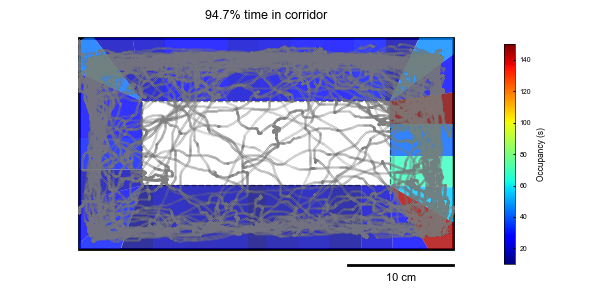

In [ ]:
# # =============================================================================
# # Linearization bin map with trajectory overlay + corridor occupancy
# # =============================================================================
# import importlib
# import utils.GRC_helpers as GRC_helpers
# importlib.reload(GRC_helpers)
# from utils.GRC_helpers import *

# # Parameters for linearization
# arena_width = 35.5  # cm
# arena_height = 20.0  # cm
# corner_radius = 6.0  # cm (radius of rounded corners for linearization)
# corridor_width = 6.0  # cm (width of the corridor from wall)
# lin_bin_size = 3   # cm (same as your spatial bin size)

# # --- Compute corridor occupancy per linearized bin ---
# lin_result = linearize_position_rounded_corridor(
#     x_neural, y_neural,
#     width=arena_width, height=arena_height,
#     corner_radius=corner_radius, corridor_width=corridor_width,
#     origin='corner',
# )
# lin_pos = lin_result['linear_pos']
# in_corridor = lin_result['in_corridor']

# bins_info = compute_linearization_bins(arena_width, arena_height, corner_radius, lin_bin_size)
# bin_edges = bins_info['bin_edges']
# n_bins = bins_info['n_bins']

# # Count frames per bin (corridor only), convert to seconds
# bin_idx = np.digitize(lin_pos, bin_edges) - 1
# bin_idx = np.clip(bin_idx, 0, n_bins - 1)
# occupancy_frames = np.zeros(n_bins)
# for i in range(len(lin_pos)):
#     if in_corridor[i]:
#         occupancy_frames[bin_idx[i]] += 1
# occupancy_s = occupancy_frames / frame_rate

# # Percentage of time in corridor
# pct_in_corridor = 100 * in_corridor.sum() / len(in_corridor)

# # --- Plot ---
# fig, ax = plt.subplots(figsize=(6, 3))

# # Bin map colored by occupancy (magma)
# fig, ax = plot_linearization_bin_map(
#     width=arena_width,
#     height=arena_height,
#     corner_radius=corner_radius,
#     corridor_width=corridor_width,
#     bin_size=lin_bin_size,
#     ax=ax,
#     cmap='jet',
#     show_bin_numbers=False,
#     alpha=0.8,
#     bin_values=occupancy_s,
#     colorbar=True,
#     colorbar_label='Occupancy (s)',
# )

# # Overlay trajectory in gray
# x_plot = np.asarray(x_neural, dtype=float) - arena_width / 2
# y_plot = np.asarray(y_neural, dtype=float) - arena_height / 2
# ax.plot(x_plot, y_plot, '.', color='gray', markersize=0.3, alpha=0.3, zorder=5, rasterized=True)

# # Remove axis
# ax.axis('off')
# ax.set_title('')

# # Text: percentage of time in corridor
# half_w = arena_width / 2
# half_h = arena_height / 2
# ax.text(0, half_h + 1.5, f'{pct_in_corridor:.1f}% time in corridor',
#         ha='center', va='bottom', fontsize=9)

# # Add 10 cm scale bar at bottom
# sb_y = -half_h - 1.5
# sb_x0 = half_w - 10
# ax.plot([sb_x0, sb_x0 + 10], [sb_y, sb_y], 'k-', linewidth=2, clip_on=False)
# ax.text(sb_x0 + 5, sb_y - 0.8, '10 cm', ha='center', va='top', fontsize=8)

# plt.tight_layout()

# out_path = os.path.join(figure_save_folder, f'linearization_bin_map_with_occupancy.svg')
# plt.rcParams['svg.fonttype'] = 'none'
# fig.savefig(out_path, dpi=300, bbox_inches='tight')
# print(f'Saved to {out_path}')
# plt.show()

In [ ]:
# # =============================================================================
# # Linearized PF Raster Plots for All Place Cells (CW/CCW Separated)
# # =============================================================================
# # This cell generates raster plots with 3 columns: All | CW | CCW
# # 
# # Traversal Detection (3-Zone State Machine):
# # - Left Buffer:  [-(core+buffer), -core)  e.g., [-15, -5)
# # - Core:         [-core, core]            e.g., [-5, 5]
# # - Right Buffer: (core, core+buffer]      e.g., (5, 15]
# #
# # CW Sequence:  Left_Buffer -> Core -> Right_Buffer
# # CCW Sequence: Right_Buffer -> Core -> Left_Buffer

# # Reload the module to get the new functions
# import importlib
# import utils.GRC_helpers as GRC_helpers
# importlib.reload(GRC_helpers)
# from utils.GRC_helpers import plot_linearized_pf_raster_directional

# # Create output directory
# linearized_raster_dir = os.path.join(figure_save_folder, 'linearized_pf_rasters_directional')
# os.makedirs(linearized_raster_dir, exist_ok=True)

# # ============ Traversal Detection Parameters (tune these!) ============
# core_radius = 10.0          # Radius of core zone around PF center (cm)
# buffer_width = 40.0        # Width of buffer zones on each side (cm)
# min_speed = 1.0            # Minimum average speed for valid traversal (cm/s)
# reversal_threshold = 5.0  # Distance (cm) to move backward to trigger U-turn detection
# verbose = False             # Print debug info about traversal detection
# delete_plateau_spikes = True  # Remove CS spikes within plateau windows
# # ======================================================================

# place_cells_only = True
# show_plots = False

# # Get cell indices to process
# if place_cells_only:
#     cell_indices = [i for i, analysis in enumerate(PC_output_all) if analysis.get('is_place_cell', False)]
# else:
#     cell_indices = list(range(len(PC_output_all)))

# print(f"Processing {len(cell_indices)} {'place ' if place_cells_only else ''}cells...")
# print(f"Traversal detection: core=[-{core_radius}, {core_radius}] cm, buffer={buffer_width} cm, min_speed={min_speed} cm/s, reversal_threshold={reversal_threshold} cm")

# # Process each cell
# results_all = []
# for cell_idx in cell_indices:
#     print(f"\nProcessing Cell {cell_idx + 1}...")
    
#     result = plot_linearized_pf_raster_directional(
#         cell_idx,
#         x_neural, y_neural, speed, frame_rate,
#         refined_SS, all_CS_spikes, all_spikes,
#         PC_output_all,
#         traces=traces,
#         complex_bursts_dicts=complex_bursts_dicts,
#         width=arena_width,
#         height=arena_height,
#         corner_radius=corner_radius,
#         corridor_width=corridor_width,
#         bin_size=lin_bin_size,
#         speed_threshold=speed_threshold,
#         kernel_size=kernel_size,
#         filter_type='boxcar',
#         min_duration_s=min_duration_s,
#         merge_gap_s=merge_gap_s,
#         smooth_sigma=2,
#         moving_only=False,
#         origin='corner',
#         figsize=(8, 10),
#         trajectory_color='#cccccc',
#         trajectory_alpha=0.3,
#         ss_color='#026C80',
#         cs_color='#EE9B00',
#         plateau_color='red',
#         spike_size=5,
#         time_unit='min',
#         show_rate_map=True,
#         show_subthreshold=True,
#         theta_freqs=(4, 8),
#         slow_freqs=2,
#         plateau_min_duration_ms=100,
#         plateaus_dicts=plateaus_dicts,
#         # Traversal detection parameters (3-zone state machine)
#         core_radius=core_radius,
#         buffer_width=buffer_width,
#         min_speed=min_speed,
#         reversal_threshold=reversal_threshold,
#         normalize_slow_vm=False,
#         baseline_distance=20.0,  # cm distance from PF center to use for baseline for slow Vm
#         verbose=verbose,
#         delete_plateau_spikes=delete_plateau_spikes,
#     )
    
#     # Save figure
#     fig = result['fig']
#     out_path = os.path.join(linearized_raster_dir, f'Cell{cell_idx + 1}_linearized_raster_directional.svg')
#     plt.rcParams['svg.fonttype'] = 'none'
#     fig.savefig(out_path, dpi=300)
    
#     if not show_plots:
#         plt.close(fig)
    
#     pf_peak_info = result['pf_peak_info']
#     print(f"  CW: {result['n_cw_passes']} passes, {result['n_cw_frames']} frames")
#     print(f"  CCW: {result['n_ccw_passes']} passes, {result['n_ccw_frames']} frames")
#     print(f"  PF peak: {pf_peak_info['peak_linear_pos']:.1f} cm, rate: {pf_peak_info['peak_rate']:.2f} Hz")
#     print(f"  Saved to {out_path}")
    
#     results_all.append({
#         'cell_idx': cell_idx,
#         'n_cw_frames': result['n_cw_frames'],
#         'n_ccw_frames': result['n_ccw_frames'],
#         'n_cw_passes': result['n_cw_passes'],
#         'n_ccw_passes': result['n_ccw_passes'],
#         'pf_peak_info': pf_peak_info,
#     })

# print(f"\n=== Summary ===")
# print(f"Processed {len(results_all)} cells")
# print(f"Figures saved to: {linearized_raster_dir}")

Processing 5 place cells...
Traversal detection: core=[-10.0, 10.0] cm, buffer=40.0 cm, min_speed=1.0 cm/s, reversal_threshold=5.0 cm

Processing Cell 1...
  CW: 39 passes, 198731 frames
  CCW: 49 passes, 195473 frames
  PF peak: 85.5 cm, rate: 6.58 Hz
  Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce38_PX_20251126/linearized_pf_rasters_directional/Cell1_linearized_raster_directional.svg

Processing Cell 4...
  CW: 39 passes, 198731 frames
  CCW: 49 passes, 195473 frames
  PF peak: 85.5 cm, rate: 4.22 Hz
  Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce38_PX_20251126/linearized_pf_rasters_directional/Cell4_linearized_raster_directional.svg

Processing Cell 5...
  CW: 54 passes, 284878 frames
  CCW: 45 passes, 168850 frames
  PF peak: 34.5 cm, rate: 1.31 Hz
  Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_Place

# 2D subthreshold activity maps

In [65]:
# # Plot 2D map of theta and slow Vm amplitudes for each place cell

# theta_slow_save_dir = os.path.join(figure_save_folder, 'theta_slow_maps')
# os.makedirs(theta_slow_save_dir, exist_ok=True)

# for cell_idx, analysis in enumerate(PC_output_all):
#     if not analysis.get('is_place_cell', False):
#         continue
#     fig, axes, maps = plot_theta_slow_maps_by_state(
#         x_neural,
#         y_neural,
#         speed,
#         frame_rate,
#         traces,
#         analysis,
#         cell_idx,
#         theta_freqs=theta_freqs,
#         slow_freqs=slow_freqs,
#         speed_threshold=speed_threshold,
#         kernel_size=kernel_size,
#         filter_type='boxcar',
#         min_duration_s=min_duration_ms / 1000.0,
#         merge_gap_s=merge_gap_s,
#         smooth_sigma=2.0,
#         bad_timepoints=bad_masks if 'bad_masks' in globals() else None,
#         save_dir=theta_slow_save_dir,
#         show=True,
#     )
#     if fig is None:
#         continue
#     out_path = os.path.join(
#         theta_slow_save_dir,
#         f'theta_slow_maps_cell{cell_idx + 1}.svg',
#     )
#     fig.savefig(out_path, dpi=300)
#     print(f'Saved theta/slow maps for cell {cell_idx + 1} to {out_path}')



# CS shapes and metrics

Saved spike shape data to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/data/CKII_pAce46_PR_20260222/spike_shapes_PF.pkl


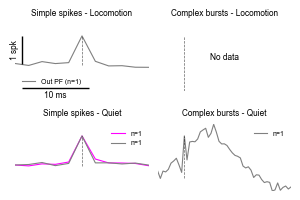

Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/SpikeShapes_PF_Grand.svg


In [66]:
place_cell_indices = [
    i for i, analysis in enumerate(PC_output_all)
    if analysis.get('is_place_cell', False)
]

grand_stack = {
    'simple': {'run_in': [], 'run_out': [], 'rest_in': [], 'rest_out': []},
    'complex': {'run_in': [], 'run_out': [], 'rest_in': [], 'rest_out': []},
}

time_ms_simple = None
time_ms_complex = None

figure_save_folder_spkshapes = os.path.join(figure_save_folder, 'SpikeShapes_PlaceCells')
os.makedirs(figure_save_folder_spkshapes, exist_ok=True)

if len(place_cell_indices) == 0:
    print('No place cells found for spike-shape plots.')
else:
    for cell_idx in place_cell_indices:
        analysis = PC_output_all[cell_idx]
        spike_shape_data = analysis.get('spike_shapes') if analysis is not None else None
        if not spike_shape_data:
            raise ValueError(
                'Missing `spike_shapes` in PC_output_all. Re-run place-cell analysis with save_spike_shapes=True.'
            )

        if time_ms_simple is None:
            time_ms_simple = spike_shape_data['simple']['time_ms']
        if time_ms_complex is None:
            time_ms_complex = spike_shape_data['complex']['time_ms']

        for spike_type in ['simple', 'complex']:
            time_ms = time_ms_simple if spike_type == 'simple' else time_ms_complex
            for cond in ['run_in', 'run_out', 'rest_in', 'rest_out']:
                waves = spike_shape_data[spike_type]['shapes'][cond]
                if len(waves) < 10:
                    grand_stack[spike_type][cond].append(
                        np.full_like(time_ms, np.nan, dtype=float)
                    )
                else:
                    mean_wave = np.nanmean(np.vstack(waves), axis=0)
                    grand_stack[spike_type][cond].append(mean_wave)

    if time_ms_simple is not None and time_ms_complex is not None:
        # Save spike shape data for cross-FOV pooling
        spike_shapes_out = os.path.join(data_folder, 'spike_shapes_PF.pkl')
        with open(spike_shapes_out, 'wb') as f:
            pickle.dump({
                'time_ms': {'simple': time_ms_simple, 'complex': time_ms_complex},
                'grand_stack': grand_stack,
            }, f)
        print(f'Saved spike shape data to {spike_shapes_out}')

        grand_out_path = os.path.join(
            figure_save_folder,
            f"SpikeShapes_PF_Grand.svg",
        )
        plot_spike_shape_grand_average(
            {'simple': time_ms_simple, 'complex': time_ms_complex},
            grand_stack,
            output_path=grand_out_path,
            show=True,
        )
        print(f"Saved to {grand_out_path}")
    else:
        print('No spike-shape data available for grand average.')

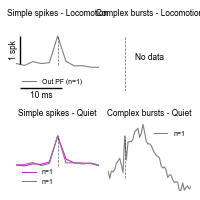

Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/SpikeShapes_PF_Grand.svg


In [67]:
if time_ms_simple is not None and time_ms_complex is not None:
    grand_out_path = os.path.join(
        figure_save_folder,
        f"SpikeShapes_PF_Grand.svg",
    )
    plot_spike_shape_grand_average(
        {'simple': time_ms_simple, 'complex': time_ms_complex},
        grand_stack,
        output_path=grand_out_path,
        fig_size=(2, 2),
        show=True,
    )
    print(f"Saved to {grand_out_path}")
else:
    print('No spike-shape data available for grand average.')


Locomotion SS rate (Hz): n=1 (insufficient valid pairs)
Locomotion CB rate (Hz): n=1 (insufficient valid pairs)
Locomotion CB prob.: n=1 (insufficient valid pairs)
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/SpikeBurstRates_run.svg


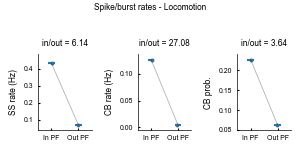

Quiet SS rate (Hz): n=1 (insufficient valid pairs)
Quiet CB rate (Hz): n=1 (insufficient valid pairs)
Quiet CB prob.: n=1 (insufficient valid pairs)
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/SpikeBurstRates_rest.svg


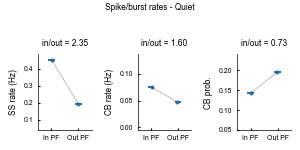

Saved rate metrics to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/data/CKII_pAce46_PR_20260222/spike_burst_rates_PF.pkl


In [68]:
conditions = ['run_in', 'run_out', 'rest_in', 'rest_out']
state_specs = [
    ('run', 'Locomotion'),
    ('rest', 'Quiet'),
]

min_cb_bursts_per_condition = 5
rate_metrics = {
    'simple_rate': {cond: [] for cond in conditions},
    'burst_rate': {cond: [] for cond in conditions},
    'burst_prob': {cond: [] for cond in conditions},
}
burst_counts = {cond: [] for cond in conditions}

for cell_idx, analysis in enumerate(PC_output_all):
    if not analysis.get('is_place_cell', False):
        continue
    if cell_idx >= len(complex_bursts_dicts) or cell_idx >= len(all_CS_spikes):
        continue
    if cell_idx >= len(refined_SS):
        continue

    params = analysis.get('params', {})
    width_real = params.get('width_real', 35.5)
    height_real = params.get('height_real', 20)
    bin_size = params.get('bin_size', 1.5)
    bins = [
        np.arange(0, width_real + bin_size, bin_size),
        np.arange(0, height_real + bin_size, bin_size),
    ]
    place_field_mask = np.asarray(analysis.get('place_field_mask', []), dtype=bool)
    if place_field_mask.size == 0 or not np.any(place_field_mask):
        continue

    valid_frames = (
        np.isfinite(x_neural)
        & np.isfinite(y_neural)
        & np.isfinite(speed)
    )
    bad_mask = None
    if bad_masks is not None and cell_idx < len(bad_masks):
        bad_mask = np.asarray(bad_masks[cell_idx])
        if bad_mask.dtype != bool:
            if bad_mask.ndim == 1 and bad_mask.size == len(speed):
                bad_mask = bad_mask.astype(bool)
            else:
                bad_mask = np.asarray(bad_mask, dtype=int)
                bad_mask = bad_mask[(bad_mask >= 0) & (bad_mask < len(speed))]
                bad_bool = np.zeros(len(speed), dtype=bool)
                bad_bool[bad_mask] = True
                bad_mask = bad_bool
        if bad_mask.shape[0] != len(speed):
            bad_mask = None
    if bad_mask is not None:
        valid_frames &= ~bad_mask
    inside_pf = positions_in_place_field(x_neural, y_neural, bins, place_field_mask)

    moving_mask = np.zeros(len(speed), dtype=bool)
    moving_idx = analysis.get('moving_indices', [])
    if moving_idx is not None and len(moving_idx) > 0:
        moving_mask[np.asarray(moving_idx, dtype=int)] = True
    else:
        moving_mask = (speed > speed_threshold) & valid_frames

    moving_mask &= valid_frames

    simple_events = np.asarray(refined_SS[cell_idx], dtype=int)
    simple_events = simple_events[(simple_events >= 0) & (simple_events < len(speed))]

    bursts = complex_bursts_dicts[cell_idx]
    starts = np.asarray(bursts.get('starts', []), dtype=int)
    ends = np.asarray(bursts.get('ends', []), dtype=int)
    cs_spikes = np.asarray(all_CS_spikes[cell_idx], dtype=int)
    cs_spikes = cs_spikes[(cs_spikes >= 0) & (cs_spikes < len(speed))]
    burst_events = []
    for start_idx, end_idx in zip(starts, ends):
        in_burst = cs_spikes[(cs_spikes >= start_idx) & (cs_spikes <= end_idx)]
        if in_burst.size == 0:
            continue
        burst_events.append(in_burst[0])
    burst_events = np.asarray(burst_events, dtype=int)

    cond_masks = {
        'run_in': moving_mask & inside_pf & valid_frames,
        'run_out': moving_mask & (~inside_pf) & valid_frames,
        'rest_in': (~moving_mask) & inside_pf & valid_frames,
        'rest_out': (~moving_mask) & (~inside_pf) & valid_frames,
    }

    for cond in conditions:
        mask = cond_masks[cond]
        time_s = np.sum(mask) / frame_rate
        if time_s <= 0:
            burst_counts[cond].append(0)
            rate_metrics['simple_rate'][cond].append(np.nan)
            rate_metrics['burst_rate'][cond].append(np.nan)
            rate_metrics['burst_prob'][cond].append(np.nan)
            continue

        simple_count = np.sum(mask[simple_events]) if simple_events.size > 0 else 0
        burst_count = np.sum(mask[burst_events]) if burst_events.size > 0 else 0
        total_events = simple_count + burst_count

        burst_counts[cond].append(burst_count)

        rate_metrics['simple_rate'][cond].append(simple_count / time_s)
        rate_metrics['burst_rate'][cond].append(burst_count / time_s)
        rate_metrics['burst_prob'][cond].append(
            (burst_count / total_events) if total_events > 0 else np.nan
        )

metric_specs = [
    ('simple_rate', 'SS rate (Hz)'),
    ('burst_rate', 'CB rate (Hz)'),
    ('burst_prob', 'CB prob.'),
]

from scipy import stats

def _paired_test(vals_in, vals_out):
    vals_in = np.asarray(vals_in, dtype=float)
    vals_out = np.asarray(vals_out, dtype=float)
    n_pairs = min(len(vals_in), len(vals_out))
    if n_pairs == 0:
        return np.nan, np.nan, 'n/a', 0, np.nan
    paired_in = vals_in[:n_pairs]
    paired_out = vals_out[:n_pairs]
    valid = np.isfinite(paired_in) & np.isfinite(paired_out)
    n_valid = int(np.sum(valid))
    if n_valid < 3:
        return np.nan, np.nan, 'n/a', n_valid, np.nan
    diffs = paired_in[valid] - paired_out[valid]
    try:
        shapiro_p = stats.shapiro(diffs).pvalue
    except ValueError:
        shapiro_p = np.nan
    if np.isfinite(shapiro_p) and shapiro_p >= 0.05:
        result = stats.ttest_rel(paired_in[valid], paired_out[valid], nan_policy='omit')
        return result.pvalue, result.statistic, 'paired t-test', n_valid, shapiro_p
    try:
        result = stats.wilcoxon(paired_in[valid], paired_out[valid])
        return result.pvalue, result.statistic, 'wilcoxon', n_valid, shapiro_p
    except ValueError:
        return np.nan, np.nan, 'wilcoxon', n_valid, shapiro_p

def _sig_label(p_val):
    if not np.isfinite(p_val):
        return ''
    if p_val < 0.001:
        return '***'
    if p_val < 0.01:
        return '**'
    if p_val < 0.05:
        return '*'
    return 'n.s.'

panel_w = 1.0
panel_h = 1.5
xlim = (0.5, 2.5)

def _global_ylim_from_vals(vals, pad_frac=0.08):
    finite = vals[np.isfinite(vals)]
    if finite.size == 0:
        return None
    y_min = np.nanmin(finite)
    y_max = np.nanmax(finite)
    y_span = y_max - y_min if y_max != y_min else 1.0
    pad = pad_frac * y_span
    return y_min - pad, y_max + pad

metric_ylim = {}
for metric_key, _ in metric_specs:
    all_vals = []
    for cond in conditions:
        arr = np.asarray(rate_metrics[metric_key][cond], dtype=float)
        finite = arr[np.isfinite(arr)]
        if finite.size > 0:
            all_vals.append(finite)
    if all_vals:
        metric_ylim[metric_key] = _global_ylim_from_vals(np.concatenate(all_vals))
    else:
        metric_ylim[metric_key] = None

for state_key, state_label in state_specs:
    fig, axes = plt.subplots(1, 3, figsize=(panel_w * 3, panel_h), sharex=True, sharey=False)
    conds = [f"{state_key}_in", f"{state_key}_out"]
    cond_labels = ['In PF', 'Out PF']

    counts_in = np.asarray(burst_counts[conds[0]], dtype=float)
    counts_out = np.asarray(burst_counts[conds[1]], dtype=float)
    if counts_in.size > 0 and counts_out.size > 0:
        pair_mask_cb = ~((counts_in < min_cb_bursts_per_condition) & (counts_out < min_cb_bursts_per_condition))
    else:
        pair_mask_cb = np.array([], dtype=bool)

    for ax, (metric_key, ylabel) in zip(axes, metric_specs):
        vals_in_raw = np.asarray(rate_metrics[metric_key][conds[0]], dtype=float)
        vals_out_raw = np.asarray(rate_metrics[metric_key][conds[1]], dtype=float)
        if metric_key in ('burst_rate', 'burst_prob') and pair_mask_cb.size > 0:
            vals_in = vals_in_raw[pair_mask_cb]
            vals_out = vals_out_raw[pair_mask_cb]
        else:
            vals_in = vals_in_raw
            vals_out = vals_out_raw
        mean_in = np.nanmean(vals_in) if np.any(np.isfinite(vals_in)) else np.nan
        mean_out = np.nanmean(vals_out) if np.any(np.isfinite(vals_out)) else np.nan
        if np.isfinite(mean_in) and np.isfinite(mean_out) and mean_out != 0:
            ratio_text = f"in/out = {mean_in / mean_out:.2f}"
        else:
            ratio_text = "in/out = n/a"
        ax.set_title(ratio_text, fontsize=6, fontname='Arial')

        plot_data = []
        for vals in [vals_in, vals_out]:
            finite = vals[np.isfinite(vals)]
            if finite.size == 0:
                finite = np.array([np.nan])
            plot_data.append(finite)

        parts = ax.violinplot(plot_data, positions=[1, 2], showmedians=True, showextrema=False)
        for body in parts['bodies']:
            body.set_alpha(0.3)
        if len(parts['bodies']) >= 2:
            parts['bodies'][0].set_facecolor('magenta')
            parts['bodies'][1].set_facecolor('gray')
            parts['bodies'][0].set_edgecolor('none')
            parts['bodies'][1].set_edgecolor('none')

        n_pairs = min(len(vals_in), len(vals_out))
        for i in range(n_pairs):
            if np.isfinite(vals_in[i]) and np.isfinite(vals_out[i]):
                ax.plot(
                    [1, 2],
                    [vals_in[i], vals_out[i]],
                    color='black',
                    alpha=0.3,
                    linewidth=0.6,
                )

        p_val, test_stat, test_name, n_valid, shapiro_p = _paired_test(vals_in, vals_out)
        sig_label = _sig_label(p_val)
        if np.isfinite(p_val):
            y_vals = np.concatenate([vals_in[np.isfinite(vals_in)], vals_out[np.isfinite(vals_out)]])
            if y_vals.size > 0:
                y_max = np.nanmax(y_vals)
                y_min = np.nanmin(y_vals)
                y_span = y_max - y_min if y_max != y_min else 1.0
                y_off = 0.08 * y_span
                y_star = y_max + y_off
                if metric_ylim[metric_key] is not None:
                    y0, y1 = metric_ylim[metric_key]
                    y_span_global = y1 - y0 if y1 != y0 else 1.0
                    y_star = min(y_star, y1 - 0.05 * y_span_global)
                ax.text(
                    1.5,
                    y_star,
                    sig_label,
                    ha='center',
                    va='bottom',
                    fontsize=6,
                    fontname='Arial',
                )
            print(
                f"{state_label} {ylabel} ({test_name}): n={n_valid}, "
                f"stat={test_stat:.3g}, p={p_val:.3g}, shapiro_p={shapiro_p:.3g}"
            )
        else:
            print(f"{state_label} {ylabel}: n={n_valid} (insufficient valid pairs)")

        rng = np.random.default_rng(0)
        for idx, vals in enumerate([vals_in, vals_out], start=1):
            finite_mask = np.isfinite(vals)
            if not np.any(finite_mask):
                continue
            jitter = (rng.random(np.sum(finite_mask)) - 0.5) * 0.12
            xs = idx + jitter
            ax.scatter(
                xs,
                vals[finite_mask],
                s=8,
                color='black',
                alpha=0.6,
                linewidths=0,
            )

        ax.set_xticks([1, 2])
        ax.set_xticklabels(
            cond_labels,
            fontsize=5,
            fontname='Arial',
        )
        ax.set_ylabel(ylabel, fontsize=6, fontname='Arial')
        ax.tick_params(labelsize=5)
        ax.set_xlim(*xlim)
        if metric_ylim[metric_key] is not None:
            ax.set_ylim(*metric_ylim[metric_key])
        for label in list(ax.get_yticklabels()):
            label.set_fontname('Arial')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    fig.suptitle(
        f"Spike/burst rates - {state_label}",
        fontsize=6,
        fontname='Arial',
    )
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    out_path = os.path.join(
        figure_save_folder,
        f"SpikeBurstRates_{state_key}.svg",
    )
    fig.savefig(out_path, dpi=300)
    print(f"Saved to {out_path}")
    plt.show()

# Save rate metrics for pooling
rate_metrics_out = os.path.join(data_folder, 'spike_burst_rates_PF.pkl')
with open(rate_metrics_out, 'wb') as f:
    pickle.dump({
        'rate_metrics': rate_metrics,
        'burst_counts': burst_counts,
        'conditions': conditions,
        'min_cb_bursts_per_condition': min_cb_bursts_per_condition,
    }, f)
print(f'Saved rate metrics to {rate_metrics_out}')

Locomotion Spks./burst: not enough data for violinplot
Locomotion Peak amp: not enough data for violinplot
Locomotion Duration (ms): not enough data for violinplot
Locomotion AUC: not enough data for violinplot
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/ComplexBurstMetrics_run.svg


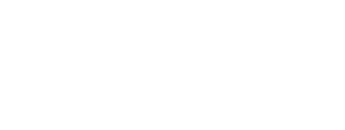

Quiet Spks./burst: not enough data for violinplot
Quiet Peak amp: not enough data for violinplot
Quiet Duration (ms): not enough data for violinplot
Quiet AUC: not enough data for violinplot
Saved to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/figures/CKII_pAce46_PR_20260222/ComplexBurstMetrics_rest.svg


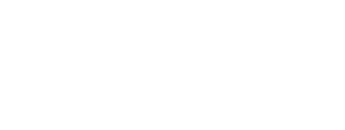

Saved burst metrics to /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/data/CKII_pAce46_PR_20260222/burst_metrics_PF.pkl


In [69]:
# Complex (and optional simple) burst metrics by PF and locomotion state (from burst_metrics)
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

include_simple_bursts = False

conditions = ['run_in', 'run_out', 'rest_in', 'rest_out']
condition_labels = ['In PF', 'Out PF']

min_bursts_per_condition = 5

metric_specs = [
    ('n_spikes', 'Spks./burst'),
    ('peak_amp', 'Peak amp'),
    ('duration_ms', 'Duration (ms)'),
    ('auc', 'AUC'),
]

metric_data = {
    'complex': {metric: {cond: [] for cond in conditions} for metric, _ in metric_specs},
    'simple': {metric: {cond: [] for cond in conditions} for metric, _ in metric_specs},
}
cond_counts = {
    'complex': {cond: [] for cond in conditions},
    'simple': {cond: [] for cond in conditions},
}

for cell_idx, analysis in enumerate(PC_output_all):
    if not analysis.get('is_place_cell', False):
        continue
    if cell_idx >= len(burst_metrics):
        continue

    bursts = burst_metrics[cell_idx]
    if not bursts:
        continue

    params = analysis.get('params', {})
    width_real = params.get('width_real', 35.5)
    height_real = params.get('height_real', 20)
    bin_size = params.get('bin_size', 1.5)
    bins = [
        np.arange(0, width_real + bin_size, bin_size),
        np.arange(0, height_real + bin_size, bin_size),
    ]
    place_field_mask = np.asarray(analysis.get('place_field_mask', []), dtype=bool)
    if place_field_mask.size == 0 or not np.any(place_field_mask):
        continue
    inside_pf = positions_in_place_field(x_neural, y_neural, bins, place_field_mask)

    moving_mask = np.zeros(len(speed), dtype=bool)

    bad_mask = None
    if bad_masks is not None and cell_idx < len(bad_masks):
        bad_mask = np.asarray(bad_masks[cell_idx])
        if bad_mask.dtype != bool:
            if bad_mask.ndim == 1 and bad_mask.size == len(speed):
                bad_mask = bad_mask.astype(bool)
            else:
                bad_mask = np.asarray(bad_mask, dtype=int)
                bad_mask = bad_mask[(bad_mask >= 0) & (bad_mask < len(speed))]
                bad_bool = np.zeros(len(speed), dtype=bool)
                bad_bool[bad_mask] = True
                bad_mask = bad_bool
        if bad_mask.shape[0] != len(speed):
            bad_mask = None
    moving_idx = analysis.get('moving_indices', [])
    if moving_idx is not None and len(moving_idx) > 0:
        moving_mask[np.asarray(moving_idx, dtype=int)] = True

    per_cond = {
        'complex': {cond: {metric: [] for metric, _ in metric_specs} for cond in conditions},
        'simple': {cond: {metric: [] for metric, _ in metric_specs} for cond in conditions},
    }

    for burst in bursts:
        is_complex = bool(burst.get('is_complex'))
        is_single = bool(burst.get('is_single'))
        if is_complex:
            burst_type = 'complex'
        elif include_simple_bursts and (not is_single):
            burst_type = 'simple'
        else:
            continue

        start_idx = int(burst.get('start', -1))
        if start_idx < 0 or start_idx >= len(speed):
            continue
        if bad_mask is not None and bad_mask[start_idx]:
            continue
        if not (
            np.isfinite(speed[start_idx])
            and np.isfinite(x_neural[start_idx])
            and np.isfinite(y_neural[start_idx])
        ):
            continue

        state = 'run' if moving_mask[start_idx] else 'rest'
        pf = 'in' if inside_pf[start_idx] else 'out'
        cond = f"{state}_{pf}"
        if cond not in per_cond[burst_type]:
            continue

        per_cond[burst_type][cond]['n_spikes'].append(float(burst.get('n_spikes', np.nan)))
        per_cond[burst_type][cond]['peak_amp'].append(float(burst.get('peak_amp', np.nan)))
        per_cond[burst_type][cond]['duration_ms'].append(float(burst.get('duration_ms', np.nan)))
        per_cond[burst_type][cond]['auc'].append(float(burst.get('auc', np.nan)))

    for burst_type in ['complex', 'simple']:
        if burst_type == 'simple' and (not include_simple_bursts):
            continue
        for cond in conditions:
            cond_counts[burst_type][cond].append(len(per_cond[burst_type][cond]['n_spikes']))
            for metric, _ in metric_specs:
                if len(per_cond[burst_type][cond][metric]) >= min_bursts_per_condition:
                    metric_data[burst_type][metric][cond].append(
                        np.nanmean(per_cond[burst_type][cond][metric])
                    )
                else:
                    metric_data[burst_type][metric][cond].append(np.nan)


def _paired_test(vals_in, vals_out):
    vals_in = np.asarray(vals_in, dtype=float)
    vals_out = np.asarray(vals_out, dtype=float)
    n_pairs = min(len(vals_in), len(vals_out))
    if n_pairs == 0:
        return np.nan, np.nan, 'n/a', 0, np.nan
    paired_in = vals_in[:n_pairs]
    paired_out = vals_out[:n_pairs]
    valid = np.isfinite(paired_in) & np.isfinite(paired_out)
    n_valid = int(np.sum(valid))
    if n_valid < 3:
        return np.nan, np.nan, 'n/a', n_valid, np.nan
    diffs = paired_in[valid] - paired_out[valid]
    try:
        shapiro_p = stats.shapiro(diffs).pvalue
    except ValueError:
        shapiro_p = np.nan
    if np.isfinite(shapiro_p) and shapiro_p >= 0.05:
        result = stats.ttest_rel(paired_in[valid], paired_out[valid], nan_policy='omit')
        return result.pvalue, result.statistic, 'paired t-test', n_valid, shapiro_p
    try:
        result = stats.wilcoxon(paired_in[valid], paired_out[valid])
        return result.pvalue, result.statistic, 'wilcoxon', n_valid, shapiro_p
    except ValueError:
        return np.nan, np.nan, 'wilcoxon', n_valid, shapiro_p


def _sig_label(p_val):
    if not np.isfinite(p_val):
        return ''
    if p_val < 0.001:
        return '***'
    if p_val < 0.01:
        return '**'
    if p_val < 0.05:
        return '*'
    return 'n.s.'


def _global_ylim(arrays, pad_frac=0.08):
    vals = []
    for arr in arrays:
        arr = np.asarray(arr, dtype=float)
        finite = arr[np.isfinite(arr)]
        if finite.size > 0:
            vals.append(finite)
    if not vals:
        return None
    merged = np.concatenate(vals)
    y_min = np.nanmin(merged)
    y_max = np.nanmax(merged)
    y_span = y_max - y_min if y_max != y_min else 1.0
    pad = pad_frac * y_span
    return y_min - pad, y_max + pad


metric_ylim = {}
for metric, _ in metric_specs:
    all_vals = []
    for cond in conditions:
        all_vals.append(np.asarray(metric_data['complex'][metric][cond], dtype=float))
        if include_simple_bursts:
            all_vals.append(np.asarray(metric_data['simple'][metric][cond], dtype=float))
    metric_ylim[metric] = _global_ylim(all_vals)

panel_w = 1.2
panel_h = 1.3
panel_w_eff = panel_w * (1.5 if include_simple_bursts else 1.0) * 0.72

state_specs = [
    ('run', 'Locomotion'),
    ('rest', 'Quiet'),
]

for state_key, state_label in state_specs:
    fig, axes = plt.subplots(1, 4, figsize=(panel_w_eff * 4, panel_h), sharex=True, sharey=False)
    conds = [f"{state_key}_in", f"{state_key}_out"]

    counts_in_complex = np.asarray(cond_counts['complex'][conds[0]], dtype=float)
    counts_out_complex = np.asarray(cond_counts['complex'][conds[1]], dtype=float)
    pair_mask_complex = (
        (counts_in_complex >= min_bursts_per_condition)
        & (counts_out_complex >= min_bursts_per_condition)
    )

    if include_simple_bursts:
        counts_in_simple = np.asarray(cond_counts['simple'][conds[0]], dtype=float)
        counts_out_simple = np.asarray(cond_counts['simple'][conds[1]], dtype=float)
        pair_mask_simple = (
            (counts_in_simple >= min_bursts_per_condition)
            & (counts_out_simple >= min_bursts_per_condition)
        )
    else:
        pair_mask_simple = None

    for ax, (metric_key, ylabel) in zip(axes, metric_specs):
        vals_in_complex = np.asarray(metric_data['complex'][metric_key][conds[0]], dtype=float)
        vals_out_complex = np.asarray(metric_data['complex'][metric_key][conds[1]], dtype=float)
        if pair_mask_complex.size > 0:
            vals_in_complex = vals_in_complex[pair_mask_complex]
            vals_out_complex = vals_out_complex[pair_mask_complex]
        else:
            vals_in_complex = np.array([], dtype=float)
            vals_out_complex = np.array([], dtype=float)

        plot_data = []
        positions = [1, 2]
        colors = ['magenta', 'gray']
        alphas = [0.3, 0.3]

        for vals in [vals_in_complex, vals_out_complex]:
            finite = vals[np.isfinite(vals)]
            if finite.size == 0:
                finite = np.array([np.nan])
            plot_data.append(finite)

        if include_simple_bursts:
            vals_in_simple = np.asarray(metric_data['simple'][metric_key][conds[0]], dtype=float)
            vals_out_simple = np.asarray(metric_data['simple'][metric_key][conds[1]], dtype=float)
            if pair_mask_simple is not None and pair_mask_simple.size > 0:
                vals_in_simple = vals_in_simple[pair_mask_simple]
                vals_out_simple = vals_out_simple[pair_mask_simple]
            else:
                vals_in_simple = np.array([], dtype=float)
                vals_out_simple = np.array([], dtype=float)

            for vals in [vals_in_simple, vals_out_simple]:
                finite = vals[np.isfinite(vals)]
                if finite.size == 0:
                    finite = np.array([np.nan])
                plot_data.append(finite)

            positions.extend([3.5, 4.5])
            colors.extend(['magenta', 'gray'])
            alphas.extend([0.15, 0.15])

        if any(len(arr) < 2 for arr in plot_data):
            print(f"{state_label} {ylabel}: not enough data for violinplot")
            ax.axis("off")
            continue
        parts = ax.violinplot(plot_data, positions=positions, showmedians=True, showextrema=False)
        for body, color, alpha in zip(parts['bodies'], colors, alphas):
            body.set_facecolor(color)
            body.set_edgecolor('none')
            body.set_alpha(alpha)

        n_pairs = min(len(vals_in_complex), len(vals_out_complex))
        for i in range(n_pairs):
            if np.isfinite(vals_in_complex[i]) and np.isfinite(vals_out_complex[i]):
                ax.plot([1, 2], [vals_in_complex[i], vals_out_complex[i]], color='black', alpha=0.3, linewidth=0.6)

        rng = np.random.default_rng(0)
        for pos, vals in zip([1, 2], [vals_in_complex, vals_out_complex]):
            finite_mask = np.isfinite(vals)
            if not np.any(finite_mask):
                continue
            jitter = (rng.random(np.sum(finite_mask)) - 0.5) * 0.12
            xs = pos + jitter
            ax.scatter(xs, vals[finite_mask], s=8, color='black', alpha=0.6, linewidths=0)

        p_val, test_stat, test_name, n_valid, shapiro_p = _paired_test(vals_in_complex, vals_out_complex)
        sig_label = _sig_label(p_val)
        if np.isfinite(p_val):
            print(
                f"{state_label} {ylabel} (complex {test_name}): n={n_valid}, "
                f"stat={test_stat:.3g}, p={p_val:.3g}, shapiro_p={shapiro_p:.3g}"
            )
        else:
            print(f"{state_label} {ylabel} (complex): n={n_valid} (insufficient valid pairs)")
        if sig_label:
            y_vals = np.concatenate([
                vals_in_complex[np.isfinite(vals_in_complex)],
                vals_out_complex[np.isfinite(vals_out_complex)],
            ])
            if y_vals.size > 0:
                y_max = np.nanmax(y_vals)
                y_min = np.nanmin(y_vals)
                y_span = y_max - y_min if y_max != y_min else 1.0
                y_star = y_max + 0.08 * y_span
                ylim = metric_ylim.get(metric_key)
                if ylim is not None:
                    y0, y1 = ylim
                    y_span_global = y1 - y0 if y1 != y0 else 1.0
                    y_star = min(y_star, y1 - 0.05 * y_span_global)
                ax.text(1.5, y_star, sig_label, ha='center', va='bottom', fontsize=6, fontname='Arial')

        if include_simple_bursts:
            n_pairs_simple = min(len(vals_in_simple), len(vals_out_simple))
            for i in range(n_pairs_simple):
                if np.isfinite(vals_in_simple[i]) and np.isfinite(vals_out_simple[i]):
                    ax.plot([3.5, 4.5], [vals_in_simple[i], vals_out_simple[i]], color='black', alpha=0.2, linewidth=0.6)

            for pos, vals in zip([3.5, 4.5], [vals_in_simple, vals_out_simple]):
                finite_mask = np.isfinite(vals)
                if not np.any(finite_mask):
                    continue
                jitter = (rng.random(np.sum(finite_mask)) - 0.5) * 0.12
                xs = pos + jitter
                ax.scatter(xs, vals[finite_mask], s=8, color='black', alpha=0.4, linewidths=0)

            p_val_s, stat_s, test_s, n_s, shapiro_s = _paired_test(vals_in_simple, vals_out_simple)
            sig_label_s = _sig_label(p_val_s)
            if np.isfinite(p_val_s):
                print(
                    f"{state_label} {ylabel} (simple {test_s}): n={n_s}, "
                    f"stat={stat_s:.3g}, p={p_val_s:.3g}, shapiro_p={shapiro_s:.3g}"
                )
            else:
                print(f"{state_label} {ylabel} (simple): n={n_s} (insufficient valid pairs)")
            if sig_label_s:
                y_vals = np.concatenate([
                    vals_in_simple[np.isfinite(vals_in_simple)],
                    vals_out_simple[np.isfinite(vals_out_simple)],
                ])
                if y_vals.size > 0:
                    y_max = np.nanmax(y_vals)
                    y_min = np.nanmin(y_vals)
                    y_span = y_max - y_min if y_max != y_min else 1.0
                    y_star = y_max + 0.08 * y_span
                    ylim = metric_ylim.get(metric_key)
                    if ylim is not None:
                        y0, y1 = ylim
                        y_span_global = y1 - y0 if y1 != y0 else 1.0
                        y_star = min(y_star, y1 - 0.05 * y_span_global)
                    ax.text(4.0, y_star, sig_label_s, ha='center', va='bottom', fontsize=6, fontname='Arial')

        if include_simple_bursts:
            ax.set_xticks([1, 2, 3.5, 4.5])
            ax.set_xticklabels(condition_labels + condition_labels, fontsize=5, fontname='Arial')
            ax.set_xlim(0.5, 5.0)
        else:
            ax.set_xticks([1, 2])
            ax.set_xticklabels(condition_labels, fontsize=5, fontname='Arial')
            ax.set_xlim(0.5, 2.5)

        ax.set_ylabel(ylabel, fontsize=6, fontname='Arial')
        ax.tick_params(labelsize=5)
        ylim = metric_ylim.get(metric_key)
        if ylim is not None:
            ax.set_ylim(*ylim)
        for label in list(ax.get_yticklabels()):
            label.set_fontname('Arial')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    #fig.suptitle(f"Complex burst metrics - {state_label}", fontsize=7, fontname='Arial')
    plt.tight_layout(rect=[0, 0, 1, 0.92])

    out_path = os.path.join(
        figure_save_folder,
        f"ComplexBurstMetrics_{state_key}.svg",
    )
    fig.savefig(out_path, dpi=300)
    print(f"Saved to {out_path}")
    plt.show()

# Save burst metrics for pooling
burst_metrics_out = os.path.join(data_folder, 'burst_metrics_PF.pkl')
with open(burst_metrics_out, 'wb') as f:
    pickle.dump({
        'metric_data': metric_data,
        'cond_counts': cond_counts,
        'conditions': conditions,
        'metric_specs': metric_specs,
        'min_bursts_per_condition': min_bursts_per_condition,
        'include_simple_bursts': include_simple_bursts,
    }, f)
print(f'Saved burst metrics to {burst_metrics_out}')


# Collect Comprehensive Statistics for Pooling

Collects all relevant statistics for place cells and all cells, saving for cross-animal pooling.

In [70]:
# Import helper functions from GRC_helpers
from utils.GRC_helpers import (
    calculate_spatial_information_bits_per_spike,
    get_place_field_sizes_cm,
    compute_in_out_ratio,
    compute_theta_slow_in_out,
    _compute_moving_epochs,
)
print('Helper functions imported from GRC_helpers')

Helper functions imported from GRC_helpers


In [71]:
# Collect all statistics

# Compute moving/quiet masks
n_frames = len(x_neural)
speed_arr = np.asarray(speed, dtype=float)
speed_clean = speed_arr.copy()
speed_clean[speed_clean > 50] = np.nan
valid_frames = np.isfinite(speed_clean) & np.isfinite(x_neural) & np.isfinite(y_neural)
speed_for_epochs = speed_clean.copy()
speed_for_epochs[~valid_frames] = np.nan

_, _, moving_idx = _compute_moving_epochs(
    speed_for_epochs, frame_rate, kernel_size=kernel_size, filter_type="boxcar",
    speed_threshold=speed_threshold, min_duration_s=min_duration_s, merge_gap_s=merge_gap_s,
)
moving_mask = np.zeros(n_frames, dtype=bool)
if len(moving_idx) > 0:
    moving_mask[moving_idx] = True
moving_mask &= valid_frames
quiet_mask = valid_frames & (~moving_mask)

loco_time = np.sum(moving_mask) / frame_rate
quiet_time = np.sum(quiet_mask) / frame_rate

# Bins for spatial analysis
bin_size = 1.5
width_real, height_real = 35.5, 20.0
bins = [np.arange(0, width_real + bin_size, bin_size), np.arange(0, height_real + bin_size, bin_size)]

# Collect stats for all cells
all_cells_stats = []

for cell_idx in tqdm(range(len(spikes)), desc='Collecting stats'):
    stats = {'cell_idx': cell_idx}
    
    # Get spikes
    all_spk = np.asarray(spikes[cell_idx], dtype=int)
    ss_spk = np.asarray(refined_SS[cell_idx], dtype=int) if refined_SS is not None else all_spk
    cs_spk = np.asarray(all_CS_spikes[cell_idx], dtype=int) if all_CS_spikes is not None else np.array([], dtype=int)
    all_spk = all_spk[(all_spk >= 0) & (all_spk < n_frames)]
    ss_spk = ss_spk[(ss_spk >= 0) & (ss_spk < n_frames)]
    cs_spk = cs_spk[(cs_spk >= 0) & (cs_spk < n_frames)]
    
    # 1. Firing rates for ALL CELLS
    for name, spk in [('all', all_spk), ('ss', ss_spk), ('cs', cs_spk)]:
        n_loco = np.sum(moving_mask[spk]) if len(spk) > 0 else 0
        n_quiet = np.sum(quiet_mask[spk]) if len(spk) > 0 else 0
        stats[f'{name}_rate_loco'] = n_loco / loco_time if loco_time > 0 else np.nan
        stats[f'{name}_rate_quiet'] = n_quiet / quiet_time if quiet_time > 0 else np.nan
    
    # 2. Get place cell analysis result
    analysis = PC_output_all[cell_idx] if PC_output_all is not None else None
    stats['is_place_cell'] = analysis['is_place_cell'] if analysis else False
    stats['si'] = analysis['si'] if analysis else np.nan
    stats['p_value'] = analysis['p_value'] if analysis else np.nan
    
    # SS/CS specific place cell flags and correlations (always include if analysis exists)
    if analysis:
        stats['is_place_cell_ss'] = analysis.get('is_place_cell_ss', False)
        stats['is_place_cell_cs'] = analysis.get('is_place_cell_cs', False)
        stats['ss_si'] = analysis.get('ss_si', np.nan)
        stats['ss_p_value'] = analysis.get('ss_p_value', np.nan)
        stats['cs_si'] = analysis.get('cs_si', np.nan)
        stats['cs_p_value'] = analysis.get('cs_p_value', np.nan)
        # Theta/Slow correlations with rate maps
        stats['theta_corr_all'] = analysis.get('theta_corr_all', np.nan)
        stats['theta_corr_ss'] = analysis.get('theta_corr_ss', np.nan)
        stats['theta_corr_cs'] = analysis.get('theta_corr_cs', np.nan)
        stats['slow_corr_all'] = analysis.get('slow_corr_all', np.nan)
        stats['slow_corr_ss'] = analysis.get('slow_corr_ss', np.nan)
        stats['slow_corr_cs'] = analysis.get('slow_corr_cs', np.nan)
    else:
        stats['is_place_cell_ss'] = False
        stats['is_place_cell_cs'] = False
        stats['ss_si'] = np.nan
        stats['ss_p_value'] = np.nan
        stats['cs_si'] = np.nan
        stats['cs_p_value'] = np.nan
        stats['theta_corr_all'] = np.nan
        stats['theta_corr_ss'] = np.nan
        stats['theta_corr_cs'] = np.nan
        stats['slow_corr_all'] = np.nan
        stats['slow_corr_ss'] = np.nan
        stats['slow_corr_cs'] = np.nan
    
    # Place cell specific stats — all read from analyze_place_cell_single_moving output
    if analysis is None or not analysis.get('is_place_cell', False):
        # Initialize NaN for all place cell metrics
        for prefix in ['', '_ss', '_cs']:
            for key in [f'peak_rate{prefix}', f'si_bits_per_spike{prefix}', 
                        f'n_place_fields{prefix}', f'total_pf_size_cm2{prefix}']:
                stats[key.replace('_all', '')] = np.nan
            stats[f'place_field_sizes_cm2{prefix}'] = []
        stats['peak_rate_all'] = np.nan
        stats['peak_pct_in_ss'] = np.nan
        stats['peak_pct_in_cs'] = np.nan
        for spike_type in ['all', 'ss', 'cs']:
            for k in ['loco_in', 'loco_out', 'loco_ratio', 'quiet_in', 'quiet_out', 'quiet_ratio']:
                stats[f'{spike_type}_inout_{k}'] = np.nan
        for k in ['theta_loco_in', 'theta_loco_out', 'theta_quiet_in', 'theta_quiet_out',
                  'slow_loco_in', 'slow_loco_out', 'slow_quiet_in', 'slow_quiet_out']:
            stats[k] = np.nan
    else:
        pf_mask = analysis['place_field_mask']
        
        # Peak rates
        peak_all_raw = analysis['peak_rate']
        stats['peak_rate_all'] = peak_all_raw if np.isfinite(peak_all_raw) else 0.0
        stats['peak_rate_ss'] = analysis.get('ss_peak_rate', 0.0)
        stats['peak_rate_cs'] = analysis.get('cs_peak_rate', 0.0)
        
        # Peak %in
        for name, rmap_key in [('ss', 'ss_rate_map'), ('cs', 'cs_rate_map')]:
            rmap = analysis.get(rmap_key)
            if rmap is not None and np.any(pf_mask):
                peak_in = np.nanmax(rmap[pf_mask]) if np.any(np.isfinite(rmap[pf_mask])) else np.nan
                peak_all = np.nanmax(rmap)
                stats[f'peak_pct_in_{name}'] = (peak_in / peak_all * 100) if peak_all > 0 else np.nan
            else:
                stats[f'peak_pct_in_{name}'] = np.nan
        
        # Spatial info (bits/spike)
        stats['si_bits_per_spike'] = analysis.get('si_bits_per_spike', np.nan)
        stats['si_bits_per_spike_ss'] = analysis.get('si_bits_per_spike_ss', np.nan)
        stats['si_bits_per_spike_cs'] = analysis.get('si_bits_per_spike_cs', np.nan)
        
        # Place field count & sizes
        stats['n_place_fields'] = analysis.get('n_place_fields', 0)
        pf_sizes = analysis.get('pf_sizes', [0])
        stats['place_field_sizes_cm2'] = pf_sizes if pf_sizes else [0]
        stats['total_pf_size_cm2'] = analysis.get('field_area', 0.0)
        
        stats['n_place_fields_ss'] = analysis.get('n_ss_place_fields', 0)
        ss_pf_sizes = analysis.get('ss_pf_sizes', [0])
        stats['place_field_sizes_cm2_ss'] = ss_pf_sizes if ss_pf_sizes else [0]
        stats['total_pf_size_cm2_ss'] = analysis.get('ss_field_area', 0.0)
        
        stats['n_place_fields_cs'] = analysis.get('n_cs_place_fields', 0)
        cs_pf_sizes = analysis.get('cs_pf_sizes', [0])
        stats['place_field_sizes_cm2_cs'] = cs_pf_sizes if cs_pf_sizes else [0]
        stats['total_pf_size_cm2_cs'] = analysis.get('cs_field_area', 0.0)
        
        # In-out ratios (using original PF mask for all spike types)
        for name, spk in [('all', all_spk), ('ss', ss_spk), ('cs', cs_spk)]:
            inout = compute_in_out_ratio(spk, x_neural, y_neural, pf_mask, bins, moving_mask, quiet_mask, frame_rate)
            for k, v in inout.items():
                stats[f'{name}_inout_{k}'] = v
        
        # Theta/Slow in-out
        theta_slow = compute_theta_slow_in_out(Vms[cell_idx], x_neural, y_neural, pf_mask, bins,
                                                moving_mask, quiet_mask, frame_rate, theta_freqs, slow_freqs)
        stats.update(theta_slow)
    
    all_cells_stats.append(stats)

n_pcs = sum(1 for s in all_cells_stats if s.get('is_place_cell', False))
print(f'\nCollected stats for {len(all_cells_stats)} cells ({n_pcs} place cells)')
print(f'All place field and SI metrics come from analyze_place_cell_single_moving')


Collected stats for 9 cells (1 place cells)
All place field and SI metrics come from analyze_place_cell_single_moving


In [72]:
# Summary statistics
import pandas as pd

df_all = pd.DataFrame(all_cells_stats)
df_pc = df_all[df_all['is_place_cell'] == True].copy()

print("="*60)
print(f"SUMMARY: {len(df_all)} cells total, {len(df_pc)} place cells")
print("="*60)

# All cells: Firing rates
print("\n--- Firing Rates (All Cells) ---")
for name in ['all', 'ss', 'cs']:
    for state in ['loco', 'quiet']:
        col = f'{name}_rate_{state}'
        vals = df_all[col].dropna()
        print(f"  {name.upper()} {state}: {vals.mean():.3f} ± {vals.std():.3f} Hz (n={len(vals)})")

# Place cells only
print("\n--- Place Cell Metrics (n={}) ---".format(len(df_pc)))
print("\nPeak Rates:")
for name in ['all', 'ss', 'cs']:
    col = f'peak_rate_{name}'
    vals = df_pc[col].dropna()
    print(f"  Peak {name.upper()}: {vals.mean():.2f} ± {vals.std():.2f} Hz (n={len(vals)})")

print("\nPeak % in PF:")
for name in ['ss', 'cs']:
    col = f'peak_pct_in_{name}'
    vals = df_pc[col].dropna()
    print(f"  {name.upper()}: {vals.mean():.1f} ± {vals.std():.1f}% (n={len(vals)})")

print("\nSpatial Information:")
vals = df_pc['si_bits_per_spike'].dropna()
print(f"  SI: {vals.mean():.3f} ± {vals.std():.3f} bits/spike (n={len(vals)})")

print("\nPlace Field Count & Size:")
vals = df_pc['n_place_fields'].dropna()
print(f"  N fields: {vals.mean():.1f} ± {vals.std():.1f} (n={len(vals)})")
vals = df_pc['total_pf_size_cm2'].dropna()
print(f"  Total size: {vals.mean():.1f} ± {vals.std():.1f} cm² (n={len(vals)})")

print("\nIn-Out Ratios (Locomotion):")
for name in ['all', 'ss', 'cs']:
    col = f'{name}_inout_loco_ratio'
    vals = df_pc[col].dropna()
    print(f"  {name.upper()}: {vals.mean():.2f} ± {vals.std():.2f} (n={len(vals)})")

print("\nTheta Amplitude (in vs out):")
for state in ['loco', 'quiet']:
    in_col, out_col = f'theta_{state}_in', f'theta_{state}_out'
    in_vals, out_vals = df_pc[in_col].dropna(), df_pc[out_col].dropna()
    print(f"  {state.capitalize()}: in={in_vals.mean():.3f}±{in_vals.std():.3f}, out={out_vals.mean():.3f}±{out_vals.std():.3f}")

print("\nSlow Vm (in vs out):")
for state in ['loco', 'quiet']:
    in_col, out_col = f'slow_{state}_in', f'slow_{state}_out'
    in_vals, out_vals = df_pc[in_col].dropna(), df_pc[out_col].dropna()
    print(f"  {state.capitalize()}: in={in_vals.mean():.3f}±{in_vals.std():.3f}, out={out_vals.mean():.3f}±{out_vals.std():.3f}")

SUMMARY: 9 cells total, 1 place cells

--- Firing Rates (All Cells) ---
  ALL loco: 2.540 ± 5.091 Hz (n=9)
  ALL quiet: 2.287 ± 4.352 Hz (n=9)
  SS loco: 2.400 ± 5.056 Hz (n=9)
  SS quiet: 2.071 ± 4.345 Hz (n=9)
  CS loco: 0.140 ± 0.148 Hz (n=9)
  CS quiet: 0.217 ± 0.225 Hz (n=9)

--- Place Cell Metrics (n=1) ---

Peak Rates:
  Peak ALL: 1.01 ± nan Hz (n=1)
  Peak SS: 0.51 ± nan Hz (n=1)
  Peak CS: 0.51 ± nan Hz (n=1)

Peak % in PF:
  SS: 100.0 ± nan% (n=1)
  CS: 100.0 ± nan% (n=1)

Spatial Information:
  SI: 0.659 ± nan bits/spike (n=1)

Place Field Count & Size:
  N fields: 1.0 ± nan (n=1)
  Total size: 67.5 ± nan cm² (n=1)

In-Out Ratios (Locomotion):
  ALL: 8.24 ± nan (n=1)
  SS: 6.13 ± nan (n=1)
  CS: 13.52 ± nan (n=1)

Theta Amplitude (in vs out):
  Loco: in=0.067±nan, out=0.063±nan
  Quiet: in=0.070±nan, out=0.066±nan

Slow Vm (in vs out):
  Loco: in=-0.003±nan, out=0.012±nan
  Quiet: in=-0.044±nan, out=0.014±nan


In [73]:
# Save stats for pooling
save_df = df_all.drop(columns=['place_field_sizes_cm2'])  # Remove list column for CSV

# Save as pickle (preserves all data)
stats_save_path = os.path.join(data_folder, 'pooled_stats.pkl')
df_all.to_pickle(stats_save_path)
print(f"Saved pickle: {stats_save_path}")

# Save as CSV (for easy viewing)
csv_path = os.path.join(data_folder, 'pooled_stats.csv')
save_df.to_csv(csv_path, index=False)
print(f"Saved CSV: {csv_path}")

Saved pickle: /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/data/CKII_pAce46_PR_20260222/pooled_stats.pkl
Saved CSV: /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/data/CKII_pAce46_PR_20260222/pooled_stats.csv


In [74]:
# Save full spatial analysis results for recreating figures
# This includes rate maps, place field masks, trajectory data, etc.

spatial_save_path = os.path.join(data_folder, 'spatial_analysis_full.pkl')

# Helper function to get spike positions on trajectory
def _get_spike_positions_on_traj(spike_times, moving_idx, x_traj, y_traj, n_frames):
    """Get x, y positions of spikes during locomotion."""
    if spike_times is None or len(spike_times) == 0:
        return np.array([]), np.array([])
    spike_times = np.asarray(spike_times, dtype=int)
    spike_times = spike_times[(spike_times >= 0) & (spike_times < n_frames)]
    # Create binary train and subset to moving periods
    binary_full = np.zeros(n_frames, dtype=bool)
    binary_full[spike_times] = True
    binary_sub = binary_full[moving_idx]
    spikes_in_sub_idx = np.where(binary_sub)[0]
    if len(spikes_in_sub_idx) == 0:
        return np.array([]), np.array([])
    return x_traj[spikes_in_sub_idx], y_traj[spikes_in_sub_idx]

# Build a list with cell identification for pooling
spatial_results_for_pooling = []
n_frames_total = len(x_neural)

for cell_idx, analysis in enumerate(PC_output_all):
    if analysis is None:
        continue
    
    # Get SS and CS spike positions on trajectory
    moving_idx = analysis['moving_indices']
    x_traj = analysis['x_traj']
    y_traj = analysis['y_traj']
    
    ss_spikes_x, ss_spikes_y = _get_spike_positions_on_traj(
        refined_SS[cell_idx] if refined_SS is not None else None,
        moving_idx, x_traj, y_traj, n_frames_total
    )
    cs_spikes_x, cs_spikes_y = _get_spike_positions_on_traj(
        all_CS_spikes[cell_idx] if all_CS_spikes is not None else None,
        moving_idx, x_traj, y_traj, n_frames_total
    )
    
    cell_result = {
        'animal_id': data_name,  # e.g., 'CKII_pAce45_PX_20260118'
        'cell_idx': cell_idx,
        
        # Cell classification
        'is_place_cell': analysis['is_place_cell'],
        'is_place_cell_ss': analysis['is_place_cell_ss'],
        'is_place_cell_cs': analysis['is_place_cell_cs'],
        
        # Statistics (for quick filtering)
        'si': analysis['si'],
        'p_value': analysis['p_value'],
        'ss_si': analysis['ss_si'],
        'ss_p_value': analysis['ss_p_value'],
        'cs_si': analysis['cs_si'],
        'cs_p_value': analysis['cs_p_value'],
        
        # Peak rates
        'peak_rate': analysis['peak_rate'],
        'ss_peak_rate': analysis['ss_peak_rate'],
        'cs_peak_rate': analysis['cs_peak_rate'],
        
        # Rate maps (for recreating heatmaps)
        'rate_map': analysis['rate_map'],
        'ss_rate_map': analysis['ss_rate_map'],
        'cs_rate_map': analysis['cs_rate_map'],
        'ss_norm_map': analysis['ss_norm_map'],
        'cs_norm_map': analysis['cs_norm_map'],
        'occupancy': analysis['occupancy'],
        
        # Place field masks
        'place_field_mask': analysis['place_field_mask'],
        'ss_place_field_mask': analysis['ss_place_field_mask'],
        'cs_place_field_mask': analysis['cs_place_field_mask'],
        
        # Place field sizes (cm2) and counts — from analyze_place_cell_single_moving
        'pf_sizes': analysis.get('pf_sizes', [0]),
        'ss_pf_sizes': analysis.get('ss_pf_sizes', [0]),
        'cs_pf_sizes': analysis.get('cs_pf_sizes', [0]),
        'n_place_fields': analysis.get('n_place_fields', 0),
        'n_ss_place_fields': analysis.get('n_ss_place_fields', 0),
        'n_cs_place_fields': analysis.get('n_cs_place_fields', 0),
        'field_area': analysis.get('field_area', 0.0),
        'ss_field_area': analysis.get('ss_field_area', 0.0),
        'cs_field_area': analysis.get('cs_field_area', 0.0),
        
        # Spatial information (bits/spike)
        'si_bits_per_spike': analysis.get('si_bits_per_spike', np.nan),
        'si_bits_per_spike_ss': analysis.get('si_bits_per_spike_ss', np.nan),
        'si_bits_per_spike_cs': analysis.get('si_bits_per_spike_cs', np.nan),
        
        # Trajectory and spike positions (for row 1 of figure)
        'x_traj': analysis['x_traj'],
        'y_traj': analysis['y_traj'],
        'spikes_x': analysis['spikes_x'],
        'spikes_y': analysis['spikes_y'],
        # SS and CS spike positions separately
        'ss_spikes_x': ss_spikes_x,
        'ss_spikes_y': ss_spikes_y,
        'cs_spikes_x': cs_spikes_x,
        'cs_spikes_y': cs_spikes_y,
        
        # Correlations
        'theta_corr_all': analysis['theta_corr_all'],
        'theta_corr_ss': analysis['theta_corr_ss'],
        'theta_corr_cs': analysis['theta_corr_cs'],
        'slow_corr_all': analysis['slow_corr_all'],
        'slow_corr_ss': analysis['slow_corr_ss'],
        'slow_corr_cs': analysis['slow_corr_cs'],
        
        # Theta and slow Vm maps (for rows 5-6 of figure)
        'theta_map': analysis['theta_map'],
        'slow_map': analysis['slow_map'],
        
        # Waveform/metrics for pooling
        'spike_shapes': analysis.get('spike_shapes'),
        'burst_metrics': analysis.get('burst_metrics'),
        'spike_burst_rate_metrics': analysis.get('spike_burst_rate_metrics'),
        
        # Parameters used for analysis
        'params': analysis['params'],
    }
    spatial_results_for_pooling.append(cell_result)

with open(spatial_save_path, 'wb') as f:
    pickle.dump(spatial_results_for_pooling, f)

print(f"Saved {len(spatial_results_for_pooling)} cells to: {spatial_save_path}")
print(f"  - Place cells: {sum(1 for r in spatial_results_for_pooling if r['is_place_cell'])}")
print(f"  - CS+ place cells: {sum(1 for r in spatial_results_for_pooling if r['is_place_cell_cs'])}")
print(f"  - SS+ place cells: {sum(1 for r in spatial_results_for_pooling if r['is_place_cell_ss'])}")

Saved 9 cells to: /Users/qixinyang/Documents/AdamLab/miniVI_Renana_Pipeline/miniVI_PlaceCell_analysis_V4_2sessions/data/CKII_pAce46_PR_20260222/spatial_analysis_full.pkl
  - Place cells: 1
  - CS+ place cells: 1
  - SS+ place cells: 0
